In [87]:
import xlrd
import cmath
import math
from math import e
import numpy as np
import time
import scipy as sp
from scipy import optimize
from scipy.optimize import fmin
from scipy.linalg.misc import norm
from scipy.optimize import minimize

In [88]:
def Gauss_D(adj_matrix):
    GD = np.zeros((M, M))
    T = adj_matrix.transpose()
    # to control the kernel bandwidth
    # sum(sum(T*T)) is the total number of association exists in the relationship
    rd = M * 1. / sum(sum(T * T))
    for i in range(M):
        for j in range(M):
            GD[i][j] = e ** (-rd * (np.dot(T[i] - T[j], T[i] - T[j])))
    return GD

In [89]:
def Gauss_M(adj_matrix):
    GM = np.zeros((N, N))
    rm = N * 1. / sum(sum(adj_matrix * adj_matrix))
    for i in range(N):
        for j in range(N):
            GM[i][j] = e ** (-rm * (np.dot(adj_matrix[i, :] - adj_matrix[j, :], adj_matrix[i, :] - adj_matrix[j, :])))
    return GM

In [90]:
def AFinal_M(tM, tD, tQM, tQD):
    for i in range(len(tM)):
        tM[i] = tM[i].real
    for i in range(N):
        for j in range(N):
            tQM[i][j] = tQM[i][j].real
    C10 = np.kron(tD, tM)
    C20 = C10.copy()
    for i in range(len(C1)):
        C20[i] = 1. / (C10[i] + lamda * 1.)
    C30 = C20 * C10
    TtQM = tQM.transpose()
    TtQD = tQD.transpose()
    C40 = np.dot(TtQM, dmi_matrix)
    C50 = np.dot(C40, tQD)
    C60 = []
    for i in range(M):
        for j in range(N):
            C60.append(C50[j][i])
    C60 = np.array(C60)
    C70 = C30.copy()
    for i in range(len(C70)):
        C70[i] = C70[i] * C60[i]
    C0 = np.zeros((N, M))
    for z in range(M):
        for k in range(N):
            C0[k][z] = C70[N * z + k]
    A00 = np.dot(tQM, C0)
    Anew = np.dot(A00, TtQD)
    return Anew


In [91]:
def covert_file_to_matrix(file_dir):
    # convert the file to matrix
    return_matrix = []
    # open the known miRNA similarity file
    # there is 271 similarity score from a paper by Wang et. al
    # the other 224 similarity scores are calculated by Gaussian interaction profile kernel similarity
    with open(file_dir) as temp_opener:
        temp_lines = temp_opener.readlines()
        for line in temp_lines:
            line_str_list = line.split('\t')
            line_float_list = list(map(float, line_str_list))
            # if there is an association, assign 1 to the matrix
            return_matrix.append(line_float_list)

    return np.array(return_matrix)

In [92]:
# matrix size
N=495
M=383

In [93]:
# exam the file information
# with open(kdmi_dir) as myfile:
#     head = [next(myfile) for x in range(5)]
# print(head)

In [94]:
dmi_matrix = np.zeros((N, M))

In [102]:
kmda_dir = '../data/MKRMDA/knowndiseasemirnainteraction.txt'

In [103]:
# open the known miRNA-disease association file
# the first column represents miRNA
# the total number is N=495
# the second column represents disease
# the total number is M=383
with open(kmda_dir) as temp_opener:
    temp_lines = temp_opener.readlines()
    for line in temp_lines:
        line_str_list = line.split('\t')
        line_int_list = list(map(int, line_str_list))
        miRNA_code = line_int_list[0]
        disease_code = line_int_list[1]
        # if there is an association, assign 1 to the matrix
        dmi_matrix[miRNA_code - 1][disease_code - 1] = 1.0

In [104]:
dmi_matrix.shape

(495, 383)

In [105]:
# convert file to matrix
mirna_sim_dir = '../data/MKRMDA/mirnasimilarity.txt'
mirna_sim_matrix = covert_file_to_matrix(mirna_sim_dir)

In [106]:
mirna_sim_matrix.shape

(495, 495)

In [107]:
# convert file to matrix
dis_sim_1_dir = '../data/MKRMDA/diseasesimilarity1.txt'
dis_sim_1_matrix = covert_file_to_matrix(dis_sim_1_dir)

In [108]:
dis_sim_1_matrix

array([[1.        , 0.02465753, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.02465753, 1.        , 0.        , ..., 0.        , 0.02772964,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.06183369,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 0.02772964, 0.06183369, ..., 0.        , 1.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ]])

In [109]:
# convert file to matrix
dis_sim_2_dir = '../data/MKRMDA/diseasesimilarity2.txt'
dis_sim_2_matrix = covert_file_to_matrix(dis_sim_2_dir)

In [110]:
dis_sim_2_matrix

array([[1.        , 0.05182298, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.05182298, 1.        , 0.        , ..., 0.        , 0.0408674 ,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.05723914,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 0.0408674 , 0.05723914, ..., 0.        , 1.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ]])

In [111]:
# calcualte the Guassian kernel similarity between disease by using the miRNA-disease asscoation matrix
GKS_disease = Gauss_D(dmi_matrix)

In [112]:
GKS_disease

array([[1.        , 0.65494474, 0.46030095, ..., 0.86843013, 0.49394026,
        0.56877375],
       [0.65494474, 1.        , 0.46030095, ..., 0.7541709 , 0.49394026,
        0.56877375],
       [0.46030095, 0.46030095, 1.        , ..., 0.53003797, 0.34714558,
        0.61034037],
       ...,
       [0.86843013, 0.7541709 , 0.53003797, ..., 1.        , 0.56877375,
        0.65494474],
       [0.49394026, 0.49394026, 0.34714558, ..., 0.56877375, 1.        ,
        0.49394026],
       [0.56877375, 0.56877375, 0.61034037, ..., 0.65494474, 0.49394026,
        1.        ]])

In [113]:
# calcualte the Guassian kernel similarity between miRNA by using the miRNA-disease asscoation matrix
GKS_mirna = Gauss_M(dmi_matrix)

In [114]:
GKS_mirna

array([[1.        , 0.02173722, 0.09346523, ..., 0.07788778, 0.07788778,
        0.07788778],
       [0.02173722, 1.        , 0.07788778, ..., 0.06490656, 0.06490656,
        0.06490656],
       [0.09346523, 0.07788778, 1.        , ..., 0.16150738, 0.16150738,
        0.16150738],
       ...,
       [0.07788778, 0.06490656, 0.16150738, ..., 1.        , 1.        ,
        0.83333426],
       [0.07788778, 0.06490656, 0.16150738, ..., 1.        , 1.        ,
        0.83333426],
       [0.07788778, 0.06490656, 0.16150738, ..., 0.83333426, 0.83333426,
        1.        ]])

In [115]:
# calculate multiple kernels of disease
# take the average of the similarity matrices
KD0 = 1./3*(dis_sim_1_matrix+dis_sim_2_matrix+GKS_disease)

In [116]:
# calculate multiple kernels of miRNA
# take the average of the similarity matrics
KM0 = 1./2*(mirna_sim_matrix+GKS_mirna)

In [117]:
# taking the transpose
TKM0 = KM0.transpose()
TKD0 = KD0.transpose()

In [118]:
E = (KD0 + TKD0) / 2.
H = (KM0 + TKM0) / 2.

In [119]:
# compute the eigenvalues and right eigenvectors of a square array
# TD is the eigenvalues
# QD is the eigenvectors
# calculating the alpha
TD, QD = np.linalg.eig((KD0 + TKD0) / 2.)

In [120]:
TM, QM = np.linalg.eig((KM0 + TKM0) / 2.)

In [121]:
TM

array([ 1.14076056e+02+0.00000000e+00j,  2.90970840e+01+0.00000000e+00j,
        1.58019146e+01+0.00000000e+00j,  1.35275514e+01+0.00000000e+00j,
        6.50666042e+00+0.00000000e+00j,  5.97548470e+00+0.00000000e+00j,
        4.71836317e+00+0.00000000e+00j,  4.58534598e+00+0.00000000e+00j,
        4.41428090e+00+0.00000000e+00j,  4.12773433e+00+0.00000000e+00j,
        3.92436881e+00+0.00000000e+00j,  3.80011648e+00+0.00000000e+00j,
        3.28931247e+00+0.00000000e+00j,  3.19376614e+00+0.00000000e+00j,
        3.08921650e+00+0.00000000e+00j,  2.78465165e+00+0.00000000e+00j,
        2.75323675e+00+0.00000000e+00j,  2.38155174e+00+0.00000000e+00j,
        2.34612813e+00+0.00000000e+00j,  2.26565343e+00+0.00000000e+00j,
        2.16697974e+00+0.00000000e+00j,  2.09850827e+00+0.00000000e+00j,
        2.05706092e+00+0.00000000e+00j,  1.99122510e+00+0.00000000e+00j,
        1.92445526e+00+0.00000000e+00j,  1.87143674e+00+0.00000000e+00j,
        1.84552740e+00+0.00000000e+00j,  1.82170267

In [122]:
# transforming the eigenvalues to real numbers
for i in range(len(TM)):
    TM[i] = TM[i].real
for i in range(N):
    for j in range(N):
        QM[i][j] = QM[i][j].real

In [123]:
# 
lamda = 1.0
C1 = np.kron(TD, TM)

In [124]:
C1

array([8.03802055e+03+0.j, 2.05023707e+03+0.j, 1.11343360e+03+0.j, ...,
       3.33333333e-01+0.j, 3.33333333e-01+0.j, 3.33333333e-01+0.j])

In [125]:
C2 = C1.copy()
for i in range(len(C1)):
    C2[i] = 1. / (C1[i] + lamda * 1.)
C3 = C2 * C1

In [126]:
C3

array([0.99987561+0.j, 0.99951249+0.j, 0.99910268+0.j, ...,
       0.25      +0.j, 0.25      +0.j, 0.25      +0.j])

In [127]:
TQM = QM.transpose()
TQD = QD.transpose()
C4 = np.dot(TQM, dmi_matrix)
C5 = np.dot(C4, QD)
C6 = []
for i in range(M):
    for j in range(N):
        C6.append(C5[j][i])
C6 = np.array(C6)
print ('c6=', C6)

c6= [ 1.74330522e+00+0.j -6.14446305e+00+0.j -6.60388747e-01+0.j ...
 -2.40413065e-28+0.j  3.68299435e-29+0.j -2.61556694e-28+0.j]


In [128]:
C7 = C3.copy()
for i in range(len(C7)):
    C7[i] = C7[i] * C6[i]
print ('c7=', C7)

c7= [ 1.74308836e+00+0.j -6.14146756e+00+0.j -6.59796169e-01+0.j ...
 -6.01032661e-29+0.j  9.20748588e-30+0.j -6.53891735e-29+0.j]


In [129]:
C7.shape

(189585,)

In [130]:
C = np.zeros((N, M))
for z in range(M):
    for k in range(N):
        C[k][z] = C7[N * z + k]
print (C)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


[[ 1.74308836e+00  4.18604731e+00 -4.83178788e+00 ...  4.82449710e-01
   2.51223928e-14  6.51645505e-14]
 [-6.14146756e+00 -1.23971753e+01  1.03914467e+01 ... -6.97733740e-01
  -5.65774221e-14 -8.46879677e-14]
 [-6.59796169e-01 -1.21482336e+00  1.00753442e+00 ... -2.79868273e-01
  -1.73642630e-14 -2.17338468e-14]
 ...
 [-1.63959730e-14 -2.24490980e-14  1.09386326e-15 ... -1.90111813e-15
  -1.08443723e-28 -6.01032661e-29]
 [-2.24215442e-15 -3.96322121e-15  2.21251737e-15 ...  1.87658299e-16
   2.29170256e-29  9.20748588e-30]
 [ 3.10237253e-15  2.94630767e-15  1.12510171e-15 ... -6.52636069e-16
  -8.65281805e-29 -6.53891735e-29]]


In [131]:
C.shape

(495, 383)

In [132]:
A1 = np.dot(QM, C)
A = np.dot(A1, TQD)


In [133]:
A

array([[ 3.65330315e-01+0.j,  5.99433093e-03+0.j,  1.70169811e-02+0.j,
        ...,  1.03751707e-02+0.j, -3.34359581e-02+0.j,
         4.20736631e-02+0.j],
       [ 4.15910804e-01+0.j, -2.70845663e-03+0.j,  3.90616891e-03+0.j,
        ...,  3.94990135e-01+0.j, -2.20261658e-02+0.j,
         3.35327535e-03+0.j],
       [ 4.56725336e-01+0.j,  6.90415327e-03+0.j, -5.38285963e-03+0.j,
        ...,  2.63135561e-02+0.j,  4.14426678e-02+0.j,
        -2.98173732e-02+0.j],
       ...,
       [-1.94025227e-03+0.j, -3.08077427e-03+0.j, -3.85087097e-03+0.j,
        ..., -1.27346465e-03+0.j, -3.12978888e-03+0.j,
        -6.28659449e-04+0.j],
       [-1.94025227e-03+0.j, -3.08077427e-03+0.j, -3.85087097e-03+0.j,
        ..., -1.27346465e-03+0.j, -3.12978888e-03+0.j,
        -6.28659449e-04+0.j],
       [-1.20422087e-03+0.j,  1.56821532e-03+0.j, -3.66768333e-03+0.j,
        ..., -1.31432191e-03+0.j,  6.04141823e-03+0.j,
        -2.67513828e-04+0.j]])

In [134]:
for i in range(N):
    for j in range(M):
        A[i][j]=A[i][j].real
a = []
for i in range(M):
    for j in range(N):
        a.append(A[j][i].real)
a = np.array(a)

In [135]:
a

array([ 3.65330315e-01,  4.15910804e-01,  4.56725336e-01, ...,
       -6.28659449e-04, -6.28659449e-04, -2.67513828e-04])

In [136]:
a.shape

(189585,)

In [137]:
betaD0=[1./3,1./3,1./3]
betaD0=np.array(betaD0)
betaM0=[1./2,1./2]
betaM0=np.array(betaM0)
U=dmi_matrix-A*(lamda/2.)


In [138]:
derta=0.5

In [139]:
# learning function
def func0 (beta) :
    MD = beta[0] * np.dot(np.dot(KM0,A),dis_sim_1_matrix) + beta[1] * np.dot(np.dot(KM0,A),dis_sim_2_matrix) + beta[2] * np.dot(np.dot(KM0,A),GKS_disease)
    norm1=norm(U-MD,'fro')
    norm2 = norm(beta, 2)
    return 1./(2*lamda*N*M)*norm1+derta*norm2**2


In [140]:
initial=betaD0
cons=({'type':'eq','fun':lambda x: x[0]+x[1]+x[2]-1})
bnds=((0,1),(0,1),(0,1))
res=minimize(func0,initial,bounds=bnds,constraints=cons)

In [141]:
res

     fun: 0.2208264013581245
     jac: array([0.38835053, 0.38834656, 0.38835591])
 message: 'Optimization terminated successfully'
    nfev: 12
     nit: 3
    njev: 3
  status: 0
 success: True
       x: array([0.35591765, 0.34338602, 0.30069633])

In [142]:
betaD0_new=res.x

In [143]:
KD1=betaD0_new[0]*dis_sim_1_matrix+betaD0_new[1]*dis_sim_2_matrix+betaD0_new[2]*GKS_disease

In [144]:
TKM0 = KM0.transpose()
TKD1 = KD1.transpose()
E1 = (KD1 + TKD1) / 2.
H1 = (KM0 + TKM0) / 2.
TD1, QD1 = np.linalg.eig(E1)
TM1, QM1 = np.linalg.eig(H1)

In [145]:
QD1.shape

(383, 383)

In [146]:
QM1.shape

(495, 495)

In [147]:
A_New=AFinal_M(TM1,TD1,QM1,QD1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: ComplexWarning: Casting complex values to real discards the imaginary part


In [148]:
U_New=dmi_matrix-A_New*(lamda/2.)

In [149]:
A_New

array([[ 3.66469939e-01+0.j,  6.49571967e-03+0.j,  1.64394276e-02+0.j,
        ...,  8.91487059e-03+0.j, -3.37917837e-02+0.j,
         4.17211548e-02+0.j],
       [ 4.12651511e-01+0.j, -2.23348104e-03+0.j,  3.71194747e-03+0.j,
        ...,  3.94046755e-01+0.j, -2.26551600e-02+0.j,
         4.22740738e-03+0.j],
       [ 4.57428260e-01+0.j,  6.45037014e-03+0.j, -4.89134586e-03+0.j,
        ...,  2.32383094e-02+0.j,  4.07548686e-02+0.j,
        -2.89956985e-02+0.j],
       ...,
       [-2.00835301e-03+0.j, -3.10844424e-03+0.j, -3.83112289e-03+0.j,
        ..., -1.31873543e-03+0.j, -3.15480899e-03+0.j,
        -6.12138320e-04+0.j],
       [-2.00835301e-03+0.j, -3.10844424e-03+0.j, -3.83112289e-03+0.j,
        ..., -1.31873543e-03+0.j, -3.15480899e-03+0.j,
        -6.12138320e-04+0.j],
       [-1.25819054e-03+0.j,  1.48897496e-03+0.j, -3.72121488e-03+0.j,
        ..., -1.35850854e-03+0.j,  6.08745077e-03+0.j,
        -2.82985164e-04+0.j]])

In [150]:
def func1(beta):
    MM = beta[0] * np.dot(mirna_sim_matrix, np.dot(A_New, KD1)) + beta[1] * np.dot(GKS_mirna, np.dot(A_New, KD1))
    norm1=norm(U_New-MM,'fro')
    norm2=norm(beta,2)
    return 1./(2*lamda*N*M)*norm1+derta*norm2**2

In [151]:
initial=betaM0

In [152]:
cons=({'type':'eq','fun':lambda x: x[0]+x[1]-1})

In [153]:
bnds=((0,1),(0,1))

In [154]:
res=minimize(func1,initial,bounds=bnds,constraints=cons)

In [155]:
res

     fun: 0.3032464447407206
     jac: array([0.55287476, 0.55381199])
 message: 'Optimization terminated successfully'
    nfev: 6
     nit: 2
    njev: 2
  status: 0
 success: True
       x: array([0.4907168, 0.5092832])

In [156]:
betaM0_new=res.x

In [157]:
KM1=betaM0_new[0]*mirna_sim_matrix+betaM0_new[1]*GKS_mirna
TKM1 = KM1.transpose()
TKD1 = KD1.transpose()
E2 = (KD1 + TKD1) / 2.
H2 = (KM1 + TKM1) / 2.
TD2, QD2 = np.linalg.eig(E2)
TM2, QM2 = np.linalg.eig(H2)
A_New1=AFinal_M(TM2,TD2,QM2,QD2)
U_New1=dmi_matrix-A_New1*(lamda/2.)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: ComplexWarning: Casting complex values to real discards the imaginary part


In [158]:
# read disease to number mapping table
data =xlrd.open_workbook(r'../data/MKRMDA/diseasenumbers.xlsx')
table = data.sheets()[0]

In [159]:
table.nrows

383

In [160]:
table.name

'disease编号'

In [161]:
x=table.nrows
disease_data=[]
for row_index in range(table.nrows):
    disease_data.append([row_index+1,table.row(row_index)[1].value.encode('utf-8')])

In [162]:
data =xlrd.open_workbook(r'../data/MKRMDA/miRNAnumbers.xlsx')
table = data.sheets()[0]

In [163]:
x=table.nrows
miRNA_data=[]
for row_index in range(table.nrows):
    miRNA_data.append([row_index+1,table.row(row_index)[1].value.encode('utf-8')])

In [165]:
miRNA_data

[[1, b'hsa-mir-125a'],
 [2, b'hsa-mir-196a'],
 [3, b'hsa-mir-499a'],
 [4, b'hsa-mir-198'],
 [5, b'hsa-mir-29a'],
 [6, b'hsa-mir-29b'],
 [7, b'hsa-let-7a'],
 [8, b'hsa-mir-141'],
 [9, b'hsa-mir-143'],
 [10, b'hsa-mir-145'],
 [11, b'hsa-mir-150'],
 [12, b'hsa-mir-15a'],
 [13, b'hsa-mir-16'],
 [14, b'hsa-mir-21'],
 [15, b'hsa-mir-1'],
 [16, b'hsa-mir-133a'],
 [17, b'hsa-mir-133b'],
 [18, b'hsa-mir-146a'],
 [19, b'hsa-mir-155'],
 [20, b'hsa-mir-208b'],
 [21, b'hsa-mir-103a'],
 [22, b'hsa-mir-106a'],
 [23, b'hsa-mir-10b'],
 [24, b'hsa-mir-126'],
 [25, b'hsa-mir-135a'],
 [26, b'hsa-mir-151a'],
 [27, b'hsa-mir-152'],
 [28, b'hsa-mir-17'],
 [29, b'hsa-mir-181b'],
 [30, b'hsa-mir-182'],
 [31, b'hsa-mir-183'],
 [32, b'hsa-mir-191'],
 [33, b'hsa-mir-192'],
 [34, b'hsa-mir-193b'],
 [35, b'hsa-mir-194'],
 [36, b'hsa-mir-195'],
 [37, b'hsa-mir-200a'],
 [38, b'hsa-mir-200b'],
 [39, b'hsa-mir-200c'],
 [40, b'hsa-mir-203'],
 [41, b'hsa-mir-204'],
 [42, b'hsa-mir-205'],
 [43, b'hsa-mir-20a'],
 [44, b'hs

In [166]:
result_matrix = np.zeros((N,M))

In [167]:
for i in range(N):
    for j in range(M):
        if dmi_matrix[i][j]==0:
            result_matrix[i][j] = A_New1[i][j].real

In [170]:
result_matrix.shape

(495, 383)

In [172]:
dmi_matrix.shape

(495, 383)

In [173]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
import matplotlib.pyplot as plt

In [177]:
def get_precision_score(ori_matrix, pre_matrix):
        
    # For each class
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(M):
        precision[i], recall[i], _ = precision_recall_curve(ori_matrix[:, i],pre_matrix[:, i])
        average_precision[i] = average_precision_score(ori_matrix[:, i], pre_matrix[:, i])
    
    # A "micro-average": quantifying score on all classes jointly
    precision["micro"], recall["micro"], _ = precision_recall_curve(ori_matrix.ravel(),pre_matrix.ravel())
    average_precision["micro"] = average_precision_score(ori_matrix, pre_matrix, average="micro")
    print('Average precision score, micro-averaged over all classes: {0:0.2f}'.format(average_precision["micro"]))
    
    plt.figure()
    plt.step(recall['micro'], precision['micro'], where='post')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('Average precision score, micro-averaged over all classes: AP={0:0.2f}'.format(average_precision["micro"]))

Average precision score, micro-averaged over all classes: 0.06


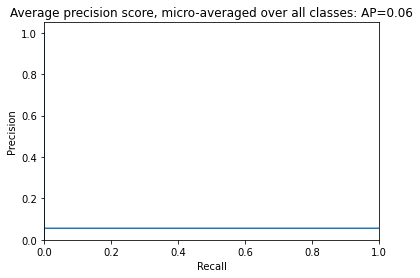

In [178]:
get_precision_score(dmi_matrix, result_matrix)

In [181]:
from sklearn.metrics import roc_curve, auc

In [182]:
def get_roc_curve(ori_matrix, pre_matrix):
        
    # For each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(M):
        fpr[i], tpr[i], _ = roc_curve(ori_matrix[:, i], pre_matrix[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # A "micro-average": quantifying score on all classes jointly
    fpr["micro"], tpr["micro"], _ = roc_curve(ori_matrix.ravel(), pre_matrix.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    print('ROC AUC: {0:0.2f}'.format(roc_auc["micro"]))
    
    plt.figure()
    lw = 2
    plt.plot(fpr["micro"], tpr["micro"], color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

ROC AUC: 0.50


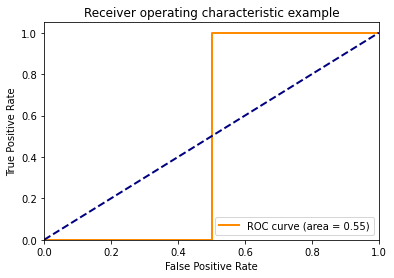

In [183]:
get_roc_curve(dmi_matrix, result_matrix)

In [87]:
str3=''
for i in range(N):
    for j in range(M):
        if dmi_matrix[i][j]==0:
            str3+=str(disease_data[j][1])+'\t'+str(miRNA_data[i][1])+'\t'+str(A_New1[i][j].real)+'\n'

In [89]:
with open('./results/MKRMDA/result_for_all.txt', 'w') as temp_opener:
    temp_opener.write(str3)

In [2]:
result_dir = '../results/MKRMDA/result_for_all.txt'

In [14]:
import re
import pandas as pd

In [35]:
result_df = pd.read_csv(result_dir, delimiter='\t', header=None)

In [70]:
def remove_extra_char(input_str):
    return_str = re.sub(r'b','', input_str)
    return_str = re.sub(r'\'','', return_str)
    return_str = re.sub(r'\n','', return_str)
    return return_str

In [81]:
column_names = []
index_names = []
data_array = np.zeros((488,383))

In [73]:
with open(result_dir) as temp_opener:
    lines = temp_opener.readlines()
    for line in lines:
        i=0
        j=0
        split_str = line.split('\t')
        column_names.append(split_str[0])
        index_names.append(split_str[1])
        data_array[i][j] = float(split_str[2])

Acquired Immunodeficiency Syndrome
hsa-mir-125a
0.006354002087056998
ACTH-Secreting Pituitary Adenoma
hsa-mir-125a
0.016535540137918234
Acute Coronary Syndrome
hsa-mir-125a
0.008125685954125876
Acute Lung Injury
hsa-mir-125a
0.008023864649100383
Adenocarcinoma
hsa-mir-125a
0.19837762766525924
Adenoma
hsa-mir-125a
-0.010522467540598674
Adenoviridae Infections
hsa-mir-125a
0.16044916990564845
Adrenal Cortex Neoplasms
hsa-mir-125a
0.011596677947778727
Adrenocortical Adenoma
hsa-mir-125a
-0.007752937045216603
Adrenocortical Carcinoma
hsa-mir-125a
0.13159317628083483
Aging
hsa-mir-125a
0.005429994916904435
AIDS Dementia Complex
hsa-mir-125a
-0.012504270477206121
Aluminuria
hsa-mir-125a
-0.013270461234182976
Alopecia
hsa-mir-125a
0.04470884205445405
Alzheimer Disease
hsa-mir-125a
0.10396303870021825
Amyloidosis
hsa-mir-125a
0.010493519436551201
Amyotrophic Lateral Sclerosis
hsa-mir-125a
0.005618627863668867
Anemia, Sickle Cell
hsa-mir-125a
-0.010912779230451117
Angina, Unstale
hsa-mir-125a
-

-0.024208220200318712
Glioma
hsa-mir-499a
0.030655638980191115
Glomerulonephritis
hsa-mir-499a
-0.01940865258020069
Glomerulonephritis, IGA
hsa-mir-499a
0.014653589326428114
Gout
hsa-mir-499a
0.07489676768985251
Graft vs Host Disease
hsa-mir-499a
0.001382466105707185
Granulosa Cell Tumor
hsa-mir-499a
0.0941990523085132
Graves Disease
hsa-mir-499a
-0.0019804225651551405
Hamartoma Syndrome, Multiple
hsa-mir-499a
-0.015563619253627575
Hand, Foot and Mouth Disease
hsa-mir-499a
-0.016057488629249096
HBV Infection
hsa-mir-499a
0.014592333169283734
HCMV Infection
hsa-mir-499a
-0.022122705116972643
HCV
hsa-mir-499a
-0.017150720557566144
Hearing Loss
hsa-mir-499a
-0.024269522357288284
Heart Defects, Congenital
hsa-mir-499a
0.06412728432306375
Heart Diseases
hsa-mir-499a
0.07115258021162163
Helplessness, Learned
hsa-mir-499a
-0.025666865645504217
Hemangioma
hsa-mir-499a
0.00931007713639112
Hemangiosarcoma
hsa-mir-499a
-0.003889484173882799
Hematologic Neoplasms
hsa-mir-499a
0.06340876268542739
H

Multiple Endocrine Neoplasia Type 1
hsa-mir-29a
-0.028562334827019576
Multiple Myeloma
hsa-mir-29a
0.17237029319285604
Muscular Disorders, Atrophic
hsa-mir-29a
0.1242412533872799
Muscular Dystrophies
hsa-mir-29a
0.015512406667372332
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-29a
0.0347919855192944
Musculoskeletal Anormalities
hsa-mir-29a
0.07179329362154493
Myasthenia Gravis
hsa-mir-29a
-0.003400035794159189
Mycosis Fungoides
hsa-mir-29a
-0.0013858215068752039
Myelodysplastic Syndromes
hsa-mir-29a
0.1263524490790906
Myeloproliferative Disorders
hsa-mir-29a
0.02205461243407813
Myocardial Ischemia
hsa-mir-29a
0.043180191035952165
Myocardial Reperfusion Injury
hsa-mir-29a
0.06656991522335075
Myocarditis
hsa-mir-29a
0.026219227766790705
Myocytes, Cardiac
hsa-mir-29a
0.06340993917495427
Myopia
hsa-mir-29a
-0.005986703704084252
Myositis Ossificans
hsa-mir-29a
-0.03267500584828889
Myotonic Dystrophy
hsa-mir-29a
0.19664330277892317
Nasal Polyps
hsa-mir-29a
-0.019151975188924378
Nasopharyn

hsa-mir-141
-0.0148154797364492
Angina, Unstale
hsa-mir-141
-0.01725283070553976
Anoxia
hsa-mir-141
-0.020740234626725154
Antiphospholipid Syndrome
hsa-mir-141
0.023130736524508207
Anus Neoplasms
hsa-mir-141
0.037045241061843204
Anxiety Disorders
hsa-mir-141
-0.0008061077701230473
Aortic Aneurysm, Adominal
hsa-mir-141
0.004880485723393037
Aortic Aneurysm, Thoracic
hsa-mir-141
0.0006953828143248623
Aortic Valve Insufficiency
hsa-mir-141
0.05063197108166187
Arrhythmias, Cardiac
hsa-mir-141
-0.024828167599412768
Arthritis
hsa-mir-141
-0.004062482097619023
Arthritis, Psoriatic
hsa-mir-141
-0.007688825097511478
Arthritis, Rheumatoid
hsa-mir-141
0.09015812386104335
Asthma
hsa-mir-141
-0.0014317104037444152
Astrocytoma
hsa-mir-141
-0.03503837016091335
Atherosclerosis
hsa-mir-141
0.0925351900589447
Atrial Firillation
hsa-mir-141
0.023214765259441456
Atrophy
hsa-mir-141
-0.015453178195744613
Autistic Disorder
hsa-mir-141
0.028067130440299994
Autoimmune Diseases
hsa-mir-141
0.02724718321931501
B

-0.039317195177888606
Hyperlipidemias
hsa-mir-145
-0.023959052507791737
Hypertrophy
hsa-mir-145
0.025519767311252245
Hypertrophy, Left Ventricular
hsa-mir-145
-0.020459044701809346
Hypopharyngeal Neoplasms
hsa-mir-145
-8.902622427384849e-05
Infertility, Male
hsa-mir-145
0.03363193603091502
Inflammation
hsa-mir-145
0.12653514232714788
Inflammatory Bowel Diseases
hsa-mir-145
0.11763623327724645
Influenza, Human
hsa-mir-145
-0.016695025118635954
Intellectual Disaility
hsa-mir-145
-0.01697721640539488
Interverteral Disk
hsa-mir-145
-0.023777240646204095
Intracranial Aneurysm
hsa-mir-145
0.05214720719691569
Irritale Bowel Syndrome
hsa-mir-145
0.047885631024584645
Ischemia
hsa-mir-145
0.023980883610293532
Ischemic Preconditioning
hsa-mir-145
-0.027566068660990137
Keloid
hsa-mir-145
0.009732137739828506
Keratoconus
hsa-mir-145
-0.03498268365922294
Kidney Diseases
hsa-mir-145
0.07325197214697655
Kidney Failure, Acute
hsa-mir-145
-0.019356167137757896
Kidney Failure, Chronic
hsa-mir-145
0.01230

hsa-mir-15a
0.21626245580731013
Vascular Calcification
hsa-mir-15a
-0.010141363256118127
Vascular Diseases
hsa-mir-15a
0.0784649904913905
Vitiligo
hsa-mir-15a
-0.01998075912616134
Waldenstrom Macrogloulinemia
hsa-mir-15a
0.17665453614361926
Wounds and Injuries
hsa-mir-15a
0.034252491601282846
Aortion, Haitual
hsa-mir-16
-0.024972198606473095
Acquired Immunodeficiency Syndrome
hsa-mir-16
0.004674939648856541
Acute Coronary Syndrome
hsa-mir-16
7.26021452193814e-05
Adenoma
hsa-mir-16
0.06867845069829256
Adenoviridae Infections
hsa-mir-16
0.08901022887289248
Adrenal Cortex Neoplasms
hsa-mir-16
0.04725418250628029
Adrenocortical Adenoma
hsa-mir-16
0.07422257559312484
Aging
hsa-mir-16
-0.020939047455685422
AIDS Dementia Complex
hsa-mir-16
0.022762701246343692
Aluminuria
hsa-mir-16
-0.030972101569284177
Alopecia
hsa-mir-16
0.008723767929032393
Alzheimer Disease
hsa-mir-16
0.122428484491321
Amyotrophic Lateral Sclerosis
hsa-mir-16
0.05605113443689172
Anemia, Sickle Cell
hsa-mir-16
0.0153474679

Multiple Myeloma
hsa-mir-1
0.12283246084556132
Multiple Sclerosis
hsa-mir-1
0.07557139982582207
Muscular Disorders, Atrophic
hsa-mir-1
0.28196879631453353
Muscular Dystrophies
hsa-mir-1
0.19289098942516372
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-1
0.14488462831034976
Myasthenia Gravis
hsa-mir-1
-0.028723987288895386
Mycosis Fungoides
hsa-mir-1
-0.0010432170355692133
Myeloproliferative Disorders
hsa-mir-1
0.04969639319667624
Myocardial Ischemia
hsa-mir-1
0.18289408445302072
Myocardial Reperfusion Injury
hsa-mir-1
0.09577387723882064
Myocarditis
hsa-mir-1
0.0678894692255605
Myocytes, Cardiac
hsa-mir-1
0.181422224725572
Myopia
hsa-mir-1
-0.010400653619929666
Myositis Ossificans
hsa-mir-1
0.017796817901309527
Nasal Polyps
hsa-mir-1
0.037926620862545474
Neoplasms
hsa-mir-1
0.3234639290915857
Neoplasms, Germ Cell and Emryonal
hsa-mir-1
0.003346733855081465
Neoplasms, Glandular and Epithelial
hsa-mir-1
-0.05030798036242203
Neoplasms, Squamous Cell
hsa-mir-1
0.07142143747872365
Nephros

hsa-mir-146a
-0.015174482310445978
Biliary Tract Neoplasms
hsa-mir-146a
0.08499306002221423
Bladder Neoplasms
hsa-mir-146a
0.1311010427800592
Brain Injuries
hsa-mir-146a
0.020438042276168918
Brain Injury
hsa-mir-146a
0.035704092247908846
Brain Ischemia
hsa-mir-146a
0.07359655296426584
Brain Neoplasms
hsa-mir-146a
0.0414278225848123
Burns
hsa-mir-146a
-0.015070396955265256
Carcinoma
hsa-mir-146a
0.2261080897350543
Carcinoma, Basal Cell
hsa-mir-146a
0.06803530300047995
Carcinoma, Ductal, Breast
hsa-mir-146a
0.08054737663823883
Carcinoma, Ehrlich Tumor
hsa-mir-146a
0.00286943352829043
Carcinoma, Emryonal
hsa-mir-146a
-0.027953946789583073
Carcinoma, Endometrioid
hsa-mir-146a
0.09158232150632492
Carcinoma, Neuroendocrine
hsa-mir-146a
0.08995731463638551
Carcinoma, Oral
hsa-mir-146a
-0.04100617775897624
Carcinoma, Small Cell
hsa-mir-146a
0.08967248880305387
Cardiomegaly
hsa-mir-146a
-0.0041508166191625215
Cardiomyopathies
hsa-mir-146a
-0.005368300153597922
Cardiomyopathy, Dilated
hsa-mir-14

hsa-mir-208
0.030193777308667666
Myopia
hsa-mir-208
0.013878550981529035
Myositis Ossificans
hsa-mir-208
-0.003898302334476864
Myotonic Dystrophy
hsa-mir-208
0.011896150826595484
Nasal Polyps
hsa-mir-208
0.021367991144809716
Nasopharyngeal Neoplasms
hsa-mir-208
-0.004871502900795019
Neoplasms
hsa-mir-208
-0.0014240740023782755
Neoplasms, Germ Cell and Emryonal
hsa-mir-208
-0.008706021001559486
Neoplasms, Glandular and Epithelial
hsa-mir-208
-0.00209003066790122
Neoplasms, Squamous Cell
hsa-mir-208
0.020323522144866338
Nephrosclerosis
hsa-mir-208
-0.02070000611719315
Nerve Sheath Neoplasms
hsa-mir-208
0.004433954494182983
Nervous System Diseases
hsa-mir-208
-0.002115808732850076
Neurilemmoma
hsa-mir-208
-0.0020693914962011247
Neurolastoma
hsa-mir-208
0.037600208980394526
Neurodegenerative Diseases
hsa-mir-208
0.0029324107983088304
Neurofiromatosis 2
hsa-mir-208
-0.002449114819147678
Neuroma, Acoustic
hsa-mir-208
-0.008059865444978765
Neutropenia
hsa-mir-208
-0.006163377780794954
Nevus, 

hsa-mir-10
-0.013724670307087586
Anus Neoplasms
hsa-mir-10
0.04669446615042208
Anxiety Disorders
hsa-mir-10
-0.018594429917654434
Aortic Aneurysm, Adominal
hsa-mir-10
-0.019965363492109492
Aortic Aneurysm, Thoracic
hsa-mir-10
0.02680498647950845
Aortic Valve Insufficiency
hsa-mir-10
0.0010632284841916723
Aortic Valve Stenosis
hsa-mir-10
-0.0026675714782202764
Arrhythmias, Cardiac
hsa-mir-10
-0.0009226606256387826
Arthritis
hsa-mir-10
-0.02222965050086376
Arthritis, Psoriatic
hsa-mir-10
-0.030277699850237587
Arthritis, Rheumatoid
hsa-mir-10
0.005338734733499814
Asthma
hsa-mir-10
-0.020449778447359304
Astrocytoma
hsa-mir-10
0.17387938443819034
Atherosclerosis
hsa-mir-10
0.02832350772406004
Atrial Firillation
hsa-mir-10
0.02451440325059083
Atrophy
hsa-mir-10
-0.005582838502311957
Autistic Disorder
hsa-mir-10
0.0376931785745478
Autoimmune Diseases
hsa-mir-10
-0.02303396778908335
Azoospermia
hsa-mir-10
0.08163246354195768
Barrett Esophagus
hsa-mir-10
0.04575613374928983
Behcet Syndrome
hsa-

HIV Infection
hsa-mir-135a
0.00035428515984965345
HIV Infections
hsa-mir-135a
0.018940779632117686
HIV-1
hsa-mir-135a
0.017500965667483066
Hodgkin Disease
hsa-mir-135a
0.06156199094559304
HPV Infection
hsa-mir-135a
-0.00047298752977678604
Huntington Disease
hsa-mir-135a
-0.015661352268515262
Hyperglycemia
hsa-mir-135a
-0.0030632042243112848
Hyperlipidemias
hsa-mir-135a
-0.003002072613237771
Hypertension
hsa-mir-135a
0.016059311701721604
Hypertrophy
hsa-mir-135a
0.010111593996281809
Hypertrophy, Left Ventricular
hsa-mir-135a
0.009124543686340776
Hypopharyngeal Neoplasms
hsa-mir-135a
-0.05512638132958865
Hypoxia-Ischemia, Brain
hsa-mir-135a
-0.004124582820666368
Infertility, Male
hsa-mir-135a
-0.007419242970360854
Inflammation
hsa-mir-135a
0.040037185146141484
Inflammatory Bowel Diseases
hsa-mir-135a
-0.015661506539605616
Influenza, Human
hsa-mir-135a
-0.029482773371843924
Intellectual Disaility
hsa-mir-135a
0.0310534341843986
Interverteral Disk
hsa-mir-135a
-0.010257657749147109
Intracr

Myopia
hsa-mir-152
-0.01814545965182026
Myositis Ossificans
hsa-mir-152
0.03006581362219412
Myotonic Dystrophy
hsa-mir-152
0.03093110177563191
Nasal Polyps
hsa-mir-152
-0.020468131135586428
Nasopharyngeal Neoplasms
hsa-mir-152
0.021884070001397953
Neoplasms
hsa-mir-152
0.030195997643018585
Neoplasms, Germ Cell and Emryonal
hsa-mir-152
0.010732807886434754
Neoplasms, Glandular and Epithelial
hsa-mir-152
0.029284564952021287
Neoplasms, Squamous Cell
hsa-mir-152
0.048318631423870426
Nephrosclerosis
hsa-mir-152
-0.003284694273383095
Nerve Sheath Neoplasms
hsa-mir-152
0.026788965572483694
Nervous System Diseases
hsa-mir-152
-0.013008350774971027
Neurilemmoma
hsa-mir-152
0.010396758071069816
Neurodegenerative Diseases
hsa-mir-152
-0.0010522035753041635
Neurofiromatosis 2
hsa-mir-152
-0.015063957644387789
Neuroma, Acoustic
hsa-mir-152
-0.019898080355016404
Neutropenia
hsa-mir-152
-0.02671159516779549
Nevus, Pigmented
hsa-mir-152
-0.019340234673853436
Oesity
hsa-mir-152
-0.0038942230881581132


0.22333272984284155
Child Development Disorders, Pervasive
hsa-mir-182
-0.015812517500369848
Chlamydia Infections
hsa-mir-182
0.009657733124630578
Cholangiocarcinoma
hsa-mir-182
0.17247509116017198
Cholesteatoma
hsa-mir-182
-0.015633316820225368
Chondrodysplasia Punctata
hsa-mir-182
-0.018939113566345624
Chordoma
hsa-mir-182
0.045686256311749975
Choriocarcinoma
hsa-mir-182
0.08951909115963369
Cicatrix
hsa-mir-182
-0.003117608504213278
Cocaine-Related Disorders
hsa-mir-182
-0.016920223274408397
Colitis
hsa-mir-182
-0.020173600324039708
Colitis, Ulcerative
hsa-mir-182
-0.008414519368281258
Colon Neoplasms
hsa-mir-182
0.020516840862955826
Colonic Neoplasms
hsa-mir-182
0.1795087278234025
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-182
0.013244178522053798
Coronary Artery Disease
hsa-mir-182
0.010332827924819042
Creutzfeldt-Jako Syndrome
hsa-mir-182
-0.012315935544934412
Crohn Disease
hsa-mir-182
0.065040502919424
Cryptosporidium
hsa-mir-182
-0.0034854508203431694
Cystic Firosis
h

0.010317750817939834
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-191
-0.001020718368864507
Leukoplakia, Oral
hsa-mir-191
-0.0095084390338002
Lichen Planus, Oral
hsa-mir-191
-0.0076139165160884524
Lipid Metaolism Disorders
hsa-mir-191
0.014951109387828166
Liposarcoma
hsa-mir-191
-0.005573711087053186
Liver Cirrhosis
hsa-mir-191
0.02303866422916781
Liver Cirrhosis, Biliary
hsa-mir-191
0.0014073051754701915
Liver Diseases
hsa-mir-191
-0.0060366831783306325
Liver Diseases, Alcoholic
hsa-mir-191
-0.010435638273275673
Liver Failure
hsa-mir-191
-0.0008115389892357286
Liver Neoplasms
hsa-mir-191
0.06666759326914934
Long QT Syndrome
hsa-mir-191
-0.027801825254257253
Lung Diseases
hsa-mir-191
-0.008585302955485048
Lung Diseases, Interstitial
hsa-mir-191
0.020227673556258343
Lupus Erythematosus, Systemic
hsa-mir-191
0.08844914841630783
Lupus Nephritis
hsa-mir-191
-0.029687116703076756
Lupus Vulgaris
hsa-mir-191
0.03048511052469744
Lymphoma
hsa-mir-191
0.08470449302585399
Lymphoma, B-Cell
hsa-mir-191


hsa-mir-193
-0.04024751396227245
Renal Insufficiency
hsa-mir-193
-0.012574845553531798
Reperfusion Injury
hsa-mir-193
0.036161709921943806
Retinal Degeneration
hsa-mir-193
0.05257086259928827
Retinal Neovascularization
hsa-mir-193
0.004904289413348625
Retinolastoma
hsa-mir-193
0.019559749215589395
Rhadomyosarcoma
hsa-mir-193
0.011077907279964988
Rhinitis, Allergic, Perennial
hsa-mir-193
0.02790799208087491
RNA Virus Infections
hsa-mir-193
-0.029308468475392483
Salivary Gland Neoplasms
hsa-mir-193
0.15041877203048157
Sarcoma
hsa-mir-193
0.009570665880971808
Sarcoma, Ewing
hsa-mir-193
0.002864113734252275
"Sarcoma, Ewings"
hsa-mir-193
-0.022359183615785407
Sarcoma, Kaposi
hsa-mir-193
-0.005929850735795092
Sarcoma, Synovial
hsa-mir-193
-0.0036250230131420463
SARS Virus
hsa-mir-193
-0.02239112817018065
Schistosomiasis
hsa-mir-193
-0.011899001492828298
Schizophrenia
hsa-mir-193
0.041639059761802426
Scleroderma, Localized
hsa-mir-193
-0.02155093756389347
Scleroderma, Systemic
hsa-mir-193
0.0

Central Nervous System Diseases
hsa-mir-200a
-0.014756734137273924
Cereellar Neoplasms
hsa-mir-200a
0.029457446347173157
Cereral Hemorrhage
hsa-mir-200a
-0.032385013504780236
Cereral Infarction
hsa-mir-200a
0.006473344317878016
Cereral Ischemia
hsa-mir-200a
-0.023522269060802924
Cervical Intraepithelial Neoplasia
hsa-mir-200a
0.030525242342447537
Cervical Neoplasms
hsa-mir-200a
0.19557280482463044
Child Development Disorders, Pervasive
hsa-mir-200a
-0.01185840635413829
Chlamydia Infections
hsa-mir-200a
0.03419664715614963
Cholangiocarcinoma
hsa-mir-200a
0.26197915871123195
Cholesteatoma
hsa-mir-200a
-0.015002836319139469
Chondrodysplasia Punctata
hsa-mir-200a
-0.02473277542215377
Chordoma
hsa-mir-200a
-0.0011138696969059114
Choriocarcinoma
hsa-mir-200a
0.06111803365341331
Cicatrix
hsa-mir-200a
-0.03294260378339739
Cocaine-Related Disorders
hsa-mir-200a
-0.014316421596857642
Colitis
hsa-mir-200a
-0.01260246021741401
Colitis, Ulcerative
hsa-mir-200a
-0.0038014185136445375
Colon Neoplasms

Liver Failure
hsa-mir-200c
-0.0005185466799280183
Liver Neoplasms
hsa-mir-200c
0.2556983194545834
Long QT Syndrome
hsa-mir-200c
-0.018652763937417154
Lung Diseases
hsa-mir-200c
-0.018806866471465743
Lung Diseases, Interstitial
hsa-mir-200c
-0.0010882183933892718
Lupus Nephritis
hsa-mir-200c
0.08665103644760105
Lymphoma, B-Cell
hsa-mir-200c
0.13089973094752494
Lymphoma, Extranodal NK-T-Cell
hsa-mir-200c
0.025526458716317483
Lymphoma, Large-Cell, Anaplastic
hsa-mir-200c
0.011280441513809292
Lymphoma, Mantle-Cell
hsa-mir-200c
0.03551718548123628
Lymphoma, Non-Hodgkin
hsa-mir-200c
0.05343325623016203
Lymphoma, Primary Effusion
hsa-mir-200c
0.07379822232569336
Lymphoma, T-Cell
hsa-mir-200c
0.04159600029804138
Lymphoproliferative Disorders
hsa-mir-200c
0.026949580172516356
Marek Disease
hsa-mir-200c
0.029229617945559505
Mastocytosis, Systemic
hsa-mir-200c
-0.007475154385726282
Medullolastoma
hsa-mir-200c
0.09122406996781876
Meningioma
hsa-mir-200c
0.033515665494858404
Mesothelioma
hsa-mir-20

0.00021660925981727142
Stomach Neoplasms 
hsa-mir-204
0.048310668689794056
Stroke
hsa-mir-204
0.031407039444728266
Supranuclear Palsy, Progressive
hsa-mir-204
0.0033406631016142203
Synapses
hsa-mir-204
0.011742753260322886
Testicular Neoplasms
hsa-mir-204
0.012293167489508372
Thyroid Neoplasms
hsa-mir-204
0.08439873419752401
Tongue Neoplasms
hsa-mir-204
-0.0018662708539422465
Tourette Syndrome
hsa-mir-204
-0.013643094841550376
Toxoplasma
hsa-mir-204
-0.008426076934658494
Toxoplasmosis
hsa-mir-204
0.019744235380704078
Tropholasts
hsa-mir-204
0.03727698279865202
Tuerculosis, Pulmonary
hsa-mir-204
-0.010797776699763322
Urinary Bladder Neoplasms
hsa-mir-204
0.3059638798636605
Uterine Cervical Neoplasms
hsa-mir-204
0.22972485628950842
Vascular Calcification
hsa-mir-204
0.007016264378545745
Vascular Diseases
hsa-mir-204
0.010977436672601856
Vitiligo
hsa-mir-204
0.014538423084321416
Waldenstrom Macrogloulinemia
hsa-mir-204
0.013611656893883356
Wounds and Injuries
hsa-mir-204
-0.00661174808613

Hepatitis B
hsa-mir-210
0.12080010241655073
Hepatitis B, Chronic
hsa-mir-210
-0.011429301578266132
Hepatitis C
hsa-mir-210
0.11249407903360421
Hepatitis C, Chronic
hsa-mir-210
-0.027749460015296573
Hepatitis, Chronic
hsa-mir-210
0.05971258433211275
Hepatolastoma
hsa-mir-210
0.07820540864507494
HEV
hsa-mir-210
-0.008963851155655636
HIV
hsa-mir-210
0.015771457263362945
HIV Infection
hsa-mir-210
-0.017607509590310235
HIV Infections
hsa-mir-210
0.015114503891184586
HIV-1
hsa-mir-210
0.009750025658101472
Hodgkin Disease
hsa-mir-210
0.0901553369237051
HPV Infection
hsa-mir-210
0.003915086599930258
Huntington Disease
hsa-mir-210
0.03865722904308754
Hyperglycemia
hsa-mir-210
-0.02303135960580001
Hyperlipidemias
hsa-mir-210
-0.019057317833349286
Hypertension
hsa-mir-210
0.1697407654991096
Hypertrophy
hsa-mir-210
0.07228140041749585
Hypertrophy, Left Ventricular
hsa-mir-210
0.04604803542167944
Hypopharyngeal Neoplasms
hsa-mir-210
-0.047135041539533226
Hypoxia-Ischemia, Brain
hsa-mir-210
0.036354

hsa-mir-221
-0.012399976254679243
Periodontal Diseases
hsa-mir-221
0.03499125989159159
Periodontitis
hsa-mir-221
0.017381690673587004
Pheochromocytoma
hsa-mir-221
0.017874030329807222
Pituitary Adenomas
hsa-mir-221
-0.044121853002338916
Pituitary Neoplasms
hsa-mir-221
0.1791456230781336
Polycystic Kidney Diseases
hsa-mir-221
-0.010025953456966365
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-221
0.19728113000493175
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-221
0.11166268117089125
Pre-Eclampsia
hsa-mir-221
0.09939162874663388
Pregnancy, Ectopic
hsa-mir-221
-0.025044444009668924
Prion Diseases
hsa-mir-221
-0.0006944880833292827
Prolactinoma
hsa-mir-221
-0.004211243402999471
Prostate Neoplasms
hsa-mir-221
0.09359468444682638
PRRSV Infection
hsa-mir-221
0.027696307391481947
Psoriasis
hsa-mir-221
0.10955260143077473
Psychotic Disorders
hsa-mir-221
-0.03227938058689584
Pulmonary Disease, Chronic Ostructive
hsa-mir-221
0.07004573961477123
Pulmonary Emolism
hsa-mir-221


Colonic Neoplasms
hsa-mir-26
0.07830662520819968
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-26
0.06151758368405482
Coronary Artery Disease
hsa-mir-26
0.02731331633033435
Creutzfeldt-Jako Syndrome
hsa-mir-26
-0.018091220072155426
Crohn Disease
hsa-mir-26
-0.01339927227298951
Cryptosporidium
hsa-mir-26
0.006281718213156019
Cystic Firosis
hsa-mir-26
0.02314308377931345
Cystitis, Interstitial
hsa-mir-26
-0.010061161373187827
Dementia
hsa-mir-26
-0.004352404166865494
Demyelinating Diseases
hsa-mir-26
0.011737429586433406
Dermatitis, Atopic
hsa-mir-26
0.016757501329671395
Diaetes Complications
hsa-mir-26
0.0007131238831188174
Diaetes Mellitus
hsa-mir-26
0.02954880591601591
Diaetes Mellitus, Type 1
hsa-mir-26
-0.016544210761377156
Diaetes Mellitus, Type 2
hsa-mir-26
0.004835383681180011
Diaetic Nephropathies
hsa-mir-26
0.019381854418422377
Diaetic Retinopathy
hsa-mir-26
-0.023779884629558243
Digestive System Neoplasms
hsa-mir-26
0.03466065789759741
Distal Myopathies
hsa-mir-26
-0.0

-0.006201028382934887
Liposarcoma
hsa-mir-34
0.017177579949354226
Liver Cirrhosis
hsa-mir-34
-0.00838361517015608
Liver Cirrhosis, Biliary
hsa-mir-34
-0.024613291300674023
Liver Diseases
hsa-mir-34
-0.014255742761428238
Liver Diseases, Alcoholic
hsa-mir-34
-0.02510794149609267
Liver Failure
hsa-mir-34
-0.04607533341182037
Liver Neoplasms
hsa-mir-34
0.13601855715263728
Long QT Syndrome
hsa-mir-34
-0.02010447215863363
Lung Diseases
hsa-mir-34
0.01129936628872268
Lung Diseases, Interstitial
hsa-mir-34
0.03903162237225728
Lupus Erythematosus, Systemic
hsa-mir-34
0.10701779596808723
Lupus Nephritis
hsa-mir-34
-0.028249244551418945
Lupus Vulgaris
hsa-mir-34
0.017401678121555395
Lymphoma
hsa-mir-34
0.14836152624625826
Lymphoma, B-Cell
hsa-mir-34
0.108096716198194
Lymphoma, Extranodal NK-T-Cell
hsa-mir-34
-0.009597983171924038
Lymphoma, Large B-Cell, Diffuse
hsa-mir-34
0.016516040251211776
Lymphoma, Large-Cell, Anaplastic
hsa-mir-34
-0.00887831476235824
Lymphoma, Mantle-Cell
hsa-mir-34
-0.0033

hsa-mir-449a
-0.057200311456722046
Sepsis
hsa-mir-449a
-0.010101955482639001
Sezary Syndrome
hsa-mir-449a
-0.016290211554857863
SIV Infection
hsa-mir-449a
-0.0029205596351122806
"Sjogrens Syndrome"
hsa-mir-449a
0.003540087480246569
Skin Neoplasms
hsa-mir-449a
-0.0373446546324045
Small Cell Lung Carcinoma
hsa-mir-449a
0.07415479762480653
Spinal Cord Injuries
hsa-mir-449a
0.013903304258154447
Stomach Diseases
hsa-mir-449a
0.005055699837474059
Stomach Neoplasms 
hsa-mir-449a
0.06498410815817413
Stroke
hsa-mir-449a
-0.019297732141510666
Supranuclear Palsy, Progressive
hsa-mir-449a
-0.007014652649143459
Synapses
hsa-mir-449a
-0.005820548874937492
Testicular Neoplasms
hsa-mir-449a
0.023281121873949456
Thyroid Neoplasms
hsa-mir-449a
0.06713476140410601
Tongue Neoplasms
hsa-mir-449a
0.015626529120662452
Tourette Syndrome
hsa-mir-449a
-0.005633394965771034
Toxoplasma
hsa-mir-449a
-0.004847580940922917
Toxoplasmosis
hsa-mir-449a
0.01938253204225338
Tropholasts
hsa-mir-449a
0.0617287976646217
Tue

Endothelium, Vascular
hsa-mir-93
0.007591907934377057
Eosinophilic Esophagitis
hsa-mir-93
0.06006220353142725
Ependymoma
hsa-mir-93
0.03691194458099509
Erythropoiesis
hsa-mir-93
0.014569264763558666
Esophageal Neoplasms
hsa-mir-93
0.15885959096160676
Esophagus
hsa-mir-93
0.012120072886433395
Eye Anormalities
hsa-mir-93
-0.007201818012736243
Fanconi Anemia
hsa-mir-93
-0.004021538065851846
Fatty Liver
hsa-mir-93
0.004371764272637552
Fatty Liver, Alcoholic
hsa-mir-93
0.0019181724867971192
Fatty Liver, Non-Alcoholic
hsa-mir-93
0.020016719288097493
Firolasts
hsa-mir-93
0.00910172558205366
Firosarcoma
hsa-mir-93
0.04947636499290553
Firosis
hsa-mir-93
-0.032744620711531246
Focal Epithelial Hyperplasia
hsa-mir-93
-0.009488657937131884
Fragile X Syndrome
hsa-mir-93
-0.002805152645810863
Francisella
hsa-mir-93
0.009101725582038103
Frontotemporal Loar Degeneration
hsa-mir-93
-0.007876670703077064
Gastric Neoplasms
hsa-mir-93
0.03570655727007112
Gastritis, Atrophic
hsa-mir-93
0.0029213481734421953

-0.007907044905065294
Lymphoma, Large B-Cell, Diffuse
hsa-mir-99
0.018981763896981273
Lymphoma, Large-Cell, Anaplastic
hsa-mir-99
-0.005216432707837797
Lymphoma, Mantle-Cell
hsa-mir-99
-0.012783238094548417
Lymphoma, Non-Hodgkin
hsa-mir-99
-0.011453393988662072
Lymphoma, Primary Effusion
hsa-mir-99
-0.010731484536480797
Lymphoma, T-Cell
hsa-mir-99
-0.01305635359784567
Lymphoproliferative Disorders
hsa-mir-99
0.024119735850332488
Marek Disease
hsa-mir-99
0.015546624938609001
Mastocytosis, Systemic
hsa-mir-99
0.022213124733734185
Medullolastoma
hsa-mir-99
0.18437508624841292
Melanoma
hsa-mir-99
0.2669208517741462
Meningioma
hsa-mir-99
0.055885352872976565
Mesothelioma
hsa-mir-99
-0.011829338070494876
Metaolic Diseases
hsa-mir-99
0.003957105937747042
Mouth Neoplasms
hsa-mir-99
0.1323772849282227
Moyamoya Disease
hsa-mir-99
0.021376203299536684
Multiple Endocrine Neoplasia Type 1
hsa-mir-99
-0.04874181778095236
Multiple Sclerosis
hsa-mir-99
-0.024407369490876442
Muscular Dystrophies
hsa-mi

Acute Coronary Syndrome
hsa-mir-1180
-1.2252574496433855e-05
Acute Lung Injury
hsa-mir-1180
0.0004978638268774106
Adenocarcinoma
hsa-mir-1180
-0.004965948665062657
Adenoma
hsa-mir-1180
0.002836806654020154
Adrenal Cortex Neoplasms
hsa-mir-1180
0.0016298320910012923
Adrenocortical Adenoma
hsa-mir-1180
0.003192540410456347
Adrenocortical Carcinoma
hsa-mir-1180
-0.0025668493937820013
Aging
hsa-mir-1180
0.009544905873975948
AIDS Dementia Complex
hsa-mir-1180
-0.0008398104231296276
Aluminuria
hsa-mir-1180
5.597136692601576e-05
Alopecia
hsa-mir-1180
0.0012478796626443564
Alzheimer Disease
hsa-mir-1180
-0.007738631401211489
Amyloidosis
hsa-mir-1180
-0.0011441884982414767
Amyotrophic Lateral Sclerosis
hsa-mir-1180
-0.0020539273844477467
Anemia, Sickle Cell
hsa-mir-1180
0.0009667861743910414
Angina, Unstale
hsa-mir-1180
0.00031744342519277133
Anoxia
hsa-mir-1180
-0.0005989176051339785
Antiphospholipid Syndrome
hsa-mir-1180
-0.000978476092233152
Anus Neoplasms
hsa-mir-1180
-0.004933682002874723


Colon Neoplasms
hsa-mir-1246
0.05941855492752687
Colonic Neoplasms
hsa-mir-1246
0.02251090883981291
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-1246
0.08478737592535626
Coronary Artery Disease
hsa-mir-1246
-0.0014864512582441246
Creutzfeldt-Jako Syndrome
hsa-mir-1246
-0.004523655556022412
Crohn Disease
hsa-mir-1246
0.005608093636360931
Cryptosporidium
hsa-mir-1246
-0.00014579018359480583
Cystic Firosis
hsa-mir-1246
0.018984262200385522
Cystitis, Interstitial
hsa-mir-1246
-0.001775528280188312
Dementia
hsa-mir-1246
-0.0028340615874026765
Demyelinating Diseases
hsa-mir-1246
0.012301788831725132
Dermatitis, Atopic
hsa-mir-1246
0.006944745498105621
Diaetes Complications
hsa-mir-1246
0.0058297438559114225
Diaetes Mellitus
hsa-mir-1246
0.0005155405022088276
Diaetes Mellitus, Type 1
hsa-mir-1246
-0.003995043021311276
Diaetes Mellitus, Type 2
hsa-mir-1246
-0.0061617885114436475
Diaetic Nephropathies
hsa-mir-1246
-0.004788892827310118
Diaetic Retinopathy
hsa-mir-1246
-0.00288806854368

hsa-mir-125
0.0012525821431087786
Keratoconus
hsa-mir-125
-0.0363773885268731
Kidney Diseases
hsa-mir-125
0.05484989505181434
Kidney Failure, Acute
hsa-mir-125
-0.03749449494542094
Kidney Failure, Chronic
hsa-mir-125
0.014695113639142547
Kidney Neoplasms
hsa-mir-125
0.08533641554132376
Leiomyoma
hsa-mir-125
0.03331555190350578
Leiomyosarcoma
hsa-mir-125
-0.011534274402669534
Leprosy
hsa-mir-125
-0.04771144669992945
Leukemia, Acute
hsa-mir-125
-0.02140713603711243
Leukemia, lympholastic, Acute
hsa-mir-125
0.27252338825390476
Leukemia, lympholastic, Chronic
hsa-mir-125
0.25599193838997153
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-125
0.1707806392335568
Leukemia, Myeloid, Chronic-Phase
hsa-mir-125
0.1238346478368742
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-125
0.33392359533215654
Leukoplakia, Oral
hsa-mir-125
0.11322484763219376
Lipid Metaolism Disorders
hsa-mir-125
-0.023802920944318955
Liposarcoma
hsa-mir-125
0.013754343206277825
Liver Cirrhosis
hsa-mir-125
0.0544178702236

hsa-mir-1302
-0.0007126922747798933
Pheochromocytoma
hsa-mir-1302
0.0002854220242797011
Pituitary Adenomas
hsa-mir-1302
-0.0008144364868973306
Pituitary Neoplasms
hsa-mir-1302
-0.002987753820371171
Polycystic Kidney Diseases
hsa-mir-1302
0.006029562731999042
Polycythemia Vera
hsa-mir-1302
-0.0016175011212458783
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-1302
-0.004516784602647079
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-1302
-0.0022297866373606296
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-1302
-0.0009414053406174836
Pre-Eclampsia
hsa-mir-1302
0.002093733842360699
Pregnancy, Ectopic
hsa-mir-1302
0.008902955077189356
Prion Diseases
hsa-mir-1302
-0.0020869238096645516
Prolactinoma
hsa-mir-1302
0.0016996848068967744
Prostate Neoplasms
hsa-mir-1302
0.01369646434749951
Prostatic Neoplasms
hsa-mir-1302
0.015491156995785902
PRRSV Infection
hsa-mir-1302
0.005680568052817895
Psoriasis
hsa-mir-1302
0.002493882245196319
Psychotic Disorders
hsa-mir-1302
-0.00

-0.023829773009060674
Cardiomyopathies
hsa-mir-148
0.017191842684451845
Cardiomyopathy, Dilated
hsa-mir-148
0.006434716140105395
Cardiomyopathy, Hypertrophic
hsa-mir-148
0.004904946645472374
Cardiovascular Diseases
hsa-mir-148
0.00487447501563755
Carotid Artery Diseases
hsa-mir-148
-0.011858239572742554
Cataract
hsa-mir-148
0.0031900437107108062
Central Nervous System Diseases
hsa-mir-148
-0.005796112250133956
Cereellar Neoplasms
hsa-mir-148
0.0018244171035573954
Cereral Hemorrhage
hsa-mir-148
0.00010223524321124194
Cereral Infarction
hsa-mir-148
-0.009777782049668494
Cereral Ischemia
hsa-mir-148
-0.014200413142736741
Cervical Intraepithelial Neoplasia
hsa-mir-148
-0.028283689886515768
Cervical Neoplasms
hsa-mir-148
-0.0019453137586233687
Child Development Disorders, Pervasive
hsa-mir-148
0.12676784985842787
Chlamydia Infections
hsa-mir-148
0.010669652008874916
Cholangiocarcinoma
hsa-mir-148
-0.03381354665896821
Cholesteatoma
hsa-mir-148
0.010758596992085648
Chondrodysplasia Punctata
h

0.042495716161306374
Leiomyosarcoma
hsa-mir-18
-0.009548751586140783
Leprosy
hsa-mir-18
-0.013922743394779391
Leukemia
hsa-mir-18
0.09975109960412272
Leukemia, Acute
hsa-mir-18
0.007164372835932117
Leukemia, B-Cell
hsa-mir-18
0.02890929865655611
Leukemia, Biphenotypic, Acute
hsa-mir-18
-0.0357024008984684
Leukemia, lympholastic, Acute
hsa-mir-18
-0.04312888873612078
Leukemia, lympholastic, Chronic
hsa-mir-18
-0.03778711361212203
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-18
0.17168990673145756
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-18
-0.040477376901371924
Leukemia, Myeloid
hsa-mir-18
-0.01072277176133412
Leukemia, Myeloid, Acute
hsa-mir-18
0.23184247389670504
Leukemia, Myeloid, Chronic-Phase
hsa-mir-18
-0.05696178009607877
Leukemia, Promyelocytic, Acute
hsa-mir-18
0.009520801489570949
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-18
0.0631819750280944
Leukoplakia, Oral
hsa-mir-18
-0.010509416936122845
Lichen Planus, Oral
hsa-mir-18
0.01767133386723578
Lipid Metaolism D

-0.007406361803353967
Osteosarcoma 
hsa-mir-1972
-0.000730419497156768
Ovarian Neoplasms
hsa-mir-1972
-0.011411526317511987
Ovary Syndrome
hsa-mir-1972
-0.001163269696590509
Pain
hsa-mir-1972
-0.002088982109457323
Pancreatic Neoplasms
hsa-mir-1972
-0.013799458351015467
Panic Disorder
hsa-mir-1972
-0.0012986737057540784
Papilary thyroid carcinoma
hsa-mir-1972
-0.001645430374183892
Parkinson Disease
hsa-mir-1972
0.012903011883260608
Patau Syndrome
hsa-mir-1972
0.0002536228268174923
Pemphigus, Benign Familial
hsa-mir-1972
-0.0001498703027780022
Periodontal Diseases
hsa-mir-1972
0.00048210023967841086
Periodontitis
hsa-mir-1972
0.0004416049001349652
Pheochromocytoma
hsa-mir-1972
-7.380719615713259e-05
Pituitary Adenomas
hsa-mir-1972
0.0002536815584892775
Pituitary Neoplasms
hsa-mir-1972
-0.0008081381414493848
Polycystic Kidney Diseases
hsa-mir-1972
-0.0010343687060701025
Polycythemia Vera
hsa-mir-1972
-0.0007537867473822943
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-1972
-0.00

Biliary Atresia
hsa-mir-27a
-0.014982371337225756
Biliary Tract Neoplasms
hsa-mir-27a
0.06413167957453828
Bladder Neoplasms
hsa-mir-27a
0.18418115636604918
Brain Injuries
hsa-mir-27a
-0.009884054053930981
Brain Injury
hsa-mir-27a
-0.01844904408265456
Brain Ischemia
hsa-mir-27a
0.014058304049832712
Brain Neoplasms
hsa-mir-27a
0.06351051239252098
Burkitt Lymphoma
hsa-mir-27a
0.056055233515177015
Burns
hsa-mir-27a
-0.007657491851334013
Carcinoma
hsa-mir-27a
0.09449925039833473
Carcinoma, Basal Cell
hsa-mir-27a
0.09947658796048156
Carcinoma, Ductal, Breast
hsa-mir-27a
0.04398501336514621
Carcinoma, Ehrlich Tumor
hsa-mir-27a
0.026069717332368778
Carcinoma, Emryonal
hsa-mir-27a
0.004830244053072488
Carcinoma, Endometrioid
hsa-mir-27a
0.1357834462639255
Carcinoma, Neuroendocrine
hsa-mir-27a
-0.01039625813620347
Carcinoma, Small Cell
hsa-mir-27a
-0.00011558326659001639
Cardiomegaly
hsa-mir-27a
0.03355683389112826
Cardiomyopathy, Dilated
hsa-mir-27a
0.04052930166440179
Cardiomyopathy, Hypertrop

-0.019753052780677516
Heart Defects, Congenital
hsa-mir-30a
0.11759696117250838
Heart Diseases
hsa-mir-30a
0.04967369091007057
Helplessness, Learned
hsa-mir-30a
-0.01906663103948486
Hemangioma
hsa-mir-30a
0.007810638223473956
Hemangiosarcoma
hsa-mir-30a
-0.032158012062347426
Hematologic Neoplasms
hsa-mir-30a
0.022050747452395075
Hepatitis
hsa-mir-30a
0.02817661332953686
Hepatitis B
hsa-mir-30a
0.11670771837881112
Hepatitis B, Chronic
hsa-mir-30a
0.02622424361712028
Hepatitis C, Chronic
hsa-mir-30a
0.09183315569053407
Hepatitis, Chronic
hsa-mir-30a
0.10152723108161452
Hepatolastoma
hsa-mir-30a
0.05938678086700361
HEV
hsa-mir-30a
-0.02984076990470938
HIV
hsa-mir-30a
-0.0051058566004297465
HIV Infection
hsa-mir-30a
-0.0010657983120032416
HIV Infections
hsa-mir-30a
0.015526431415897025
HIV-1
hsa-mir-30a
-0.00729906221549239
Hodgkin Disease
hsa-mir-30a
0.022981764041162686
HPV Infection
hsa-mir-30a
-0.010756148421745639
Huntington Disease
hsa-mir-30a
0.038422848781399156
Hyperglycemia
hsa-m

Osteoarthritis
hsa-mir-30c
-0.006244929821365475
Osteolysis
hsa-mir-30c
-0.006290078543635065
Osteoporosis
hsa-mir-30c
-0.004942569522231547
Osteosarcoma
hsa-mir-30c
0.15361911154619065
Osteosarcoma 
hsa-mir-30c
-0.038272921861907706
Ovary Syndrome
hsa-mir-30c
-0.002280304718502074
Pain
hsa-mir-30c
-0.01454221595992362
Panic Disorder
hsa-mir-30c
-0.008839583080515065
Papilary thyroid carcinoma
hsa-mir-30c
-0.017942762090417917
Patau Syndrome
hsa-mir-30c
-0.0038380080385510273
Pemphigus, Benign Familial
hsa-mir-30c
-0.011396111718810324
Periodontal Diseases
hsa-mir-30c
0.020621547520074463
Periodontitis
hsa-mir-30c
0.045387199955188064
Pheochromocytoma
hsa-mir-30c
-0.030410678230187338
Pituitary Adenomas
hsa-mir-30c
-0.008547889212811553
Pituitary Neoplasms
hsa-mir-30c
0.04359108686745683
Polycystic Kidney Diseases
hsa-mir-30c
-0.0024704623999679386
Polycythemia Vera
hsa-mir-30c
-0.03321713754462714
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-30c
-0.013304935907396329
Precur

Aortion, Haitual
hsa-mir-338
-0.0028765260211891346
Acquired Immunodeficiency Syndrome
hsa-mir-338
0.0047150987199456665
ACTH-Secreting Pituitary Adenoma
hsa-mir-338
0.003059646352513562
Acute Coronary Syndrome
hsa-mir-338
0.013154976861871892
Acute Lung Injury
hsa-mir-338
-0.000402037565181923
Adenocarcinoma
hsa-mir-338
0.03054137124524972
Adenoma
hsa-mir-338
-0.0012567570238050593
Adrenal Cortex Neoplasms
hsa-mir-338
0.02950740283746066
Adrenocortical Adenoma
hsa-mir-338
-0.009453935624015013
Adrenocortical Carcinoma
hsa-mir-338
0.03601323198582486
Aging
hsa-mir-338
-0.0022300876982487006
AIDS Dementia Complex
hsa-mir-338
-0.000708664547950242
Aluminuria
hsa-mir-338
-0.018834431627852293
Alopecia
hsa-mir-338
0.0008047310810309904
Alzheimer Disease
hsa-mir-338
0.07497284562613471
Amyloidosis
hsa-mir-338
-0.013981851448868517
Amyotrophic Lateral Sclerosis
hsa-mir-338
0.0018442969246408422
Anemia, Sickle Cell
hsa-mir-338
-0.016196552956456046
Angina, Unstale
hsa-mir-338
-0.0088395960329

Crohn Disease
hsa-mir-342
0.031806302918715466
Cryptosporidium
hsa-mir-342
0.003840831475229952
Cystic Firosis
hsa-mir-342
-0.016648106138336876
Cystitis, Interstitial
hsa-mir-342
0.023447503940482527
Dementia
hsa-mir-342
-0.005466886634729537
Demyelinating Diseases
hsa-mir-342
0.01902817801468064
Dermatitis, Atopic
hsa-mir-342
-0.023887726150771782
Diaetes Complications
hsa-mir-342
-0.02551599271212849
Diaetes Mellitus
hsa-mir-342
-0.002478902703558182
Diaetes Mellitus, Type 1
hsa-mir-342
-0.01827205133117404
Diaetes Mellitus, Type 2
hsa-mir-342
0.051941972416749485
Diaetic Nephropathies
hsa-mir-342
-0.004892129551475714
Diaetic Retinopathy
hsa-mir-342
-0.0010683318154286105
Digestive System Neoplasms
hsa-mir-342
-0.028288737164135
Distal Myopathies
hsa-mir-342
-0.018216850321225882
Down Syndrome
hsa-mir-342
-0.006061745601392984
Drug-Induced Liver Injury
hsa-mir-342
0.01688217973539661
Dyslipidemias
hsa-mir-342
-0.004801072052787535
Dyspepsia
hsa-mir-342
-0.006071755503808257
Eclamps

hsa-mir-34a
-0.024727292838689033
Leukemia, Acute
hsa-mir-34a
-0.006364086970082165
Leukemia, B-Cell
hsa-mir-34a
0.21261807986838543
Leukemia, Biphenotypic, Acute
hsa-mir-34a
0.09130437029244051
Leukemia, lympholastic, Acute
hsa-mir-34a
0.1571697447045684
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-34a
0.09292645128012711
Leukemia, Myeloid
hsa-mir-34a
0.20432633181294488
Leukemia, Myeloid, Chronic-Phase
hsa-mir-34a
0.0792451585832123
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-34a
0.1404308003814388
Leukoplakia, Oral
hsa-mir-34a
0.0022290940871818876
Lichen Planus, Oral
hsa-mir-34a
0.019200554445957075
Lipid Metaolism Disorders
hsa-mir-34a
0.04951417758354868
Liposarcoma
hsa-mir-34a
0.09240616118567063
Liver Cirrhosis
hsa-mir-34a
0.11231174765925225
Liver Cirrhosis, Biliary
hsa-mir-34a
-0.026325679621669484
Liver Diseases
hsa-mir-34a
0.016256112642963845
Liver Diseases, Alcoholic
hsa-mir-34a
0.07991219407189844
Liver Failure
hsa-mir-34a
0.023656005552285947
Liver Neoplasms
hsa

Pituitary Adenomas
hsa-mir-374
0.0053553292857330854
Pituitary Neoplasms
hsa-mir-374
-0.00910923155322853
Polycystic Kidney Diseases
hsa-mir-374
0.006830890185314714
Polycythemia Vera
hsa-mir-374
0.001175628727819367
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-374
-0.005041174619608776
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-374
0.002190699994663507
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-374
-0.005216388417875011
Pre-Eclampsia
hsa-mir-374
0.005877600275004825
Pregnancy, Ectopic
hsa-mir-374
0.006664953166348747
Prion Diseases
hsa-mir-374
0.02582071420167774
Prolactinoma
hsa-mir-374
0.006547937182484901
Prostate Neoplasms
hsa-mir-374
0.00880154136056069
Prostatic Neoplasms
hsa-mir-374
0.026382031186440967
PRRSV Infection
hsa-mir-374
0.00501024566560157
Psoriasis
hsa-mir-374
-0.006964186466231407
Psychotic Disorders
hsa-mir-374
-0.004698236330453073
Pulmonary Disease, Chronic Ostructive
hsa-mir-374
0.0126280809429637
Pulmonary Emolism
hsa-mir-374

0.013007732266198349
Arthritis, Rheumatoid
hsa-mir-433
-0.001288679865793078
Asthma
hsa-mir-433
0.00861509032295133
Astrocytoma
hsa-mir-433
-0.0044142004645271425
Atherosclerosis
hsa-mir-433
0.06646658768603222
Atrial Firillation
hsa-mir-433
0.09383251108718424
Atrophy
hsa-mir-433
0.01880300512223722
Autistic Disorder
hsa-mir-433
-0.012775830282197162
Autoimmune Diseases
hsa-mir-433
-0.005719385321742713
Azoospermia
hsa-mir-433
-0.0012358665897419675
Barrett Esophagus
hsa-mir-433
-0.018016454301612854
Behcet Syndrome
hsa-mir-433
0.0042499057008483325
Biliary Atresia
hsa-mir-433
-0.0008649568960724593
Biliary Tract Neoplasms
hsa-mir-433
-0.005506281485839211
Bladder Neoplasms
hsa-mir-433
0.00665678180666095
Brain Injuries
hsa-mir-433
0.007852940372073505
Brain Injury
hsa-mir-433
0.013139773887213038
Brain Ischemia
hsa-mir-433
0.005730878988723181
Brain Neoplasms
hsa-mir-433
0.0006694922603860849
Breast Neoplasms
hsa-mir-433
0.12552027443149943
Burkitt Lymphoma
hsa-mir-433
0.012970942972

-0.009369005542523855
Endometrial Neoplasms
hsa-mir-454
0.008871368962385417
Endometriosis
hsa-mir-454
0.03212724020374007
Endomyocardial Firosis
hsa-mir-454
0.00534040910285582
Endothelium, Vascular
hsa-mir-454
0.004775081720113594
Eosinophilic Esophagitis
hsa-mir-454
0.0396518953971498
Ependymoma
hsa-mir-454
-0.02633629206569766
Erythropoiesis
hsa-mir-454
0.010410440911167844
Esophagus
hsa-mir-454
0.0015982254145116698
Eye Anormalities
hsa-mir-454
0.003971685022157792
Fanconi Anemia
hsa-mir-454
0.012404067608038978
Fatty Liver
hsa-mir-454
-0.014625431874067452
Fatty Liver, Alcoholic
hsa-mir-454
0.00486526905409862
Fatty Liver, Non-Alcoholic
hsa-mir-454
0.013554918204443654
Firolasts
hsa-mir-454
0.0046235515762704585
Firosarcoma
hsa-mir-454
-0.0043182066462182575
Firosis
hsa-mir-454
-0.0018340102746328213
Focal Epithelial Hyperplasia
hsa-mir-454
0.0010641326336390394
Fragile X Syndrome
hsa-mir-454
0.005833577212547831
Francisella
hsa-mir-454
0.004623551576269397
Frontotemporal Loar De

hsa-mir-519a
-0.005197525424900585
Ischemia
hsa-mir-519a
-0.005925643984984692
Ischemic Preconditioning
hsa-mir-519a
-0.0036897458755842036
Keloid
hsa-mir-519a
0.009693456319039305
Keratoconus
hsa-mir-519a
0.004808983850112029
Kidney Diseases
hsa-mir-519a
0.0015846684273548121
Kidney Failure, Acute
hsa-mir-519a
0.0001374043010816282
Kidney Failure, Chronic
hsa-mir-519a
-0.00026934486261099774
Kidney Neoplasms
hsa-mir-519a
-0.01393067321302055
Laryngeal Neoplasms
hsa-mir-519a
-0.0060845324906662595
Leiomyoma
hsa-mir-519a
0.009257749709885896
Leiomyosarcoma
hsa-mir-519a
-0.007619926673635702
Leprosy
hsa-mir-519a
-0.00597757043044444
Leukemia
hsa-mir-519a
0.010870567284768566
Leukemia, Acute
hsa-mir-519a
-0.004137341920189937
Leukemia, B-Cell
hsa-mir-519a
-0.005092909602769411
Leukemia, Biphenotypic, Acute
hsa-mir-519a
-0.0003145410694989229
Leukemia, lympholastic, Acute
hsa-mir-519a
-0.0011928551853306194
Leukemia, lympholastic, Chronic
hsa-mir-519a
-0.0013022582020794345
Leukemia, Lymph

hsa-mir-582
-0.0017744200861667559
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-582
-0.002321545713412267
Musculoskeletal Anormalities
hsa-mir-582
0.0003168731987057237
Myasthenia Gravis
hsa-mir-582
-0.0027060633182263163
Mycosis Fungoides
hsa-mir-582
-0.0026551827108733453
Myelodysplastic Syndromes
hsa-mir-582
0.0017141065900589895
Myeloproliferative Disorders
hsa-mir-582
0.006557688796833322
Myocardial Infarction
hsa-mir-582
-0.01027457971161973
Myocardial Ischemia
hsa-mir-582
0.008733675355637143
Myocardial Reperfusion Injury
hsa-mir-582
-0.00020347606947997143
Myocarditis
hsa-mir-582
-0.000882816518155738
Myocardium
hsa-mir-582
0.001447165650911516
Myocytes, Cardiac
hsa-mir-582
0.0030782834307678665
Myopia
hsa-mir-582
-0.0018209099852196015
Myositis Ossificans
hsa-mir-582
0.00021693983661981529
Myotonic Dystrophy
hsa-mir-582
0.006436158188039053
Nasal Polyps
hsa-mir-582
0.00033609349779738354
Nasopharyngeal Neoplasms
hsa-mir-582
-0.006274737599307253
Neoplasms
hsa-mir-582
-0.015

hsa-mir-619
0.01313416060670109
Meningioma
hsa-mir-619
-0.00015593669278564197
Mesothelioma
hsa-mir-619
-0.003041447586499251
Metaolic Diseases
hsa-mir-619
-0.00020211038991816734
Mouth Neoplasms
hsa-mir-619
-0.003788485815745743
Moyamoya Disease
hsa-mir-619
-0.000971529737194915
Multiple Endocrine Neoplasia Type 1
hsa-mir-619
0.0007834355114396318
Multiple Myeloma
hsa-mir-619
-0.002195098814517611
Multiple Sclerosis
hsa-mir-619
0.009594997246158348
Muscular Disorders, Atrophic
hsa-mir-619
-0.005804095529352656
Muscular Dystrophies
hsa-mir-619
0.0005443312043801468
Muscular Dystrophy, Duchenne
hsa-mir-619
-0.0017744200861320697
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-619
-0.002321545713426662
Musculoskeletal Anormalities
hsa-mir-619
0.0003168731987089148
Myasthenia Gravis
hsa-mir-619
-0.0027060633182265483
Mycosis Fungoides
hsa-mir-619
-0.002655182710912002
Myelodysplastic Syndromes
hsa-mir-619
0.001714106590064171
Myeloproliferative Disorders
hsa-mir-619
0.006557688796836613
M

Prostatic Neoplasms
hsa-mir-635
-0.003634210094054775
PRRSV Infection
hsa-mir-635
-0.00186327208783541
Psoriasis
hsa-mir-635
-0.0013751642716509907
Psychotic Disorders
hsa-mir-635
-0.0008316914773097671
Pulmonary Disease, Chronic Ostructive
hsa-mir-635
-0.0020819646639475553
Pulmonary Emolism
hsa-mir-635
-0.000997982632909204
Pulmonary Firosis
hsa-mir-635
0.000600505075536906
Radiation Injuries
hsa-mir-635
-0.00011353021815340043
Rectal Neoplasms
hsa-mir-635
0.014816933483812224
Renal Insufficiency
hsa-mir-635
-0.00010228081193766283
Reperfusion Injury
hsa-mir-635
-0.004031239657823315
Retinal Degeneration
hsa-mir-635
-0.0017832494990895863
Retinal Neovascularization
hsa-mir-635
-0.0016419969322960465
Retinolastoma
hsa-mir-635
-0.0040266607475330386
Rhadomyosarcoma
hsa-mir-635
-0.0028643403612618524
Rhinitis, Allergic, Perennial
hsa-mir-635
-0.0014758033079815764
RNA Virus Infections
hsa-mir-635
0.03268319020935011
Salivary Gland Neoplasms
hsa-mir-635
-0.0016357302221846363
Sarcoma
hsa

Anxiety Disorders
hsa-mir-7
0.02668744088389123
Aortic Aneurysm, Adominal
hsa-mir-7
-0.03500312297064617
Aortic Aneurysm, Thoracic
hsa-mir-7
0.08822938575951121
Aortic Valve Insufficiency
hsa-mir-7
-0.01937225960759269
Aortic Valve Stenosis
hsa-mir-7
-0.02406147988415168
Arrhythmias, Cardiac
hsa-mir-7
-0.029557991756324006
Arthritis
hsa-mir-7
-0.005444895943003205
Arthritis, Psoriatic
hsa-mir-7
-0.008116064537516059
Arthritis, Rheumatoid
hsa-mir-7
0.0466233571214801
Asthma
hsa-mir-7
0.16369628426107952
Astrocytoma
hsa-mir-7
0.12164534192667703
Atherosclerosis
hsa-mir-7
0.019916836817233143
Atrial Firillation
hsa-mir-7
0.04248868042794614
Atrophy
hsa-mir-7
-0.023399603747657923
Autoimmune Diseases
hsa-mir-7
-0.011997444350832127
Barrett Esophagus
hsa-mir-7
0.09727039434512964
Behcet Syndrome
hsa-mir-7
-0.009434753852574449
Biliary Atresia
hsa-mir-7
0.006662293911906952
Biliary Tract Neoplasms
hsa-mir-7
0.06819007123602613
Bladder Neoplasms
hsa-mir-7
0.14141339058655858
Brain Injuries
hs

hsa-mir-942
0.0005148781912339608
Frontotemporal Loar Degeneration
hsa-mir-942
0.004715246861289383
Gastric Neoplasms
hsa-mir-942
0.0021923760020209977
Gastritis, Atrophic
hsa-mir-942
-0.0011241690329870796
Gastrointestinal Neoplasms
hsa-mir-942
0.028029358178318635
Gerstmann-Straussler-Scheinker Disease
hsa-mir-942
-0.0013006674530235732
Giant Cell Tumors
hsa-mir-942
0.0003342253417715018
Gliolastoma
hsa-mir-942
0.00407467416478385
Gliolastoma 
hsa-mir-942
-0.0058345739028665055
Glioma
hsa-mir-942
-0.010183892114829592
Glomerulonephritis
hsa-mir-942
0.002823762289179085
Glomerulonephritis, IGA
hsa-mir-942
-0.0002940239875819273
Gout
hsa-mir-942
0.007176041723241999
Graft vs Host Disease
hsa-mir-942
-9.258880132602572e-05
Granulosa Cell Tumor
hsa-mir-942
0.0023568396963739376
Graves Disease
hsa-mir-942
0.0039566121954586544
Hamartoma Syndrome, Multiple
hsa-mir-942
0.0022219855293454625
Hand, Foot and Mouth Disease
hsa-mir-942
0.019243701847165822
HBV Infection
hsa-mir-942
-0.0048374911

Lymphoma, Mantle-Cell
hsa-mir-214
0.045994824381908314
Lymphoma, Non-Hodgkin
hsa-mir-214
0.063840308371529
Lymphoma, Primary Effusion
hsa-mir-214
0.0706253511184045
Lymphoma, T-Cell
hsa-mir-214
0.049793020462308456
Lymphoproliferative Disorders
hsa-mir-214
-0.01582762547552412
Marek Disease
hsa-mir-214
0.06356708483305747
Mastocytosis, Systemic
hsa-mir-214
-0.01897335622769878
Medullolastoma
hsa-mir-214
0.21609593058401155
Meningioma
hsa-mir-214
0.02627969513935563
Metaolic Diseases
hsa-mir-214
-0.0009587691925687855
Mouth Neoplasms
hsa-mir-214
0.03558314350589989
Moyamoya Disease
hsa-mir-214
0.0011436050504387563
Multiple Endocrine Neoplasia Type 1
hsa-mir-214
0.02346811970822371
Multiple Myeloma
hsa-mir-214
0.08177731375784203
Multiple Sclerosis
hsa-mir-214
0.060583650112675
Muscular Dystrophies
hsa-mir-214
0.0538176117663995
Muscular Dystrophy, Duchenne
hsa-mir-214
0.1281004229079754
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-214
0.040792007764571606
Musculoskeletal Anormalitie

hsa-mir-503
0.03197079483661013
Retinal Degeneration
hsa-mir-503
0.001006158972640954
Retinal Neovascularization
hsa-mir-503
0.008581421479177927
Retinolastoma
hsa-mir-503
0.009080904847982782
Rhadomyosarcoma
hsa-mir-503
0.007868621141745306
Rhinitis, Allergic, Perennial
hsa-mir-503
-0.0016459553134605424
RNA Virus Infections
hsa-mir-503
-0.006883714333499354
Salivary Gland Neoplasms
hsa-mir-503
0.009216986814571969
Sarcoma
hsa-mir-503
-0.013096675509262454
Sarcoma, Ewing
hsa-mir-503
0.020177910254931274
"Sarcoma, Ewings"
hsa-mir-503
0.0028672584034525068
Sarcoma, Kaposi
hsa-mir-503
-0.008671446249029255
Sarcoma, Synovial
hsa-mir-503
0.015711021070576127
SARS Virus
hsa-mir-503
0.008377595146987285
Schistosomiasis
hsa-mir-503
-0.0006125480667718564
Schizophrenia
hsa-mir-503
0.0007325382486274989
Scleroderma, Localized
hsa-mir-503
0.0634832024118399
Sepsis
hsa-mir-503
-0.005420313536049779
Sezary Syndrome
hsa-mir-503
0.004464004151594508
SIV Infection
hsa-mir-503
0.00041518614092396836
"

Cholesteatoma
hsa-mir-382
-0.006083588962088171
Chondrodysplasia Punctata
hsa-mir-382
0.006720321569263221
Chordoma
hsa-mir-382
-0.007716117883449423
Choriocarcinoma
hsa-mir-382
-0.01704192756186227
Cicatrix
hsa-mir-382
0.01484127618835367
Cocaine-Related Disorders
hsa-mir-382
0.025701093939948273
Colitis
hsa-mir-382
-0.004847017503571324
Colitis, Ulcerative
hsa-mir-382
-0.0031655708596914
Colon Neoplasms
hsa-mir-382
-0.03967773572950632
Colonic Neoplasms
hsa-mir-382
-0.006526731325841757
Colorectal Neoplasms
hsa-mir-382
0.0841558871755505
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-382
-0.028058943538658173
Coronary Artery Disease
hsa-mir-382
0.09333754104129816
Creutzfeldt-Jako Syndrome
hsa-mir-382
0.005025692931086904
Crohn Disease
hsa-mir-382
-0.0013211675688493164
Cryptosporidium
hsa-mir-382
0.003118344800718391
Cystic Firosis
hsa-mir-382
-0.012860969812220471
Cystitis, Interstitial
hsa-mir-382
-0.014659277377767083
Dementia
hsa-mir-382
-0.0014467619229144866
Demyelinati

0.001828197307100739
Hyperglycemia
hsa-let-7
-0.003433977568226769
Hyperlipidemias
hsa-let-7
-0.011169392414880094
Hypertension
hsa-let-7
0.12357971999991903
Hypertrophy, Left Ventricular
hsa-let-7
0.02826163749225317
Hypopharyngeal Neoplasms
hsa-let-7
0.10487171484953198
Hypoxia-Ischemia, Brain
hsa-let-7
-0.02874330147803667
Infertility, Male
hsa-let-7
0.009262523999375105
Inflammatory Bowel Diseases
hsa-let-7
-0.02317609620424217
Influenza, Human
hsa-let-7
0.09189671241324454
Intellectual Disaility
hsa-let-7
0.011757097293451233
Interverteral Disk
hsa-let-7
-0.0007721902089495164
Intracranial Aneurysm
hsa-let-7
-0.03225768373726044
Irritale Bowel Syndrome
hsa-let-7
-0.008618533793519676
Ischemia
hsa-let-7
0.049634199336768374
Ischemic Preconditioning
hsa-let-7
-0.011304416714391714
Keloid
hsa-let-7
-0.0070173858508760165
Keratoconus
hsa-let-7
0.013250960435604326
Kidney Diseases
hsa-let-7
0.04039943052169909
Kidney Failure, Acute
hsa-let-7
-0.00968975381370301
Kidney Failure, Chronic

hsa-let-7d
0.0041007543422290765
"Sjogrens Syndrome"
hsa-let-7d
-0.014167635030190414
Skin Neoplasms
hsa-let-7d
0.03402024830838285
Small Cell Lung Carcinoma
hsa-let-7d
0.08379361410182118
Spinal Cord Injuries
hsa-let-7d
0.0688687369854993
Stomach Diseases
hsa-let-7d
-0.04323515406627144
Stomach Neoplasms
hsa-let-7d
0.4152901497065363
Stomach Neoplasms 
hsa-let-7d
-0.104971724429961
Stroke
hsa-let-7d
0.09229825566600562
Supranuclear Palsy, Progressive
hsa-let-7d
0.0011938543610366965
Synapses
hsa-let-7d
-0.0008602611351330725
Testicular Neoplasms
hsa-let-7d
0.022599061772199003
Thyroid Neoplasms
hsa-let-7d
0.16324839315183187
Tongue Neoplasms
hsa-let-7d
-0.010217745189489494
Tourette Syndrome
hsa-let-7d
-0.01159184804982151
Toxoplasma
hsa-let-7d
-0.005370066907253446
Toxoplasmosis
hsa-let-7d
0.004550219993658788
Tropholasts
hsa-let-7d
0.014016334015210949
Tuerculosis, Pulmonary
hsa-let-7d
0.009977473403157258
Urinary Bladder Neoplasms
hsa-let-7d
0.2697494705936385
Uterine Cervical Neop

hsa-mir-137
0.04313223537250069
Demyelinating Diseases
hsa-mir-137
0.029721768891185944
Dermatitis, Atopic
hsa-mir-137
0.012212018500134932
Diaetes Complications
hsa-mir-137
-0.02146448306353715
Diaetes Mellitus
hsa-mir-137
0.003622856637440681
Diaetes Mellitus, Type 1
hsa-mir-137
-0.010345186965222884
Diaetes Mellitus, Type 2
hsa-mir-137
0.01530391854325456
Diaetic Nephropathies
hsa-mir-137
0.00370824103732519
Diaetic Retinopathy
hsa-mir-137
-0.023959175133440123
Digestive System Neoplasms
hsa-mir-137
0.004965167765589085
Distal Myopathies
hsa-mir-137
-0.01490330268754069
Down Syndrome
hsa-mir-137
0.055839750866786275
Drug-Induced Liver Injury
hsa-mir-137
0.004908873077504962
Dyslipidemias
hsa-mir-137
0.0007424029035980092
Dyspepsia
hsa-mir-137
0.017872851052912062
Eclampsia
hsa-mir-137
0.004803851509235306
Eczema
hsa-mir-137
-0.005104395776462836
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-137
-0.009274077463174641
Endometrial Neoplasms
hsa-mir-137
0.07126930189973682
Endomet

hsa-mir-15
0.03108730029930514
Liver Cirrhosis
hsa-mir-15
0.12135822215639781
Liver Cirrhosis, Biliary
hsa-mir-15
0.035205434445042844
Liver Diseases
hsa-mir-15
0.13174832554017019
Liver Diseases, Alcoholic
hsa-mir-15
0.07775573389960092
Liver Neoplasms
hsa-mir-15
0.11025984580265158
Long QT Syndrome
hsa-mir-15
0.021024212048604468
Lung Diseases
hsa-mir-15
-0.008870427764312943
Lung Diseases, Interstitial
hsa-mir-15
-0.011477801957809695
Lung Neoplasms
hsa-mir-15
0.28944308894752685
Lupus Erythematosus, Systemic
hsa-mir-15
0.04566186796982561
Lupus Nephritis
hsa-mir-15
-0.0038888429351802353
Lupus Vulgaris
hsa-mir-15
-0.00935841454456042
Lymphoma
hsa-mir-15
0.11741688092888705
Lymphoma, B-Cell
hsa-mir-15
0.11416817790385503
Lymphoma, Extranodal NK-T-Cell
hsa-mir-15
-0.036041323427582456
Lymphoma, Large B-Cell, Diffuse
hsa-mir-15
-0.020076421009633333
Lymphoma, Large-Cell, Anaplastic
hsa-mir-15
-0.04632589980610714
Lymphoma, Mantle-Cell
hsa-mir-15
0.0038494878005692085
Lymphoma, Non-Hod

-0.004341863015316735
Supranuclear Palsy, Progressive
hsa-mir-23
0.03615996588706475
Synapses
hsa-mir-23
0.002538549354406266
Testicular Neoplasms
hsa-mir-23
0.044713913394813995
Thyroid Neoplasms
hsa-mir-23
0.03925949806397862
Tongue Neoplasms
hsa-mir-23
0.05787086227243908
Tourette Syndrome
hsa-mir-23
-0.0008537233264743725
Toxoplasma
hsa-mir-23
0.0032593179655290017
Toxoplasmosis
hsa-mir-23
0.03803653544837925
Tropholasts
hsa-mir-23
0.02779272501769841
Tuerculosis, Pulmonary
hsa-mir-23
0.039382383615988614
Urinary Bladder Neoplasms
hsa-mir-23
0.28259916489443515
Vascular Calcification
hsa-mir-23
-0.005271402756563556
Vascular Diseases
hsa-mir-23
0.034122719332417506
Vitiligo
hsa-mir-23
-0.005338053341366747
Waldenstrom Macrogloulinemia
hsa-mir-23
-0.013224325960140629
Wounds and Injuries
hsa-mir-23
-0.024980580860778888
Aortion, Haitual
hsa-mir-28
0.023634035355807298
Acquired Immunodeficiency Syndrome
hsa-mir-28
0.05949260652021159
ACTH-Secreting Pituitary Adenoma
hsa-mir-28
-0.001

Chlamydia Infections
hsa-mir-301
-0.0067550905451490345
Cholangiocarcinoma
hsa-mir-301
-0.03335238551534146
Cholesteatoma
hsa-mir-301
0.01921834185906589
Chondrodysplasia Punctata
hsa-mir-301
-0.003725235599381347
Chordoma
hsa-mir-301
-0.005443740749286351
Choriocarcinoma
hsa-mir-301
-0.030003012275892138
Cicatrix
hsa-mir-301
-0.00112652145032832
Cocaine-Related Disorders
hsa-mir-301
0.0018366906229270487
Colitis
hsa-mir-301
-0.009650590201537535
Colitis, Ulcerative
hsa-mir-301
-0.00853221467228614
Colon Neoplasms
hsa-mir-301
-0.0507051891402578
Colonic Neoplasms
hsa-mir-301
0.060610513245831305
Colorectal Neoplasms
hsa-mir-301
0.14061127712929067
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-301
-0.03360155772148045
Coronary Artery Disease
hsa-mir-301
-0.0011516093581990655
Creutzfeldt-Jako Syndrome
hsa-mir-301
-0.006117119009503295
Crohn Disease
hsa-mir-301
-0.028007147463723268
Cryptosporidium
hsa-mir-301
0.036437325733027354
Cystic Firosis
hsa-mir-301
-0.015296927909774322


-0.0018814064811857566
Irritale Bowel Syndrome
hsa-mir-375
0.001904360866809937
Ischemia
hsa-mir-375
-0.008072908579044316
Ischemic Preconditioning
hsa-mir-375
-0.03181462777377779
Keloid
hsa-mir-375
-0.008960306217098686
Keratoconus
hsa-mir-375
-0.030017615305354246
Kidney Diseases
hsa-mir-375
0.0008500951256359864
Kidney Failure, Acute
hsa-mir-375
-0.027103169254353847
Kidney Failure, Chronic
hsa-mir-375
-0.006007420835002969
Kidney Neoplasms
hsa-mir-375
0.0849762104664006
Leiomyoma
hsa-mir-375
0.04655778981978657
Leiomyosarcoma
hsa-mir-375
-0.0023985895288989563
Leprosy
hsa-mir-375
-0.03937624603049087
Leukemia
hsa-mir-375
0.011901369574566625
Leukemia, Acute
hsa-mir-375
-0.029069074316821215
Leukemia, B-Cell
hsa-mir-375
-0.01970843762561299
Leukemia, Biphenotypic, Acute
hsa-mir-375
-0.014369057618867729
Leukemia, lympholastic, Acute
hsa-mir-375
-0.02109650029027435
Leukemia, lympholastic, Chronic
hsa-mir-375
-0.04340991922682975
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-375
0.

hsa-mir-376
0.02362089268445955
Neurodegenerative Diseases
hsa-mir-376
0.00678528391641982
Neurofiromatosis 2
hsa-mir-376
0.009199765910285235
Neuroma, Acoustic
hsa-mir-376
-0.0010895997367566302
Neutropenia
hsa-mir-376
0.0077654167789335884
Nevus, Pigmented
hsa-mir-376
0.004052617742149255
Oesity
hsa-mir-376
-0.010059206968952255
Odontogenic Tumors
hsa-mir-376
0.002205945738362896
Oligodendroglioma
hsa-mir-376
0.005594328761520169
Osteoarthritis
hsa-mir-376
-0.015480809645249345
Osteolysis
hsa-mir-376
0.012300015433435108
Osteoporosis
hsa-mir-376
0.010219908151503983
Osteosarcoma
hsa-mir-376
-0.03169566535409313
Osteosarcoma 
hsa-mir-376
-0.0033180687598011946
Ovarian Neoplasms
hsa-mir-376
0.06972592517336351
Ovary Syndrome
hsa-mir-376
0.011531011979757698
Pain
hsa-mir-376
-0.012105059347644363
Pancreatic Neoplasms
hsa-mir-376
0.0345409975724126
Panic Disorder
hsa-mir-376
0.01904749590428354
Papilary thyroid carcinoma
hsa-mir-376
0.013882664136173943
Parkinson Disease
hsa-mir-376
0.06

Alopecia
hsa-mir-491
-0.011352378982470733
Alzheimer Disease
hsa-mir-491
0.016117958439212453
Amyloidosis
hsa-mir-491
0.008732377580908345
Amyotrophic Lateral Sclerosis
hsa-mir-491
-0.00020595638944970705
Anemia, Sickle Cell
hsa-mir-491
-0.001874197745229303
Angina, Unstale
hsa-mir-491
-7.454951550189912e-05
Anoxia
hsa-mir-491
-0.0002159583629375017
Antiphospholipid Syndrome
hsa-mir-491
0.025110069196741386
Anus Neoplasms
hsa-mir-491
0.012668982016105473
Anxiety Disorders
hsa-mir-491
0.0018590691020540081
Aortic Aneurysm, Adominal
hsa-mir-491
-0.002835985733030781
Aortic Aneurysm, Thoracic
hsa-mir-491
0.017133539420410474
Aortic Valve Insufficiency
hsa-mir-491
-0.01758520935743465
Aortic Valve Stenosis
hsa-mir-491
-0.01703505959029112
Arrhythmias, Cardiac
hsa-mir-491
0.0005999991081719353
Arthritis
hsa-mir-491
-0.004546909214125112
Arthritis, Psoriatic
hsa-mir-491
-0.0015056889465831468
Arthritis, Rheumatoid
hsa-mir-491
0.022566841736896277
Asthma
hsa-mir-491
0.040227659487106056
Astro

hsa-mir-199a
-4.7486336410745844e-05
Eosinophilic Esophagitis
hsa-mir-199a
0.09469809155193473
Ependymoma
hsa-mir-199a
-0.08556660189304977
Erythropoiesis
hsa-mir-199a
-0.006053319604335722
Esophagus
hsa-mir-199a
0.022677017409308414
Eye Anormalities
hsa-mir-199a
-0.030536879024259576
Fanconi Anemia
hsa-mir-199a
-0.025302290393337628
Fatty Liver
hsa-mir-199a
0.08499395330432545
Fatty Liver, Alcoholic
hsa-mir-199a
0.03615943798693924
Fatty Liver, Non-Alcoholic
hsa-mir-199a
0.04779105076386483
Firolasts
hsa-mir-199a
-0.012792173430965961
Firosarcoma
hsa-mir-199a
0.017859512822573368
Firosis
hsa-mir-199a
0.03451123347870543
Focal Epithelial Hyperplasia
hsa-mir-199a
0.010815578193944436
Fragile X Syndrome
hsa-mir-199a
0.009772667311307152
Francisella
hsa-mir-199a
-0.012792173430993134
Frontotemporal Loar Degeneration
hsa-mir-199a
-0.003050676585897215
Gastric Neoplasms
hsa-mir-199a
0.09291827862429955
Gastritis, Atrophic
hsa-mir-199a
0.0116717853137062
Gastrointestinal Neoplasms
hsa-mir-19

hsa-mir-107
-0.01781415929042643
Liver Diseases
hsa-mir-107
0.011002637475995527
Liver Diseases, Alcoholic
hsa-mir-107
-0.016315432932788726
Liver Failure
hsa-mir-107
-0.004256562877474973
Liver Neoplasms
hsa-mir-107
0.16036481916209544
Long QT Syndrome
hsa-mir-107
-0.030398503298053377
Lung Diseases
hsa-mir-107
-0.0043276736306454636
Lung Diseases, Interstitial
hsa-mir-107
-0.003847359652922308
Lupus Erythematosus, Systemic
hsa-mir-107
0.03808355450386662
Lupus Nephritis
hsa-mir-107
-0.0063512965045361275
Lupus Vulgaris
hsa-mir-107
0.03250056517019141
Lymphoma
hsa-mir-107
0.07487328590047465
Lymphoma, B-Cell
hsa-mir-107
0.06775612556405247
Lymphoma, Extranodal NK-T-Cell
hsa-mir-107
-0.026024629543222218
Lymphoma, Large B-Cell, Diffuse
hsa-mir-107
0.02439229182075365
Lymphoma, Large-Cell, Anaplastic
hsa-mir-107
-0.027491387507076928
Lymphoma, Mantle-Cell
hsa-mir-107
-0.03930422239564642
Lymphoma, Non-Hodgkin
hsa-mir-107
-0.0234260633511841
Lymphoma, Primary Effusion
hsa-mir-107
0.07375

0.004887354190705975
Tropholasts
hsa-mir-128
-0.00724475836613611
Tuerculosis, Pulmonary
hsa-mir-128
0.047969903551771526
Urinary Bladder Neoplasms
hsa-mir-128
0.03886507621165661
Uterine Cervical Neoplasms
hsa-mir-128
0.024211929524465277
Vascular Calcification
hsa-mir-128
-0.02073579154679403
Vascular Diseases
hsa-mir-128
0.009461792432522972
Vitiligo
hsa-mir-128
-0.014004071220330023
Waldenstrom Macrogloulinemia
hsa-mir-128
0.027575983107596336
Wounds and Injuries
hsa-mir-128
-0.014336273330484298
Aortion, Haitual
hsa-mir-144
-0.015917300443417153
Acquired Immunodeficiency Syndrome
hsa-mir-144
-0.01977756974072655
ACTH-Secreting Pituitary Adenoma
hsa-mir-144
0.024000660514976607
Acute Coronary Syndrome
hsa-mir-144
0.0031365427753895503
Acute Lung Injury
hsa-mir-144
0.007389672792588432
Adenocarcinoma
hsa-mir-144
0.02437499777787612
Adenoma
hsa-mir-144
-0.006620240364000315
Adenoviridae Infections
hsa-mir-144
-0.037616699586235196
Adrenal Cortex Neoplasms
hsa-mir-144
-0.0096605067859

Colorectal Neoplasms
hsa-mir-181c
0.1755913130145411
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-181c
0.007023640532060293
Coronary Artery Disease
hsa-mir-181c
0.07599592427956661
Creutzfeldt-Jako Syndrome
hsa-mir-181c
0.0376991408965054
Crohn Disease
hsa-mir-181c
0.0070476386609482425
Cryptosporidium
hsa-mir-181c
0.02095201947182157
Cystic Firosis
hsa-mir-181c
0.005154301039018441
Cystitis, Interstitial
hsa-mir-181c
-0.011024800661525572
Dementia
hsa-mir-181c
0.03958623367420618
Demyelinating Diseases
hsa-mir-181c
-0.01078324244369322
Dermatitis, Atopic
hsa-mir-181c
0.002521242855334109
Diaetes Complications
hsa-mir-181c
-0.007796715157578685
Diaetes Mellitus
hsa-mir-181c
-0.001663728647029565
Diaetes Mellitus, Type 1
hsa-mir-181c
-4.088767236126202e-05
Diaetes Mellitus, Type 2
hsa-mir-181c
0.026388169510448888
Diaetic Nephropathies
hsa-mir-181c
-0.0067041665879157865
Diaetic Retinopathy
hsa-mir-181c
-0.014196757828117605
Digestive System Neoplasms
hsa-mir-181c
-0.0304125177

hsa-mir-590
0.008599340822398075
Leukemia, lympholastic, Acute
hsa-mir-590
0.006809875241450343
Leukemia, lympholastic, Chronic
hsa-mir-590
-0.000837840208547672
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-590
0.0192945418005704
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-590
0.053056847837293794
Leukemia, Myeloid
hsa-mir-590
0.05679422811935629
Leukemia, Myeloid, Chronic-Phase
hsa-mir-590
0.03711747438974141
Leukemia, Promyelocytic, Acute
hsa-mir-590
0.0798267984407535
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-590
0.010413542629821443
Leukoplakia, Oral
hsa-mir-590
-0.007159629301221723
Lichen Planus, Oral
hsa-mir-590
0.0002898888351263989
Lipid Metaolism Disorders
hsa-mir-590
-0.00859048699176803
Liposarcoma
hsa-mir-590
-0.0020304341776352973
Liver Cirrhosis
hsa-mir-590
0.004524270536870233
Liver Cirrhosis, Biliary
hsa-mir-590
-0.0023116030223370044
Liver Diseases
hsa-mir-590
0.004450172734959588
Liver Diseases, Alcoholic
hsa-mir-590
0.003253328756605228
Liver Failure
hs

hsa-mir-26a
-0.012694253922502778
RNA Virus Infections
hsa-mir-26a
0.0018087321641451042
Salivary Gland Neoplasms
hsa-mir-26a
0.021671887663905716
Sarcoma
hsa-mir-26a
0.00866630186554792
Sarcoma, Ewing
hsa-mir-26a
-0.02692902665704943
"Sarcoma, Ewings"
hsa-mir-26a
-0.03403068573477222
Sarcoma, Kaposi
hsa-mir-26a
0.017777951862342805
Sarcoma, Synovial
hsa-mir-26a
-0.01424695296969325
SARS Virus
hsa-mir-26a
0.007272149681234219
Schistosomiasis
hsa-mir-26a
-0.006787305706518171
Schizophrenia
hsa-mir-26a
0.10458603971798258
Scleroderma, Localized
hsa-mir-26a
0.0022003726184118147
Scleroderma, Systemic
hsa-mir-26a
0.01230344731169522
Sepsis
hsa-mir-26a
0.07026797636510464
Sezary Syndrome
hsa-mir-26a
0.03699935049412129
SIV Infection
hsa-mir-26a
0.014907221294797782
"Sjogrens Syndrome"
hsa-mir-26a
-0.02733750243404128
Skin Neoplasms
hsa-mir-26a
0.03742166811833561
Small Cell Lung Carcinoma
hsa-mir-26a
-0.015502493512370014
Spinal Cord Injuries
hsa-mir-26a
0.008574049369645908
Stomach Disease

hsa-mir-509
0.07980168460516925
Carcinoma, Non-Small-Cell Lung
hsa-mir-509
0.038489195277851926
Carcinoma, Oral
hsa-mir-509
-0.0020990790648235053
Carcinoma, Small Cell
hsa-mir-509
0.0018472750342351184
Carcinoma, Squamous Cell
hsa-mir-509
-0.006353870242247737
Cardiomegaly
hsa-mir-509
0.000267136257024618
Cardiomyopathies
hsa-mir-509
-0.006073967602002692
Cardiomyopathy, Dilated
hsa-mir-509
-0.0037594612838606862
Cardiomyopathy, Hypertrophic
hsa-mir-509
-0.0008324978492002706
Cardiovascular Diseases
hsa-mir-509
-0.004296103934933843
Carotid Artery Diseases
hsa-mir-509
0.0010588919579285132
Cataract
hsa-mir-509
-0.0002797893363709284
Central Nervous System Diseases
hsa-mir-509
0.003342611367085079
Cereellar Neoplasms
hsa-mir-509
-0.010789738565978577
Cereral Hemorrhage
hsa-mir-509
0.0016096623161408526
Cereral Infarction
hsa-mir-509
-0.004573470291098449
Cereral Ischemia
hsa-mir-509
-8.924610027595623e-05
Cervical Intraepithelial Neoplasia
hsa-mir-509
0.002440914884066489
Cervical Neop

Hepatitis B
hsa-mir-29c
0.15411635431162274
Hepatitis B, Chronic
hsa-mir-29c
-0.028116079139639955
Hepatitis C, Chronic
hsa-mir-29c
0.06419399701718222
Hepatitis, Chronic
hsa-mir-29c
0.051166646797020245
Hepatolastoma
hsa-mir-29c
0.03860777171326826
HEV
hsa-mir-29c
-0.01416373970823636
HIV
hsa-mir-29c
0.07951518127016798
HIV Infection
hsa-mir-29c
-0.0073674470762514835
HIV Infections
hsa-mir-29c
0.024700300344812298
HIV-1
hsa-mir-29c
-0.03248259168179597
Hodgkin Disease
hsa-mir-29c
0.10781887380635488
HPV Infection
hsa-mir-29c
-0.0210050360117
Huntington Disease
hsa-mir-29c
0.0990284364482704
Hyperglycemia
hsa-mir-29c
0.06529721665190191
Hyperlipidemias
hsa-mir-29c
-0.01792005212259625
Hypertension
hsa-mir-29c
-0.013282606499012358
Hypertrophy
hsa-mir-29c
0.138963381769682
Hypertrophy, Left Ventricular
hsa-mir-29c
-0.013754550308492555
Hypopharyngeal Neoplasms
hsa-mir-29c
0.11384434162618375
Hypoxia-Ischemia, Brain
hsa-mir-29c
-0.005949599756326598
Infertility, Male
hsa-mir-29c
0.06003

hsa-mir-30e
0.03205336470930628
Nephrosclerosis
hsa-mir-30e
-0.003795139294075125
Nerve Sheath Neoplasms
hsa-mir-30e
-0.03409843678856072
Nervous System Diseases
hsa-mir-30e
0.024041275261430597
Neurilemmoma
hsa-mir-30e
0.026196588758710553
Neurolastoma
hsa-mir-30e
0.1409972923751595
Neurodegenerative Diseases
hsa-mir-30e
-0.022267192488803163
Neurofiromatosis 2
hsa-mir-30e
0.005252880167462087
Neuroma, Acoustic
hsa-mir-30e
-0.011557529890649117
Neutropenia
hsa-mir-30e
0.01125177618346175
Nevus, Pigmented
hsa-mir-30e
0.014131388456921155
Odontogenic Tumors
hsa-mir-30e
-0.017468630543968584
Oligodendroglioma
hsa-mir-30e
0.006560777263373771
Osteoarthritis
hsa-mir-30e
-0.003528060357131862
Osteolysis
hsa-mir-30e
0.01274423877402916
Osteoporosis
hsa-mir-30e
0.006195409416915189
Osteosarcoma
hsa-mir-30e
0.09906085106178335
Osteosarcoma 
hsa-mir-30e
-0.045250429418437266
Ovary Syndrome
hsa-mir-30e
0.015600162105552165
Pain
hsa-mir-30e
0.03517992605405225
Pancreatic Neoplasms
hsa-mir-30e
0.1

Carcinoma
hsa-mir-346
-0.025068021729575906
Carcinoma, Basal Cell
hsa-mir-346
-0.03319741329967843
Carcinoma, Ductal, Breast
hsa-mir-346
-0.009723370164131537
Carcinoma, Ehrlich Tumor
hsa-mir-346
-0.015385391035809218
Carcinoma, Emryonal
hsa-mir-346
-0.0007148861434285031
Carcinoma, Endometrioid
hsa-mir-346
0.01816569914526955
Carcinoma, Neuroendocrine
hsa-mir-346
-0.001469461272274996
Carcinoma, Non-Small-Cell Lung
hsa-mir-346
0.00739425828931598
Carcinoma, Oral
hsa-mir-346
-0.00029277555942639616
Carcinoma, Renal Cell
hsa-mir-346
0.058854217438205084
Carcinoma, Small Cell
hsa-mir-346
-0.01688368119631404
Carcinoma, Squamous Cell
hsa-mir-346
0.03075596356849599
Cardiomegaly
hsa-mir-346
-0.023018436248514143
Cardiomyopathies
hsa-mir-346
-0.033580114077767155
Cardiomyopathy, Dilated
hsa-mir-346
-0.024296000832637922
Cardiomyopathy, Hypertrophic
hsa-mir-346
0.011929064557961746
Cardiovascular Diseases
hsa-mir-346
-0.009972695475205351
Carotid Artery Diseases
hsa-mir-346
-0.00994119816841

Gerstmann-Straussler-Scheinker Disease
hsa-mir-498
0.0030473885027816755
Giant Cell Tumors
hsa-mir-498
0.011914164599907889
Gliolastoma
hsa-mir-498
0.04229045067971543
Gliolastoma 
hsa-mir-498
-0.04401521048503194
Glioma
hsa-mir-498
0.02943326147466668
Glomerulonephritis
hsa-mir-498
-0.0026666196659974346
Glomerulonephritis, IGA
hsa-mir-498
0.01705038085440562
Gout
hsa-mir-498
0.07053787608406603
Graft vs Host Disease
hsa-mir-498
0.028268783944626903
Granulosa Cell Tumor
hsa-mir-498
-0.03458673079883771
Graves Disease
hsa-mir-498
0.017622711826122534
Hamartoma Syndrome, Multiple
hsa-mir-498
0.001609908462244694
Hand, Foot and Mouth Disease
hsa-mir-498
0.01384350952364941
HBV Infection
hsa-mir-498
-0.022640838251032455
HCMV Infection
hsa-mir-498
0.004895294681204644
HCV
hsa-mir-498
0.009961224722781799
Head and Neck Neoplasms
hsa-mir-498
0.06995829127874537
Hearing Loss
hsa-mir-498
0.010048493512509502
Heart Defects, Congenital
hsa-mir-498
-0.02518086835378219
Heart Diseases
hsa-mir-498

0.04123966076356136
Myocardial Ischemia
hsa-let-7g
-0.0471797161318893
Myocardial Reperfusion Injury
hsa-let-7g
-0.029978458742828694
Myocarditis
hsa-let-7g
-0.0326893386927839
Myocardium
hsa-let-7g
-0.007520043131940726
Myocytes, Cardiac
hsa-let-7g
-0.003107556386282448
Myopia
hsa-let-7g
-0.0003496665218546552
Myositis Ossificans
hsa-let-7g
-0.023514647433916232
Myotonic Dystrophy
hsa-let-7g
0.0327546112315493
Nasal Polyps
hsa-let-7g
0.004697626403355769
Neoplasms, Germ Cell and Emryonal
hsa-let-7g
-0.009208838263118843
Neoplasms, Glandular and Epithelial
hsa-let-7g
-0.026059632642323208
Neoplasms, Squamous Cell
hsa-let-7g
0.02869515860165804
Nephrosclerosis
hsa-let-7g
0.01595093439226002
Nerve Sheath Neoplasms
hsa-let-7g
-0.0004217699232538022
Nervous System Diseases
hsa-let-7g
0.010064278901176359
Neurilemmoma
hsa-let-7g
0.026617429680120132
Neurolastoma
hsa-let-7g
0.017059882143797785
Neurodegenerative Diseases
hsa-let-7g
0.05210490538736327
Neurofiromatosis 2
hsa-let-7g
0.00376851

hsa-mir-149
0.022907518838619842
Amyloidosis
hsa-mir-149
-0.016569787362653795
Amyotrophic Lateral Sclerosis
hsa-mir-149
0.007324853214371839
Anemia, Sickle Cell
hsa-mir-149
-0.004815115397013903
Angina, Unstale
hsa-mir-149
-0.009359646764010673
Anoxia
hsa-mir-149
-0.010141012680811485
Antiphospholipid Syndrome
hsa-mir-149
-0.014001831158961057
Anus Neoplasms
hsa-mir-149
0.03323353638664059
Anxiety Disorders
hsa-mir-149
-0.020068021792740323
Aortic Aneurysm, Adominal
hsa-mir-149
-0.016932802275151662
Aortic Aneurysm, Thoracic
hsa-mir-149
0.00014362486887169873
Aortic Valve Insufficiency
hsa-mir-149
-0.013212191352679557
Aortic Valve Stenosis
hsa-mir-149
-0.012863378496511688
Arrhythmias, Cardiac
hsa-mir-149
-0.01649135828905915
Arthritis
hsa-mir-149
-0.010473270786779898
Arthritis, Psoriatic
hsa-mir-149
-0.001861675269998704
Arthritis, Rheumatoid
hsa-mir-149
-0.006995046575527089
Asthma
hsa-mir-149
-0.009989317974444016
Atherosclerosis
hsa-mir-149
0.019146962454700392
Atrial Firillatio

Glomerulonephritis, IGA
hsa-mir-23a
0.002520884419427546
Gout
hsa-mir-23a
0.00975228395278487
Graft vs Host Disease
hsa-mir-23a
-0.02234319207211266
Granulosa Cell Tumor
hsa-mir-23a
0.01506821286794419
Graves Disease
hsa-mir-23a
0.0062934068958026
Hamartoma Syndrome, Multiple
hsa-mir-23a
0.011321841985839395
Hand, Foot and Mouth Disease
hsa-mir-23a
0.02942673032893106
HBV Infection
hsa-mir-23a
-0.01240073964356125
HCMV Infection
hsa-mir-23a
0.009228715955544836
HCV
hsa-mir-23a
-0.016692901506153608
Head and Neck Neoplasms
hsa-mir-23a
0.10652017851726289
Hearing Loss
hsa-mir-23a
0.004677833595525111
Heart Defects, Congenital
hsa-mir-23a
0.0696908575003077
Helplessness, Learned
hsa-mir-23a
-0.010477759520018795
Hemangioma
hsa-mir-23a
0.01618458193680556
Hemangiosarcoma
hsa-mir-23a
0.019351547004394645
Hematologic Neoplasms
hsa-mir-23a
0.052991052954348646
Hepatitis
hsa-mir-23a
0.02667401267170542
Hepatitis B
hsa-mir-23a
0.14056889789659804
Hepatitis B, Chronic
hsa-mir-23a
0.0204294846450

hsa-mir-548
0.013362914863956656
Mouth Neoplasms
hsa-mir-548
-0.006985110792795208
Moyamoya Disease
hsa-mir-548
-0.001100348814770954
Multiple Endocrine Neoplasia Type 1
hsa-mir-548
-0.006070548968742885
Multiple Myeloma
hsa-mir-548
0.008260938879963585
Multiple Sclerosis
hsa-mir-548
0.012832117549738259
Muscular Disorders, Atrophic
hsa-mir-548
-0.003359617527624015
Muscular Dystrophies
hsa-mir-548
-0.0002947834303713259
Muscular Dystrophy, Duchenne
hsa-mir-548
-0.0032342944916128073
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-548
-0.005903725649751092
Musculoskeletal Anormalities
hsa-mir-548
0.0004354506146555981
Myasthenia Gravis
hsa-mir-548
-0.004960961118134353
Mycosis Fungoides
hsa-mir-548
-0.002282703314226223
Myelodysplastic Syndromes
hsa-mir-548
0.002050366368414717
Myeloproliferative Disorders
hsa-mir-548
-0.006589428271899087
Myocardial Infarction
hsa-mir-548
0.00019749375141502382
Myocardial Ischemia
hsa-mir-548
0.006809499648042369
Myocardial Reperfusion Injury
hsa-mir-

0.0367334799817817
Stroke
hsa-mir-127
0.0017776405749625468
Supranuclear Palsy, Progressive
hsa-mir-127
-0.010502476583308655
Synapses
hsa-mir-127
0.005984923770927311
Testicular Neoplasms
hsa-mir-127
0.04053450935711683
Tongue Neoplasms
hsa-mir-127
0.032162662144495105
Tourette Syndrome
hsa-mir-127
-0.00732494275242981
Toxoplasma
hsa-mir-127
0.03290346513219361
Toxoplasmosis
hsa-mir-127
0.06760049151252666
Tropholasts
hsa-mir-127
0.08369606317227438
Tuerculosis, Pulmonary
hsa-mir-127
0.03734821459411993
Uterine Cervical Neoplasms
hsa-mir-127
0.17828245450308738
Vascular Calcification
hsa-mir-127
0.011573645404565944
Vascular Diseases
hsa-mir-127
0.05181908926052049
Vitiligo
hsa-mir-127
-0.013648251189954379
Waldenstrom Macrogloulinemia
hsa-mir-127
-0.03823432812116273
Wounds and Injuries
hsa-mir-127
0.023890998094371965
Aortion, Haitual
hsa-mir-296
0.008414838723272061
Acquired Immunodeficiency Syndrome
hsa-mir-296
-0.0008648335084148646
ACTH-Secreting Pituitary Adenoma
hsa-mir-296
-0

hsa-mir-142
0.08623509926352144
Coronary Artery Disease
hsa-mir-142
0.015982499166819673
Creutzfeldt-Jako Syndrome
hsa-mir-142
-0.021372601846596777
Crohn Disease
hsa-mir-142
0.0873221073954118
Cryptosporidium
hsa-mir-142
-0.008876782923827653
Cystic Firosis
hsa-mir-142
0.06554993517629365
Cystitis, Interstitial
hsa-mir-142
0.008685801742590985
Dementia
hsa-mir-142
-0.025058538457252123
Demyelinating Diseases
hsa-mir-142
-0.024234452419948746
Dermatitis, Atopic
hsa-mir-142
0.0523742748292414
Diaetes Complications
hsa-mir-142
-0.02553305348796886
Diaetes Mellitus
hsa-mir-142
0.028922079975849172
Diaetes Mellitus, Type 1
hsa-mir-142
-0.006844742651501003
Diaetes Mellitus, Type 2
hsa-mir-142
0.07473556348293219
Diaetic Nephropathies
hsa-mir-142
0.06827688644834955
Diaetic Retinopathy
hsa-mir-142
0.03266835354890225
Digestive System Neoplasms
hsa-mir-142
0.12994810617340707
Distal Myopathies
hsa-mir-142
-0.02370383906373596
Down Syndrome
hsa-mir-142
-0.011113514812527179
Drug-Induced Liver

0.026537802191875536
Leiomyoma
hsa-mir-328
-0.005054469583933609
Leiomyosarcoma
hsa-mir-328
0.0033217097238879834
Leprosy
hsa-mir-328
-0.026896737563784006
Leukemia
hsa-mir-328
0.019539024969392763
Leukemia, Acute
hsa-mir-328
-0.01309888985953812
Leukemia, B-Cell
hsa-mir-328
-0.005151722063257622
Leukemia, Biphenotypic, Acute
hsa-mir-328
-0.0025559600699341946
Leukemia, lympholastic, Acute
hsa-mir-328
-0.007013512329284176
Leukemia, lympholastic, Chronic
hsa-mir-328
-0.0060010864268140555
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-328
0.0717710652042843
Leukemia, Myeloid
hsa-mir-328
0.02925540231167747
Leukemia, Myeloid, Acute
hsa-mir-328
0.17765734972805916
Leukemia, Myeloid, Chronic-Phase
hsa-mir-328
0.10911067370977082
Leukemia, Promyelocytic, Acute
hsa-mir-328
0.020412206326869534
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-328
0.010252039973756889
Leukoplakia, Oral
hsa-mir-328
0.019644342104005178
Lichen Planus, Oral
hsa-mir-328
-0.003130537755840518
Lipid Metaolism Disorders
hsa-

hsa-mir-519
0.012063671851046079
Prostate Neoplasms
hsa-mir-519
-0.010045094699135119
Prostatic Neoplasms
hsa-mir-519
0.0200911397145769
PRRSV Infection
hsa-mir-519
-0.007305639969722819
Psoriasis
hsa-mir-519
-0.0001010268773455076
Psychotic Disorders
hsa-mir-519
-0.008515462140043572
Pulmonary Disease, Chronic Ostructive
hsa-mir-519
-0.007858051628657098
Pulmonary Emolism
hsa-mir-519
-0.004510839769773511
Pulmonary Firosis
hsa-mir-519
-0.005254700290415174
Radiation Injuries
hsa-mir-519
-0.003776403828258116
Rectal Neoplasms
hsa-mir-519
0.01971590416465511
Renal Insufficiency
hsa-mir-519
-0.003691724971946784
Reperfusion Injury
hsa-mir-519
0.011828965417675887
Retinal Degeneration
hsa-mir-519
-0.0012151091804946182
Retinal Neovascularization
hsa-mir-519
0.006285210476912637
Retinolastoma
hsa-mir-519
0.019870197131819797
Rhadomyosarcoma
hsa-mir-519
-0.0036023517559680782
Rhinitis, Allergic, Perennial
hsa-mir-519
0.004104388046273186
RNA Virus Infections
hsa-mir-519
-0.00705256379393164

Carcinoma
hsa-mir-212
0.00883414198977757
Carcinoma, Basal Cell
hsa-mir-212
0.04258443425344382
Carcinoma, Ductal, Breast
hsa-mir-212
-0.023823574878845455
Carcinoma, Ehrlich Tumor
hsa-mir-212
-0.021542659975532907
Carcinoma, Emryonal
hsa-mir-212
-0.006384660332900086
Carcinoma, Endometrioid
hsa-mir-212
-0.003887003435739521
Carcinoma, Neuroendocrine
hsa-mir-212
-0.04004419669308767
Carcinoma, Oral
hsa-mir-212
0.026896947905882075
Carcinoma, Renal Cell
hsa-mir-212
0.2363469297811257
Carcinoma, Small Cell
hsa-mir-212
-0.01637519953922372
Carcinoma, Squamous Cell
hsa-mir-212
0.21057826770767507
Cardiomegaly
hsa-mir-212
-0.005119452282812971
Cardiomyopathies
hsa-mir-212
0.027298982001303318
Cardiomyopathy, Dilated
hsa-mir-212
-0.0174666641087441
Cardiomyopathy, Hypertrophic
hsa-mir-212
0.043428293867631335
Cardiovascular Diseases
hsa-mir-212
-0.0005049913287280827
Carotid Artery Diseases
hsa-mir-212
-0.0006937711572068805
Cataract
hsa-mir-212
0.005083938499527412
Central Nervous System Di

Heart Diseases
hsa-mir-431
0.028440008853243968
Heart Failure
hsa-mir-431
0.021814841050453063
Helplessness, Learned
hsa-mir-431
-0.004794851785967322
Hemangioma
hsa-mir-431
-0.0052357831110652776
Hemangiosarcoma
hsa-mir-431
0.010518288679619864
Hematologic Neoplasms
hsa-mir-431
0.0032171832150329257
Hepatitis
hsa-mir-431
0.05068896944505405
Hepatitis B
hsa-mir-431
0.09910590871670144
Hepatitis B, Chronic
hsa-mir-431
0.04747171222771515
Hepatitis C, Chronic
hsa-mir-431
0.14408670365667123
Hepatitis, Chronic
hsa-mir-431
0.03125603573007676
Hepatolastoma
hsa-mir-431
-0.029123234566112124
HEV
hsa-mir-431
-0.00291796664015265
HIV
hsa-mir-431
-0.018157618610814486
HIV Infection
hsa-mir-431
-0.0017187063806446022
HIV Infections
hsa-mir-431
0.0006913264201088443
HIV-1
hsa-mir-431
0.0004478301700940653
Hodgkin Disease
hsa-mir-431
-0.016637543979152885
HPV Infection
hsa-mir-431
0.06524681040569755
Huntington Disease
hsa-mir-431
-0.019230536241120564
Hyperglycemia
hsa-mir-431
-0.0064474010468149

hsa-mir-539
0.027570826114983654
Lymphoma, Extranodal NK-T-Cell
hsa-mir-539
0.04125817605250466
Lymphoma, Large B-Cell, Diffuse
hsa-mir-539
0.033981575105018876
Lymphoma, Large-Cell, Anaplastic
hsa-mir-539
0.010868742909429071
Lymphoma, Mantle-Cell
hsa-mir-539
0.02689162063625251
Lymphoma, Non-Hodgkin
hsa-mir-539
0.06673981197435944
Lymphoma, Primary Effusion
hsa-mir-539
0.010394250186038862
Lymphoma, T-Cell
hsa-mir-539
0.02061867821875534
Lymphoproliferative Disorders
hsa-mir-539
0.03306291121079643
Marek Disease
hsa-mir-539
0.00903213432617762
Melanoma
hsa-mir-539
-0.013712967891843023
Meningioma
hsa-mir-539
0.0015226540410944595
Mesothelioma
hsa-mir-539
-0.0020143359609741257
Metaolic Diseases
hsa-mir-539
-0.007159652195005915
Mouth Neoplasms
hsa-mir-539
-0.010674894792514577
Moyamoya Disease
hsa-mir-539
-0.0010736701670363046
Multiple Endocrine Neoplasia Type 1
hsa-mir-539
-0.0027865200221312953
Multiple Myeloma
hsa-mir-539
-0.02753658488842245
Multiple Sclerosis
hsa-mir-539
-0.003

-0.014484169133400795
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-598
-0.0022520732490713315
Pre-Eclampsia
hsa-mir-598
-0.027946780172848917
Pregnancy, Ectopic
hsa-mir-598
0.0027930653806391703
Prion Diseases
hsa-mir-598
-0.00885431098123985
Prolactinoma
hsa-mir-598
0.03643833442122498
Prostate Neoplasms
hsa-mir-598
-0.01645758959132153
Prostatic Neoplasms
hsa-mir-598
-0.02050481377748907
PRRSV Infection
hsa-mir-598
-0.014278070942959457
Psoriasis
hsa-mir-598
-0.010729518492162539
Psychotic Disorders
hsa-mir-598
0.010677232037766307
Pulmonary Disease, Chronic Ostructive
hsa-mir-598
-0.002417050967434369
Pulmonary Emolism
hsa-mir-598
-6.0528887644148086e-05
Pulmonary Firosis
hsa-mir-598
0.0051740378669303325
Radiation Injuries
hsa-mir-598
-0.0039190939068609034
Rectal Neoplasms
hsa-mir-598
0.011570890140392734
Renal Insufficiency
hsa-mir-598
-0.004547987240942302
Reperfusion Injury
hsa-mir-598
-0.0023129398151391697
Retinal Degeneration
hsa-mir-598
-0.012405590933592107
Reti

hsa-mir-302a
-0.012110639843217719
Arthritis, Psoriatic
hsa-mir-302a
0.012802370754096926
Arthritis, Rheumatoid
hsa-mir-302a
0.0031433112227432156
Asthma
hsa-mir-302a
-0.011323899088993178
Astrocytoma
hsa-mir-302a
0.04312576347277358
Atherosclerosis
hsa-mir-302a
0.03126994039893443
Atrial Firillation
hsa-mir-302a
0.03768679222052868
Atrophy
hsa-mir-302a
-0.004289786820630848
Autistic Disorder
hsa-mir-302a
0.0017864220870095547
Autoimmune Diseases
hsa-mir-302a
-0.011003593460703957
Barrett Esophagus
hsa-mir-302a
0.046443285082010066
Behcet Syndrome
hsa-mir-302a
0.007095341513008169
Biliary Atresia
hsa-mir-302a
-0.004287242053903387
Biliary Tract Neoplasms
hsa-mir-302a
0.08993842412138818
Bladder Neoplasms
hsa-mir-302a
-0.056429637226432454
Brain Injuries
hsa-mir-302a
-0.014233690080551043
Brain Injury
hsa-mir-302a
-0.005321804032388258
Brain Ischemia
hsa-mir-302a
-0.0019544950104972278
Brain Neoplasms
hsa-mir-302a
0.013394298187277512
Burkitt Lymphoma
hsa-mir-302a
0.023429333561080644
B

Fragile X Syndrome
hsa-mir-372
-0.0021322914613564423
Francisella
hsa-mir-372
0.012029592719336048
Frontotemporal Loar Degeneration
hsa-mir-372
-0.008318054969308816
Gastric Neoplasms
hsa-mir-372
0.06983989720173764
Gastritis, Atrophic
hsa-mir-372
0.0042170124923652805
Gastrointestinal Neoplasms
hsa-mir-372
0.06932308976214896
Gerstmann-Straussler-Scheinker Disease
hsa-mir-372
-0.004532277540478561
Giant Cell Tumors
hsa-mir-372
0.01016358372403512
Gliolastoma
hsa-mir-372
0.11234492418631897
Gliolastoma 
hsa-mir-372
-0.09229387324943228
Glioma
hsa-mir-372
0.26517612448447314
Glomerulonephritis
hsa-mir-372
-0.002357270118745914
Glomerulonephritis, IGA
hsa-mir-372
0.006742036685539597
Gout
hsa-mir-372
0.028248452217747848
Graft vs Host Disease
hsa-mir-372
-0.000326945829146115
Granulosa Cell Tumor
hsa-mir-372
-0.024015143397113303
Graves Disease
hsa-mir-372
-0.011061480775262526
Hamartoma Syndrome, Multiple
hsa-mir-372
0.018482441180152888
Hand, Foot and Mouth Disease
hsa-mir-372
-0.00647

hsa-mir-383
-0.005440225599197726
Lymphoma, T-Cell
hsa-mir-383
0.01615546459141185
Lymphoproliferative Disorders
hsa-mir-383
-0.00694662052556169
Marek Disease
hsa-mir-383
-0.022008325871291257
Mastocytosis, Systemic
hsa-mir-383
0.0001962976572773903
Meningioma
hsa-mir-383
0.03915924932624068
Mesothelioma
hsa-mir-383
0.038734765571868585
Metaolic Diseases
hsa-mir-383
0.00868476205065808
Mouth Neoplasms
hsa-mir-383
-0.005742269160959296
Moyamoya Disease
hsa-mir-383
-0.0029473262372691662
Multiple Endocrine Neoplasia Type 1
hsa-mir-383
-0.008213876165292733
Multiple Myeloma
hsa-mir-383
0.04134242896453749
Multiple Sclerosis
hsa-mir-383
0.04625025225581514
Muscular Disorders, Atrophic
hsa-mir-383
-0.034589785372804396
Muscular Dystrophies
hsa-mir-383
0.012411002046086653
Muscular Dystrophy, Duchenne
hsa-mir-383
-0.014247949690191275
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-383
0.05945746718300736
Musculoskeletal Anormalities
hsa-mir-383
0.05426748555443659
Myasthenia Gravis
hsa-mir

-0.0029960337026310128
Pregnancy, Ectopic
hsa-mir-105
0.008158865150996144
Prion Diseases
hsa-mir-105
-0.0045691817644764555
Prolactinoma
hsa-mir-105
0.009199537977239786
Prostate Neoplasms
hsa-mir-105
-8.316538917537124e-05
Prostatic Neoplasms
hsa-mir-105
-0.0023040919499562585
PRRSV Infection
hsa-mir-105
0.002102396104287878
Psoriasis
hsa-mir-105
0.00019716757546228936
Psychotic Disorders
hsa-mir-105
-0.0002783578393763972
Pulmonary Disease, Chronic Ostructive
hsa-mir-105
-0.002402711916789012
Pulmonary Emolism
hsa-mir-105
0.0004521818632478554
Pulmonary Firosis
hsa-mir-105
-0.003912095539871043
Radiation Injuries
hsa-mir-105
-0.00020310308168753613
Rectal Neoplasms
hsa-mir-105
0.02955975703180655
Renal Insufficiency
hsa-mir-105
-0.0013043003940851523
Reperfusion Injury
hsa-mir-105
0.0035952315734290793
Retinal Degeneration
hsa-mir-105
-0.0011766650162090084
Retinal Neovascularization
hsa-mir-105
-0.003190237972366573
Retinolastoma
hsa-mir-105
0.003177260334995269
Rhadomyosarcoma
hsa

hsa-mir-708
-0.021689174180546306
Arthritis, Psoriatic
hsa-mir-708
-0.012587435622536678
Arthritis, Rheumatoid
hsa-mir-708
0.007801886340022383
Asthma
hsa-mir-708
0.011778989247575356
Astrocytoma
hsa-mir-708
0.04876841959006091
Atherosclerosis
hsa-mir-708
0.009891803480623308
Atrial Firillation
hsa-mir-708
0.005795057477873983
Atrophy
hsa-mir-708
-0.013805546786582187
Autistic Disorder
hsa-mir-708
0.01264299118381862
Autoimmune Diseases
hsa-mir-708
-0.008733083005532513
Azoospermia
hsa-mir-708
0.017434560212824544
Barrett Esophagus
hsa-mir-708
-0.005746673392207493
Behcet Syndrome
hsa-mir-708
-0.007828886096812412
Biliary Atresia
hsa-mir-708
-0.010204190128939784
Biliary Tract Neoplasms
hsa-mir-708
0.03575635895673952
Brain Injuries
hsa-mir-708
-0.010566292118570101
Brain Injury
hsa-mir-708
-0.0009725577646987
Brain Ischemia
hsa-mir-708
-0.0029913418834452855
Brain Neoplasms
hsa-mir-708
0.01810653913572481
Burkitt Lymphoma
hsa-mir-708
-0.005601505449477743
Burns
hsa-mir-708
-0.00749117

hsa-mir-92
0.08972766925862982
Erythropoiesis
hsa-mir-92
0.012591623255467664
Esophageal Neoplasms
hsa-mir-92
0.07672614884915993
Esophagus
hsa-mir-92
0.003168075595901182
Eye Anormalities
hsa-mir-92
0.0029414450473413713
Fanconi Anemia
hsa-mir-92
-0.00634261087269334
Fatty Liver
hsa-mir-92
-0.007227223247791629
Fatty Liver, Alcoholic
hsa-mir-92
0.037701925354445054
Fatty Liver, Non-Alcoholic
hsa-mir-92
0.038783771632007816
Firolasts
hsa-mir-92
0.014384751965604542
Firosarcoma
hsa-mir-92
-0.013794230034115266
Firosis
hsa-mir-92
0.016979394271895962
Focal Epithelial Hyperplasia
hsa-mir-92
0.015450979932305778
Fragile X Syndrome
hsa-mir-92
-0.0062928802565945414
Francisella
hsa-mir-92
0.014384751965583448
Frontotemporal Loar Degeneration
hsa-mir-92
-0.00033393947412756544
Gastric Neoplasms
hsa-mir-92
-0.11832270015789911
Gastritis, Atrophic
hsa-mir-92
-0.014449661975992824
Gastrointestinal Neoplasms
hsa-mir-92
-0.03558471689733464
Gerstmann-Straussler-Scheinker Disease
hsa-mir-92
-0.0029

hsa-mir-122
0.032074231860558446
Lymphoproliferative Disorders
hsa-mir-122
0.046148117871848325
Marek Disease
hsa-mir-122
0.05692956155805912
Mastocytosis, Systemic
hsa-mir-122
0.0065009003416912695
Medullolastoma
hsa-mir-122
0.10185876430338946
Meningioma
hsa-mir-122
0.008423375308672532
Mesothelioma
hsa-mir-122
-0.0014298756477214014
Metaolic Diseases
hsa-mir-122
0.09881748547142698
Mouth Neoplasms
hsa-mir-122
0.06280779998163002
Moyamoya Disease
hsa-mir-122
0.0851789784475834
Multiple Endocrine Neoplasia Type 1
hsa-mir-122
0.03616388443455302
Multiple Myeloma
hsa-mir-122
0.07524907157399532
Muscular Disorders, Atrophic
hsa-mir-122
0.05395353882916554
Muscular Dystrophies
hsa-mir-122
-0.00028608504239454463
Muscular Dystrophy, Duchenne
hsa-mir-122
-0.008582315936120556
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-122
-0.006738282260441795
Musculoskeletal Anormalities
hsa-mir-122
-0.004575726363755756
Myasthenia Gravis
hsa-mir-122
0.03308571446510581
Mycosis Fungoides
hsa-mir-122
0

Prolactinoma
hsa-mir-1245
0.009687992064204303
Prostate Neoplasms
hsa-mir-1245
-0.010204258888337515
Prostatic Neoplasms
hsa-mir-1245
0.014706805489384654
PRRSV Infection
hsa-mir-1245
-0.002140765947800055
Psoriasis
hsa-mir-1245
0.009819211458248866
Psychotic Disorders
hsa-mir-1245
-0.0015396969985695622
Pulmonary Disease, Chronic Ostructive
hsa-mir-1245
-0.003854259028147877
Pulmonary Emolism
hsa-mir-1245
-0.003269330595196204
Pulmonary Firosis
hsa-mir-1245
-0.001586596778898719
Radiation Injuries
hsa-mir-1245
0.0003506079047343514
Rectal Neoplasms
hsa-mir-1245
0.02163729786159196
Renal Insufficiency
hsa-mir-1245
-0.001143469873819436
Reperfusion Injury
hsa-mir-1245
0.0021619813162995216
Retinal Degeneration
hsa-mir-1245
-0.00020156410344806044
Retinal Neovascularization
hsa-mir-1245
-0.0018606022546787098
Retinolastoma
hsa-mir-1245
-0.0044798708625251975
Rhadomyosarcoma
hsa-mir-1245
0.0006133686170937134
Rhinitis, Allergic, Perennial
hsa-mir-1245
0.011777347736193156
RNA Virus Infect

Acquired Immunodeficiency Syndrome
hsa-mir-1323
-0.0012977730113236296
ACTH-Secreting Pituitary Adenoma
hsa-mir-1323
-0.0029291456907682323
Acute Coronary Syndrome
hsa-mir-1323
-0.0009161204982211174
Acute Lung Injury
hsa-mir-1323
-4.892130354151175e-05
Adenocarcinoma
hsa-mir-1323
-0.01616589699800244
Adenoma
hsa-mir-1323
-0.00047068815258197606
Adenoviridae Infections
hsa-mir-1323
0.020319582988288714
Adrenal Cortex Neoplasms
hsa-mir-1323
0.0038317859445268342
Adrenocortical Adenoma
hsa-mir-1323
0.00486039069837501
Adrenocortical Carcinoma
hsa-mir-1323
-0.006350716659110333
Aging
hsa-mir-1323
0.006088143806716798
AIDS Dementia Complex
hsa-mir-1323
-0.001941564489175635
Aluminuria
hsa-mir-1323
-0.0020247542582142184
Alopecia
hsa-mir-1323
0.006921869089182521
Alzheimer Disease
hsa-mir-1323
-0.004017059992816281
Amyloidosis
hsa-mir-1323
-0.0017541435800529932
Amyotrophic Lateral Sclerosis
hsa-mir-1323
-0.00142675456794226
Anemia, Sickle Cell
hsa-mir-1323
-0.00035278614737138496
Angina, U

hsa-mir-1469
-0.0004130171139906163
Colitis
hsa-mir-1469
-0.002989247221142042
Colitis, Ulcerative
hsa-mir-1469
0.0024588662895339824
Colon Neoplasms
hsa-mir-1469
-0.008720653280680304
Colonic Neoplasms
hsa-mir-1469
0.005718109997874338
Colorectal Neoplasms
hsa-mir-1469
0.013217222844246857
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-1469
-0.011066514719436317
Coronary Artery Disease
hsa-mir-1469
0.0035382549764800867
Creutzfeldt-Jako Syndrome
hsa-mir-1469
-0.0013801251026409808
Crohn Disease
hsa-mir-1469
-0.006557633711653622
Cryptosporidium
hsa-mir-1469
-0.0010365218553016241
Cystic Firosis
hsa-mir-1469
-0.0022714832309448014
Cystitis, Interstitial
hsa-mir-1469
0.015456357329269556
Dementia
hsa-mir-1469
-0.000291476626414636
Demyelinating Diseases
hsa-mir-1469
-0.0010694238356438953
Dermatitis, Atopic
hsa-mir-1469
0.0006179674473730384
Diaetes Complications
hsa-mir-1469
0.0010235521520967177
Diaetes Mellitus
hsa-mir-1469
-0.0006116974179238253
Diaetes Mellitus, Type 1
hsa-m

-0.005781502189435069
Head and Neck Neoplasms
hsa-mir-147a
-0.002295015686664346
Hearing Loss
hsa-mir-147a
-0.0013384312959043446
Heart Defects, Congenital
hsa-mir-147a
0.004461887698171643
Heart Diseases
hsa-mir-147a
-0.008814481409089383
Heart Failure
hsa-mir-147a
0.026269943260215055
Helplessness, Learned
hsa-mir-147a
-0.004100794860890801
Hemangioma
hsa-mir-147a
0.002757933325309053
Hemangiosarcoma
hsa-mir-147a
0.0003753878123643655
Hematologic Neoplasms
hsa-mir-147a
0.007707728069739801
Hepatitis
hsa-mir-147a
0.0015017861181779637
Hepatitis B
hsa-mir-147a
-0.009116818014269267
Hepatitis B, Chronic
hsa-mir-147a
-0.005362342596671992
Hepatitis C
hsa-mir-147a
-0.0014366997002178382
Hepatitis C, Chronic
hsa-mir-147a
-0.006335484408754637
Hepatitis, Chronic
hsa-mir-147a
0.012182677370924298
Hepatolastoma
hsa-mir-147a
0.0008909729466213545
HEV
hsa-mir-147a
-0.004986957278900285
HIV
hsa-mir-147a
0.003698265856925651
HIV Infection
hsa-mir-147a
-0.0018913780243943966
HIV Infections
hsa-mir

Mouth Neoplasms
hsa-mir-181
-0.0034129920336031464
Moyamoya Disease
hsa-mir-181
-0.0021583883601044157
Multiple Endocrine Neoplasia Type 1
hsa-mir-181
0.007678517489535197
Multiple Myeloma
hsa-mir-181
-0.0024111237915572428
Multiple Sclerosis
hsa-mir-181
0.009617239760566686
Muscular Disorders, Atrophic
hsa-mir-181
0.002097098904496792
Muscular Dystrophies
hsa-mir-181
0.002989296378761848
Muscular Dystrophy, Duchenne
hsa-mir-181
-0.0015981101277102302
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-181
-0.002301233998822388
Musculoskeletal Anormalities
hsa-mir-181
-0.0005326539325096861
Myasthenia Gravis
hsa-mir-181
-0.0016869725845515275
Mycosis Fungoides
hsa-mir-181
-0.00034376542173022474
Myelodysplastic Syndromes
hsa-mir-181
0.004948897041647145
Myeloproliferative Disorders
hsa-mir-181
-0.003175749705553316
Myocardial Infarction
hsa-mir-181
-0.003408124212234793
Myocardial Ischemia
hsa-mir-181
0.00594998882127115
Myocardial Reperfusion Injury
hsa-mir-181
0.00021322902550884038
Myoc

0.022818376867414128
Thyroid Neoplasms
hsa-mir-187
0.03203372376349789
Tongue Neoplasms
hsa-mir-187
0.02430495598928674
Tourette Syndrome
hsa-mir-187
0.0003492565343020497
Toxoplasma
hsa-mir-187
0.00640993516716231
Toxoplasmosis
hsa-mir-187
0.009961235606622383
Tropholasts
hsa-mir-187
-0.0069229264688231455
Tuerculosis, Pulmonary
hsa-mir-187
0.0464070593991085
Urinary Bladder Neoplasms
hsa-mir-187
0.08891956364163991
Uterine Cervical Neoplasms
hsa-mir-187
0.028509085574256618
Vascular Calcification
hsa-mir-187
-0.006313837462038806
Vascular Diseases
hsa-mir-187
0.00928158191937458
Vitiligo
hsa-mir-187
0.00112735956081942
Waldenstrom Macrogloulinemia
hsa-mir-187
0.05319026728379003
Wounds and Injuries
hsa-mir-187
-0.01812603202206057
Aortion, Haitual
hsa-mir-1915
-0.0013426091237859804
Acquired Immunodeficiency Syndrome
hsa-mir-1915
-0.0031415332781589795
ACTH-Secreting Pituitary Adenoma
hsa-mir-1915
-0.007277499123835216
Acute Coronary Syndrome
hsa-mir-1915
-0.0043237537748479875
Acute

0.000942949389494397
Diaetes Mellitus
hsa-mir-200
-0.0046177324065121966
Diaetes Mellitus, Type 1
hsa-mir-200
0.00982049029297161
Diaetes Mellitus, Type 2
hsa-mir-200
-0.004167027518384329
Diaetic Nephropathies
hsa-mir-200
-0.0028126451359000238
Diaetic Retinopathy
hsa-mir-200
-0.0008937720121678279
Digestive System Neoplasms
hsa-mir-200
0.002834288056212733
Distal Myopathies
hsa-mir-200
-0.00126023570089249
Down Syndrome
hsa-mir-200
0.0006106408450455986
Drug-Induced Liver Injury
hsa-mir-200
-0.0029131256142055067
Dyslipidemias
hsa-mir-200
-0.0003628170169775271
Dyspepsia
hsa-mir-200
-0.0002727659420250412
Eclampsia
hsa-mir-200
-0.006101353018103148
Eczema
hsa-mir-200
0.008358691613883036
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-200
-0.003496819780033804
Endometrial Neoplasms
hsa-mir-200
0.0023002416718025487
Endometriosis
hsa-mir-200
0.02118067384326442
Endomyocardial Firosis
hsa-mir-200
0.007782980976171463
Endothelium, Vascular
hsa-mir-200
-0.0026890003398865464
Eosinoph

hsa-mir-20
-0.011302536315316879
Keratoconus
hsa-mir-20
0.007945657611013807
Kidney Diseases
hsa-mir-20
-0.007748717124782438
Kidney Failure, Acute
hsa-mir-20
-0.015312705857146093
Kidney Failure, Chronic
hsa-mir-20
-0.01700329119475657
Kidney Neoplasms
hsa-mir-20
-0.050400080838272306
Leiomyoma
hsa-mir-20
0.028490872398610357
Leiomyosarcoma
hsa-mir-20
-0.00894818879920787
Leprosy
hsa-mir-20
-0.010674082464384602
Leukemia
hsa-mir-20
0.08553896574092218
Leukemia, Acute
hsa-mir-20
0.009427010031710287
Leukemia, B-Cell
hsa-mir-20
0.06967842268860434
Leukemia, Biphenotypic, Acute
hsa-mir-20
-0.025318482490764637
Leukemia, lympholastic, Acute
hsa-mir-20
-0.04568246750526755
Leukemia, lympholastic, Chronic
hsa-mir-20
-0.018632213611588944
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-20
0.22426032050977127
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-20
-0.02490614158667252
Leukemia, Myeloid
hsa-mir-20
-0.023952859247407046
Leukemia, Myeloid, Acute
hsa-mir-20
0.16390897812995908

Pituitary Neoplasms
hsa-mir-22
0.06586750429266265
Polycystic Kidney Diseases
hsa-mir-22
0.018740173621057444
Polycythemia Vera
hsa-mir-22
0.05298886129430615
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-22
-0.01492369562492911
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-22
0.08326267488961056
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-22
-0.029801843674648724
Pre-Eclampsia
hsa-mir-22
0.09057466680028747
Pregnancy, Ectopic
hsa-mir-22
0.00213696007290215
Prion Diseases
hsa-mir-22
0.05157886813242624
Prolactinoma
hsa-mir-22
0.07821328161766274
Prostate Neoplasms
hsa-mir-22
0.08752685448409754
PRRSV Infection
hsa-mir-22
-0.000802316416304712
Psoriasis
hsa-mir-22
0.02942447817362627
Psychotic Disorders
hsa-mir-22
0.005918333737288218
Pulmonary Disease, Chronic Ostructive
hsa-mir-22
0.015118158601528271
Pulmonary Emolism
hsa-mir-22
-0.020723685346497336
Pulmonary Firosis
hsa-mir-22
-0.019645358697310263
Radiation Injuries
hsa-mir-22
-0.015179427975262151
Re

Biliary Tract Neoplasms
hsa-mir-24
0.048068478590838515
Bladder Neoplasms
hsa-mir-24
0.06849406379957139
Brain Injuries
hsa-mir-24
0.002457298485105487
Brain Injury
hsa-mir-24
-0.012321143841153168
Brain Ischemia
hsa-mir-24
0.021968287059207843
Brain Neoplasms
hsa-mir-24
0.028731115363821398
Burkitt Lymphoma
hsa-mir-24
0.03479338636404286
Burns
hsa-mir-24
-0.010205415614314144
Carcinoma
hsa-mir-24
0.10503493241551949
Carcinoma, Basal Cell
hsa-mir-24
0.04045982024791316
Carcinoma, Ductal, Breast
hsa-mir-24
0.010389120654851536
Carcinoma, Ehrlich Tumor
hsa-mir-24
-0.02926608030070827
Carcinoma, Emryonal
hsa-mir-24
-0.017190524423609452
Carcinoma, Endometrioid
hsa-mir-24
-0.05478870891547993
Carcinoma, Neuroendocrine
hsa-mir-24
-0.02683472157818824
Carcinoma, Non-Small-Cell Lung
hsa-mir-24
0.3004899021939486
Carcinoma, Oral
hsa-mir-24
-0.0007498934707398791
Carcinoma, Renal Cell
hsa-mir-24
0.25681490890096315
Carcinoma, Small Cell
hsa-mir-24
0.006431074046041253
Cardiomegaly
hsa-mir-24
0.

0.008702831673770417
Glomerulonephritis
hsa-mir-299
-0.0006971796049372453
Glomerulonephritis, IGA
hsa-mir-299
-0.025902888132092804
Gout
hsa-mir-299
0.026628467944894534
Graft vs Host Disease
hsa-mir-299
0.00358656083831144
Granulosa Cell Tumor
hsa-mir-299
-0.029582479882635425
Graves Disease
hsa-mir-299
0.08186065362093663
Hamartoma Syndrome, Multiple
hsa-mir-299
-0.0004234129440060311
Hand, Foot and Mouth Disease
hsa-mir-299
0.06051386921421758
HBV Infection
hsa-mir-299
0.028486033977788795
HCMV Infection
hsa-mir-299
0.007631342342347244
HCV
hsa-mir-299
0.0021116227969659764
Head and Neck Neoplasms
hsa-mir-299
0.03540379957872069
Hearing Loss
hsa-mir-299
0.00326367806547977
Heart Defects, Congenital
hsa-mir-299
0.01615373280741359
Heart Diseases
hsa-mir-299
0.016520237608120603
Helplessness, Learned
hsa-mir-299
-0.020858143879762786
Hemangioma
hsa-mir-299
0.0007732776266528088
Hemangiosarcoma
hsa-mir-299
-0.003741018938019043
Hematologic Neoplasms
hsa-mir-299
-0.022023770557380147
H

-0.0029859718359277893
Lymphoma, T-Cell
hsa-mir-302d
-0.018511753384657742
Lymphoproliferative Disorders
hsa-mir-302d
-0.008485524353577628
Marek Disease
hsa-mir-302d
-0.01583278379792813
Mastocytosis, Systemic
hsa-mir-302d
0.02668273070632823
Meningioma
hsa-mir-302d
0.038488146442624896
Mesothelioma
hsa-mir-302d
0.025009435332485258
Metaolic Diseases
hsa-mir-302d
0.00202438708169832
Mouth Neoplasms
hsa-mir-302d
0.044895401517656655
Moyamoya Disease
hsa-mir-302d
-0.0014806032591418022
Multiple Endocrine Neoplasia Type 1
hsa-mir-302d
0.012513850577051094
Multiple Myeloma
hsa-mir-302d
-0.00511622052848432
Multiple Sclerosis
hsa-mir-302d
0.013651044131867924
Muscular Disorders, Atrophic
hsa-mir-302d
-0.03270619879137413
Muscular Dystrophies
hsa-mir-302d
0.005377073146834792
Muscular Dystrophy, Duchenne
hsa-mir-302d
-0.01568989256528922
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-302d
0.03398954721287553
Musculoskeletal Anormalities
hsa-mir-302d
-0.014298869578588357
Myasthenia Gravis


Rectal Neoplasms
hsa-mir-3186
0.02163729786160951
Renal Insufficiency
hsa-mir-3186
-0.001143469873826687
Reperfusion Injury
hsa-mir-3186
0.0021619813162955977
Retinal Degeneration
hsa-mir-3186
-0.0002015641034411337
Retinal Neovascularization
hsa-mir-3186
-0.001860602254676826
Retinolastoma
hsa-mir-3186
-0.004479870862486787
Rhadomyosarcoma
hsa-mir-3186
0.0006133686170841151
Rhinitis, Allergic, Perennial
hsa-mir-3186
0.011777347736211384
RNA Virus Infections
hsa-mir-3186
-0.0035649252028926693
Salivary Gland Neoplasms
hsa-mir-3186
0.012810723188409097
Sarcoma
hsa-mir-3186
-0.0013416060942189143
Sarcoma, Ewing
hsa-mir-3186
0.004263703777094377
"Sarcoma, Ewings"
hsa-mir-3186
0.0008713101103131802
Sarcoma, Kaposi
hsa-mir-3186
0.009150819432242534
Sarcoma, Synovial
hsa-mir-3186
-0.0032858670127764323
SARS Virus
hsa-mir-3186
-0.0013437919449803548
Schistosomiasis
hsa-mir-3186
0.00021497344812364608
Schizophrenia
hsa-mir-3186
0.0013665080629053552
Scleroderma, Localized
hsa-mir-3186
0.009641

hsa-mir-320d
-0.0034236292898889836
Carcinoma, Basal Cell
hsa-mir-320d
0.0025031199565224843
Carcinoma, Ductal, Breast
hsa-mir-320d
0.0684559054258459
Carcinoma, Ehrlich Tumor
hsa-mir-320d
-0.0002444272031976516
Carcinoma, Emryonal
hsa-mir-320d
0.0007470506128118767
Carcinoma, Endometrioid
hsa-mir-320d
0.008397920560165306
Carcinoma, Neuroendocrine
hsa-mir-320d
0.0049658579957725865
Carcinoma, Non-Small-Cell Lung
hsa-mir-320d
0.0260313144526922
Carcinoma, Oral
hsa-mir-320d
-0.0020803203529347427
Carcinoma, Renal Cell
hsa-mir-320d
0.04916018640366307
Carcinoma, Small Cell
hsa-mir-320d
0.009292197590701132
Carcinoma, Squamous Cell
hsa-mir-320d
0.006577190015689649
Cardiomegaly
hsa-mir-320d
0.002848849155524318
Cardiomyopathies
hsa-mir-320d
0.0017009385091038606
Cardiomyopathy, Dilated
hsa-mir-320d
-0.0015086694274492902
Cardiomyopathy, Hypertrophic
hsa-mir-320d
-0.00034561138725526866
Cardiovascular Diseases
hsa-mir-320d
-0.003467535567620937
Carotid Artery Diseases
hsa-mir-320d
0.005447

Gastritis, Atrophic
hsa-mir-339
0.01301085947363747
Gastrointestinal Neoplasms
hsa-mir-339
-0.01665911266702419
Gerstmann-Straussler-Scheinker Disease
hsa-mir-339
-0.012536215653237424
Giant Cell Tumors
hsa-mir-339
-0.0220044058880694
Gliolastoma
hsa-mir-339
0.19571385998597152
Gliolastoma 
hsa-mir-339
-0.08262983705571353
Glioma
hsa-mir-339
0.2883788223878784
Glomerulonephritis
hsa-mir-339
-0.0016995077601495504
Glomerulonephritis, IGA
hsa-mir-339
0.014114057142941122
Gout
hsa-mir-339
-0.017924604965132214
Graft vs Host Disease
hsa-mir-339
0.015509732936210722
Granulosa Cell Tumor
hsa-mir-339
0.01120634083022451
Graves Disease
hsa-mir-339
-0.009278575457437266
Hamartoma Syndrome, Multiple
hsa-mir-339
-0.005460707592620309
Hand, Foot and Mouth Disease
hsa-mir-339
-0.010330970135911832
HBV Infection
hsa-mir-339
-0.0012609606613723581
HCMV Infection
hsa-mir-339
0.012256230543231036
HCV
hsa-mir-339
0.006634479062556743
Head and Neck Neoplasms
hsa-mir-339
0.07891358940859758
Hearing Loss
h

hsa-mir-365a
0.00940122141184671
Liver Failure
hsa-mir-365a
-0.001147301450636613
Liver Neoplasms
hsa-mir-365a
0.053975188615227085
Long QT Syndrome
hsa-mir-365a
-0.0012352862184676306
Lung Diseases
hsa-mir-365a
0.01028593008898694
Lung Diseases, Interstitial
hsa-mir-365a
0.023664536519949417
Lupus Erythematosus, Systemic
hsa-mir-365a
-0.015831757999193712
Lupus Nephritis
hsa-mir-365a
0.03688850163703951
Lymphoma
hsa-mir-365a
0.02913125907856813
Lymphoma, B-Cell
hsa-mir-365a
-0.005365922346121429
Lymphoma, Extranodal NK-T-Cell
hsa-mir-365a
-0.015464686593740312
Lymphoma, Large B-Cell, Diffuse
hsa-mir-365a
-0.01387014134840991
Lymphoma, Large-Cell, Anaplastic
hsa-mir-365a
0.01929575462837984
Lymphoma, Mantle-Cell
hsa-mir-365a
0.024419244657752213
Lymphoma, Non-Hodgkin
hsa-mir-365a
-0.01499401644015361
Lymphoma, Primary Effusion
hsa-mir-365a
0.002604255444925114
Lymphoma, T-Cell
hsa-mir-365a
0.013850779706463635
Lymphoproliferative Disorders
hsa-mir-365a
-0.009840960541788617
Marek Disea

Polycythemia Vera
hsa-mir-367
0.025277614304907443
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-367
0.031650289144177356
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-367
-0.001814705688546984
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-367
0.001822218475857321
Pre-Eclampsia
hsa-mir-367
0.12111731464644954
Pregnancy, Ectopic
hsa-mir-367
-0.004662986105035974
Prion Diseases
hsa-mir-367
0.002580452779033164
Prolactinoma
hsa-mir-367
0.010687673528486196
Prostate Neoplasms
hsa-mir-367
-0.08624036294462405
Prostatic Neoplasms
hsa-mir-367
0.20962709424251885
PRRSV Infection
hsa-mir-367
0.002938233930661097
Psoriasis
hsa-mir-367
-0.012436161709694249
Psychotic Disorders
hsa-mir-367
-0.008208359765548122
Pulmonary Disease, Chronic Ostructive
hsa-mir-367
0.01674645222001239
Pulmonary Emolism
hsa-mir-367
-0.01204809116512496
Pulmonary Firosis
hsa-mir-367
-0.020057259270640764
Radiation Injuries
hsa-mir-367
0.003071843211317267
Rectal Neoplasms
hsa-mir-367
0.0071916

hsa-mir-411
-0.0026803997832973506
AIDS Dementia Complex
hsa-mir-411
-0.009265491716531198
Aluminuria
hsa-mir-411
-0.006594700045475698
Alopecia
hsa-mir-411
0.005384712023198186
Alzheimer Disease
hsa-mir-411
0.008364169359116014
Amyloidosis
hsa-mir-411
-0.005949390686874017
Amyotrophic Lateral Sclerosis
hsa-mir-411
-0.004658041462323728
Anemia, Sickle Cell
hsa-mir-411
-0.007552397843841661
Angina, Unstale
hsa-mir-411
0.005522830907088824
Anoxia
hsa-mir-411
-0.002989425515201925
Antiphospholipid Syndrome
hsa-mir-411
-0.007426424245961713
Anus Neoplasms
hsa-mir-411
-0.019249301529310384
Anxiety Disorders
hsa-mir-411
0.07893202776293562
Aortic Aneurysm, Adominal
hsa-mir-411
-0.006975186736479809
Aortic Aneurysm, Thoracic
hsa-mir-411
0.006385472090362412
Aortic Valve Insufficiency
hsa-mir-411
-0.010239860840594368
Aortic Valve Stenosis
hsa-mir-411
-0.012382585191637497
Arrhythmias, Cardiac
hsa-mir-411
0.004615919808637122
Arthritis
hsa-mir-411
-0.004889084871977565
Arthritis, Psoriatic
hsa

-0.010500128653810094
Colonic Neoplasms
hsa-mir-425
0.03267701617034381
Colorectal Neoplasms
hsa-mir-425
0.10679226761201627
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-425
0.003530126068686676
Coronary Artery Disease
hsa-mir-425
-0.0017473639085115464
Creutzfeldt-Jako Syndrome
hsa-mir-425
-0.0030614548991101578
Crohn Disease
hsa-mir-425
-0.003323972376932823
Cryptosporidium
hsa-mir-425
-0.013152524566826706
Cystic Firosis
hsa-mir-425
0.04356321457258975
Cystitis, Interstitial
hsa-mir-425
0.021652419371966748
Dementia
hsa-mir-425
-0.0036321006393030247
Demyelinating Diseases
hsa-mir-425
-0.010826230497815873
Dermatitis, Atopic
hsa-mir-425
-0.011198498925803387
Diaetes Complications
hsa-mir-425
0.0004562081953197461
Diaetes Mellitus
hsa-mir-425
0.002957372310755111
Diaetes Mellitus, Type 1
hsa-mir-425
0.014050100937006241
Diaetes Mellitus, Type 2
hsa-mir-425
0.01705036105097028
Diaetic Nephropathies
hsa-mir-425
0.010476242158664193
Diaetic Retinopathy
hsa-mir-425
-0.0034811608

hsa-mir-4306
-0.0025878243935507036
HIV-1
hsa-mir-4306
-4.6844339924887596e-05
Hodgkin Disease
hsa-mir-4306
0.0014226640952611147
HPV Infection
hsa-mir-4306
0.010420726300582306
Huntington Disease
hsa-mir-4306
-0.005574579282414811
Hyperglycemia
hsa-mir-4306
-0.001298974117552962
Hyperlipidemias
hsa-mir-4306
-0.0006085106054192274
Hypertension
hsa-mir-4306
-0.004883078954870642
Hypertrophy
hsa-mir-4306
-0.0018322061784887024
Hypertrophy, Left Ventricular
hsa-mir-4306
-0.0003920789721925527
Hypopharyngeal Neoplasms
hsa-mir-4306
0.005836983618201584
Hypoxia-Ischemia, Brain
hsa-mir-4306
-0.0013782644109667811
Infertility, Male
hsa-mir-4306
0.0027688165545275835
Inflammation
hsa-mir-4306
0.004142190507374117
Inflammatory Bowel Diseases
hsa-mir-4306
-0.00041388481818934765
Influenza, Human
hsa-mir-4306
-0.002331246660749855
Intellectual Disaility
hsa-mir-4306
-0.00025967874637275803
Interverteral Disk
hsa-mir-4306
0.0008341161080199222
Intracranial Aneurysm
hsa-mir-4306
-0.00208350745529630

hsa-mir-450
0.01734243835310364
Meningioma
hsa-mir-450
0.006699423678486357
Mesothelioma
hsa-mir-450
-0.004773294996529429
Metaolic Diseases
hsa-mir-450
-0.0008214298867208029
Mouth Neoplasms
hsa-mir-450
-0.006520724443044444
Moyamoya Disease
hsa-mir-450
-0.0017430195590781355
Multiple Endocrine Neoplasia Type 1
hsa-mir-450
0.0037040192267987298
Multiple Myeloma
hsa-mir-450
0.0007539440610122884
Multiple Sclerosis
hsa-mir-450
0.010379119242715241
Muscular Disorders, Atrophic
hsa-mir-450
0.005430037728457377
Muscular Dystrophies
hsa-mir-450
0.008895499018862163
Muscular Dystrophy, Duchenne
hsa-mir-450
-0.005280057072646668
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-450
-0.007266740119841089
Musculoskeletal Anormalities
hsa-mir-450
-0.0020752620466716505
Myasthenia Gravis
hsa-mir-450
0.00018792174248907952
Mycosis Fungoides
hsa-mir-450
-0.0013304446516003883
Myelodysplastic Syndromes
hsa-mir-450
0.0101048133293715
Myeloproliferative Disorders
hsa-mir-450
-0.0018395325217622155
Myoca

-0.004276765050244536
Sarcoma, Synovial
hsa-mir-488
0.006638114438415742
SARS Virus
hsa-mir-488
0.022875692275722694
Schistosomiasis
hsa-mir-488
0.0185010916892347
Schizophrenia
hsa-mir-488
0.0512829578298918
Scleroderma, Localized
hsa-mir-488
0.013583793477242576
Scleroderma, Systemic
hsa-mir-488
-0.03262197047869535
Sepsis
hsa-mir-488
-0.03126493687218903
Sezary Syndrome
hsa-mir-488
0.019711779145506373
SIV Infection
hsa-mir-488
0.014278824982376766
"Sjogrens Syndrome"
hsa-mir-488
-0.0018910086821300846
Skin Neoplasms
hsa-mir-488
0.05589025141396771
Small Cell Lung Carcinoma
hsa-mir-488
-0.06508045958516336
Spinal Cord Injuries
hsa-mir-488
0.004479888674816523
Stomach Diseases
hsa-mir-488
-0.0074397792929467715
Stomach Neoplasms
hsa-mir-488
0.25080495596972163
Stomach Neoplasms 
hsa-mir-488
-0.10761691387624615
Stroke
hsa-mir-488
-0.01188991499698588
Supranuclear Palsy, Progressive
hsa-mir-488
0.001791818455073384
Synapses
hsa-mir-488
0.018905098645583443
Testicular Neoplasms
hsa-mir

hsa-mir-506
-0.00707541735185692
Behcet Syndrome
hsa-mir-506
0.0050334425571600325
Biliary Atresia
hsa-mir-506
0.04921045404619807
Biliary Tract Neoplasms
hsa-mir-506
0.021674348328870302
Bladder Neoplasms
hsa-mir-506
-0.010974511525771415
Brain Injuries
hsa-mir-506
-0.00012125991921875436
Brain Injury
hsa-mir-506
-1.8218417669003516e-05
Brain Ischemia
hsa-mir-506
-0.0007973540534937174
Brain Neoplasms
hsa-mir-506
-0.0008456397187446094
Burkitt Lymphoma
hsa-mir-506
-0.004647888996322687
Burns
hsa-mir-506
0.0033660844643296998
Carcinoma
hsa-mir-506
-0.020770810129668426
Carcinoma, Basal Cell
hsa-mir-506
-0.010019742079298549
Carcinoma, Ductal, Breast
hsa-mir-506
0.04601344498716181
Carcinoma, Ehrlich Tumor
hsa-mir-506
-0.00493950034754558
Carcinoma, Emryonal
hsa-mir-506
0.01917174498210316
Carcinoma, Endometrioid
hsa-mir-506
-0.02266483258597647
Carcinoma, Hepatocellular
hsa-mir-506
0.06172347314536061
Carcinoma, Neuroendocrine
hsa-mir-506
0.04420576544326726
Carcinoma, Non-Small-Cell L

hsa-mir-513a
-0.009464453909237718
Endometrial Neoplasms
hsa-mir-513a
0.04622635965158333
Endometriosis
hsa-mir-513a
0.06532639823647372
Endomyocardial Firosis
hsa-mir-513a
-0.010398219712999002
Endothelium, Vascular
hsa-mir-513a
-0.007223659788929339
Eosinophilic Esophagitis
hsa-mir-513a
-0.0018805170600917666
Ependymoma
hsa-mir-513a
0.027315980195767434
Erythropoiesis
hsa-mir-513a
-0.009751445020350046
Esophageal Neoplasms
hsa-mir-513a
-0.00032223860364334264
Esophagus
hsa-mir-513a
-0.008894944484751865
Eye Anormalities
hsa-mir-513a
0.008417145950672403
Fanconi Anemia
hsa-mir-513a
-0.005114920781299054
Fatty Liver
hsa-mir-513a
0.036998158037458595
Fatty Liver, Alcoholic
hsa-mir-513a
0.007222316449896386
Fatty Liver, Non-Alcoholic
hsa-mir-513a
-0.00438880507872806
Firolasts
hsa-mir-513a
-0.010319459501343269
Firosarcoma
hsa-mir-513a
0.0011440944768587695
Firosis
hsa-mir-513a
0.00796147083113695
Focal Epithelial Hyperplasia
hsa-mir-513a
-0.008362556714941738
Fragile X Syndrome
hsa-mir-

0.01038206602237434
Intracranial Aneurysm
hsa-mir-516a
0.023806187079739742
Irritale Bowel Syndrome
hsa-mir-516a
0.05777093790361274
Ischemia
hsa-mir-516a
0.025551574451939132
Ischemic Preconditioning
hsa-mir-516a
0.022386088747464124
Keloid
hsa-mir-516a
0.013094538384647688
Keratoconus
hsa-mir-516a
0.019910575686914
Kidney Diseases
hsa-mir-516a
-0.0014325791505869017
Kidney Failure, Acute
hsa-mir-516a
0.011849586992944635
Kidney Failure, Chronic
hsa-mir-516a
0.006473167100942635
Kidney Neoplasms
hsa-mir-516a
-0.006753996792251065
Laryngeal Neoplasms
hsa-mir-516a
-0.036092245819273165
Leiomyoma
hsa-mir-516a
-0.021955051247338576
Leiomyosarcoma
hsa-mir-516a
-0.005360093895117553
Leprosy
hsa-mir-516a
0.030283878963965505
Leukemia
hsa-mir-516a
-0.03825187555304224
Leukemia, Acute
hsa-mir-516a
0.009834461043267571
Leukemia, B-Cell
hsa-mir-516a
-0.01221087299461212
Leukemia, Biphenotypic, Acute
hsa-mir-516a
-0.011845128568742263
Leukemia, lympholastic, Acute
hsa-mir-516a
-0.0140214078639003

hsa-mir-519c
0.006628811506361406
Nasal Polyps
hsa-mir-519c
-0.00583648748459119
Nasopharyngeal Neoplasms
hsa-mir-519c
0.01435330922680422
Neoplasms, Germ Cell and Emryonal
hsa-mir-519c
0.019041977914834026
Neoplasms, Glandular and Epithelial
hsa-mir-519c
0.02391825317304974
Neoplasms, Squamous Cell
hsa-mir-519c
0.02399626445652472
Nephrosclerosis
hsa-mir-519c
-0.010772261318988981
Nerve Sheath Neoplasms
hsa-mir-519c
0.0013533641672009208
Nervous System Diseases
hsa-mir-519c
-0.007764643089737627
Neurilemmoma
hsa-mir-519c
-0.005970030988960168
Neurolastoma
hsa-mir-519c
-0.01063635485629598
Neurodegenerative Diseases
hsa-mir-519c
-0.007252253274671747
Neurofiromatosis 2
hsa-mir-519c
0.002795891209679437
Neuroma, Acoustic
hsa-mir-519c
0.0051156478552258815
Neutropenia
hsa-mir-519c
-0.002299457432161589
Nevus, Pigmented
hsa-mir-519c
-0.0021555111168298892
Oesity
hsa-mir-519c
0.0011707881813568643
Odontogenic Tumors
hsa-mir-519c
0.004803802249575679
Oligodendroglioma
hsa-mir-519c
-0.003440

-0.003283149056742582
Thyroid Neoplasms
hsa-mir-519e
0.010215920812846294
Tongue Neoplasms
hsa-mir-519e
-0.005652644905480476
Tourette Syndrome
hsa-mir-519e
0.005207145273444343
Toxoplasma
hsa-mir-519e
-0.005200798520165372
Toxoplasmosis
hsa-mir-519e
-0.0015554044855047057
Tropholasts
hsa-mir-519e
-0.004195481894012091
Tuerculosis, Pulmonary
hsa-mir-519e
0.022152792289043828
Urinary Bladder Neoplasms
hsa-mir-519e
-0.005716489607573538
Uterine Cervical Neoplasms
hsa-mir-519e
-0.020919748261597405
Vascular Calcification
hsa-mir-519e
0.011149685258697091
Vascular Diseases
hsa-mir-519e
-0.006502243933851782
Vitiligo
hsa-mir-519e
0.0028079281021870656
Waldenstrom Macrogloulinemia
hsa-mir-519e
-0.0009599475669317212
Wounds and Injuries
hsa-mir-519e
-0.0012905282255219683
Aortion, Haitual
hsa-mir-520a
0.005391507411708525
Acquired Immunodeficiency Syndrome
hsa-mir-520a
-0.004810309568605753
ACTH-Secreting Pituitary Adenoma
hsa-mir-520a
-0.01267261509238737
Acute Coronary Syndrome
hsa-mir-520a

hsa-mir-520c
0.024188967189713403
Cardiomyopathy, Dilated
hsa-mir-520c
-0.01447390885250284
Cardiomyopathy, Hypertrophic
hsa-mir-520c
0.013529388996977962
Cardiovascular Diseases
hsa-mir-520c
-0.0032085605199132783
Carotid Artery Diseases
hsa-mir-520c
-0.00146553607117789
Cataract
hsa-mir-520c
0.003626692330981951
Central Nervous System Diseases
hsa-mir-520c
0.0030589948020958505
Cereellar Neoplasms
hsa-mir-520c
0.04894470329232112
Cereral Hemorrhage
hsa-mir-520c
-0.0013002610657939224
Cereral Infarction
hsa-mir-520c
-0.008656981225263986
Cereral Ischemia
hsa-mir-520c
-0.003505603657899028
Cervical Intraepithelial Neoplasia
hsa-mir-520c
-0.013202572475229133
Cervical Neoplasms
hsa-mir-520c
-0.011172272161573033
Child Development Disorders, Pervasive
hsa-mir-520c
-0.0009408140451939995
Chlamydia Infections
hsa-mir-520c
0.016701276755268696
Cholangiocarcinoma
hsa-mir-520c
0.004182836879608558
Cholesteatoma
hsa-mir-520c
0.007354859218619218
Chondrodysplasia Punctata
hsa-mir-520c
0.0046135

HCV
hsa-mir-526a
-0.0024050750657951276
Head and Neck Neoplasms
hsa-mir-526a
0.015620540365371138
Hearing Loss
hsa-mir-526a
-0.002353718779093214
Heart Defects, Congenital
hsa-mir-526a
0.00941749725860546
Heart Diseases
hsa-mir-526a
-0.003990114953468377
Helplessness, Learned
hsa-mir-526a
-0.004342104283144278
Hemangioma
hsa-mir-526a
0.000943363213137878
Hemangiosarcoma
hsa-mir-526a
0.0009595327359255869
Hematologic Neoplasms
hsa-mir-526a
0.008196952191806071
Hepatitis
hsa-mir-526a
0.006860564165208657
Hepatitis B
hsa-mir-526a
-0.023178146354462366
Hepatitis B, Chronic
hsa-mir-526a
-4.108987891185065e-05
Hepatitis C
hsa-mir-526a
-0.012274158165035961
Hepatitis C, Chronic
hsa-mir-526a
-4.774492392523033e-05
Hepatitis, Chronic
hsa-mir-526a
0.014627312165206508
Hepatolastoma
hsa-mir-526a
-0.001703506557972835
HEV
hsa-mir-526a
-0.0026184648977620045
HIV
hsa-mir-526a
-0.006507356584495515
HIV Infection
hsa-mir-526a
-0.009092350784651204
HIV Infections
hsa-mir-526a
0.007284901168353248
HIV-1

Lymphoma, Primary Effusion
hsa-mir-608
0.035540626508521383
Lymphoma, T-Cell
hsa-mir-608
-0.006012946507845388
Lymphoproliferative Disorders
hsa-mir-608
-0.007300870913644749
Marek Disease
hsa-mir-608
0.02456720391905886
Mastocytosis, Systemic
hsa-mir-608
0.003602937518007658
Medullolastoma
hsa-mir-608
-0.0008877752047811022
Melanoma
hsa-mir-608
0.03074663220848573
Meningioma
hsa-mir-608
0.02783109263320038
Mesothelioma
hsa-mir-608
-0.009707039508275853
Metaolic Diseases
hsa-mir-608
-0.0023036318215931273
Mouth Neoplasms
hsa-mir-608
0.018752015875780743
Moyamoya Disease
hsa-mir-608
-0.003015225002561576
Multiple Endocrine Neoplasia Type 1
hsa-mir-608
-0.008985689004165597
Multiple Myeloma
hsa-mir-608
-0.0047150585093951175
Multiple Sclerosis
hsa-mir-608
0.009021742274150908
Muscular Disorders, Atrophic
hsa-mir-608
0.00705199167409323
Muscular Dystrophies
hsa-mir-608
-0.008756490426408359
Muscular Dystrophy, Duchenne
hsa-mir-608
-0.010493441805884698
Muscular Dystrophy, Facioscapulohume

Schizophrenia
hsa-mir-629
-0.003492537000178318
Scleroderma, Localized
hsa-mir-629
-0.0048272556738206285
Scleroderma, Systemic
hsa-mir-629
-0.017028664947723177
Sepsis
hsa-mir-629
0.040864523700722744
Sezary Syndrome
hsa-mir-629
0.0760771110677168
SIV Infection
hsa-mir-629
-0.016585006391134516
"Sjogrens Syndrome"
hsa-mir-629
-0.013910493641611673
Skin Neoplasms
hsa-mir-629
0.07261707153639932
Small Cell Lung Carcinoma
hsa-mir-629
0.05395260454646368
Spinal Cord Injuries
hsa-mir-629
0.038371674843150926
Stomach Diseases
hsa-mir-629
0.023748470620563945
Stomach Neoplasms 
hsa-mir-629
0.13644802819688448
Stroke
hsa-mir-629
-0.014757254383201048
Supranuclear Palsy, Progressive
hsa-mir-629
-0.008589654632443065
Synapses
hsa-mir-629
-0.0189254092393741
Thyroid Neoplasms
hsa-mir-629
0.09792480991417057
Tongue Neoplasms
hsa-mir-629
0.008640708439045573
Tourette Syndrome
hsa-mir-629
-0.00862114634066171
Toxoplasma
hsa-mir-629
-0.02231847373343243
Toxoplasmosis
hsa-mir-629
-0.02120362121827856

0.0029610132955395305
Carcinoma
hsa-mir-661
0.03789588482382792
Carcinoma, Basal Cell
hsa-mir-661
0.03659245442192703
Carcinoma, Ductal, Breast
hsa-mir-661
0.05811271643225141
Carcinoma, Ehrlich Tumor
hsa-mir-661
0.024650194564609623
Carcinoma, Emryonal
hsa-mir-661
-0.0038985201062307663
Carcinoma, Endometrioid
hsa-mir-661
-0.0037939502587174476
Carcinoma, Hepatocellular
hsa-mir-661
0.060176351164613125
Carcinoma, Neuroendocrine
hsa-mir-661
-0.009576170755069158
Carcinoma, Non-Small-Cell Lung
hsa-mir-661
0.03339502383232588
Carcinoma, Oral
hsa-mir-661
-0.004523661700242992
Carcinoma, Renal Cell
hsa-mir-661
0.008318708097124256
Carcinoma, Small Cell
hsa-mir-661
0.030615152607711756
Cardiomegaly
hsa-mir-661
-0.0014673663806329673
Cardiomyopathies
hsa-mir-661
-0.0026142712736061096
Cardiomyopathy, Dilated
hsa-mir-661
0.005108848810964291
Cardiomyopathy, Hypertrophic
hsa-mir-661
-0.002822768224161455
Cardiovascular Diseases
hsa-mir-661
-0.0025018241099247426
Carotid Artery Diseases
hsa-mir

-0.00028822641911843694
Eosinophilic Esophagitis
hsa-mir-874
0.03839138308324693
Ependymoma
hsa-mir-874
0.0031125161435555633
Erythropoiesis
hsa-mir-874
-0.0016002486915580056
Esophageal Neoplasms
hsa-mir-874
-0.008819041515811275
Esophagus
hsa-mir-874
-0.0024492792962577687
Eye Anormalities
hsa-mir-874
0.0035989183366382225
Fanconi Anemia
hsa-mir-874
0.0009739558626803702
Fatty Liver
hsa-mir-874
-0.01189974597426589
Fatty Liver, Alcoholic
hsa-mir-874
-0.0031535063045585177
Fatty Liver, Non-Alcoholic
hsa-mir-874
-0.0037437820003183592
Firolasts
hsa-mir-874
-0.0009622124064245577
Firosarcoma
hsa-mir-874
0.0005840869796676102
Firosis
hsa-mir-874
-0.007194560615187684
Focal Epithelial Hyperplasia
hsa-mir-874
-0.006035174569883979
Fragile X Syndrome
hsa-mir-874
-0.0036465707176686008
Francisella
hsa-mir-874
-0.0009622124064193396
Frontotemporal Loar Degeneration
hsa-mir-874
0.011854391734463213
Gastric Neoplasms
hsa-mir-874
-0.02226002519094629
Gastritis, Atrophic
hsa-mir-874
-0.0045694645

hsa-mir-96
-0.00453089174429652
Liposarcoma
hsa-mir-96
-0.013253142517082695
Liver Cirrhosis
hsa-mir-96
-0.013810153697317706
Liver Cirrhosis, Biliary
hsa-mir-96
-0.01291990498008723
Liver Diseases
hsa-mir-96
-0.004904981572901345
Liver Diseases, Alcoholic
hsa-mir-96
-0.00991671755983383
Liver Failure
hsa-mir-96
0.004025836493607427
Liver Neoplasms
hsa-mir-96
0.09193117841006138
Long QT Syndrome
hsa-mir-96
-0.022941097814362748
Lung Diseases
hsa-mir-96
0.004024411412944556
Lung Diseases, Interstitial
hsa-mir-96
0.07325605254608658
Lupus Erythematosus, Systemic
hsa-mir-96
0.029638707109101065
Lupus Nephritis
hsa-mir-96
-0.010473743991304393
Lupus Vulgaris
hsa-mir-96
0.02664726598967376
Lymphoma
hsa-mir-96
0.2026044023897932
Lymphoma, B-Cell
hsa-mir-96
0.09481317231744399
Lymphoma, Extranodal NK-T-Cell
hsa-mir-96
0.001998297820714516
Lymphoma, Large B-Cell, Diffuse
hsa-mir-96
-0.016555577331364063
Lymphoma, Large-Cell, Anaplastic
hsa-mir-96
0.025521838314197767
Lymphoma, Mantle-Cell
hsa-

-0.011907429763572555
Polycystic Kidney Diseases
hsa-mir-302e
-0.004444250792903108
Polycythemia Vera
hsa-mir-302e
-0.008215782917927857
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-302e
-0.0026883183759116402
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-302e
0.007565276005496409
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-302e
-0.0033307316053467224
Pregnancy, Ectopic
hsa-mir-302e
0.03772613799871574
Prion Diseases
hsa-mir-302e
-0.0003227216046510044
Prolactinoma
hsa-mir-302e
0.010246567511623506
Prostate Neoplasms
hsa-mir-302e
-0.0017463993553965315
Prostatic Neoplasms
hsa-mir-302e
-0.0007288122144298434
PRRSV Infection
hsa-mir-302e
-0.0037268633682584007
Psoriasis
hsa-mir-302e
0.004563657189976733
Psychotic Disorders
hsa-mir-302e
-0.0023867171765276467
Pulmonary Disease, Chronic Ostructive
hsa-mir-302e
-0.007501261916331214
Pulmonary Emolism
hsa-mir-302e
0.001318608706554594
Pulmonary Firosis
hsa-mir-302e
-0.005804893215304994
Radiation Injuries
hsa-m

-0.0021659672530036328
Astrocytoma
hsa-mir-3196
-0.008079512014977091
Atherosclerosis
hsa-mir-3196
-0.008820054423846233
Atrial Firillation
hsa-mir-3196
-0.005710061632941744
Atrophy
hsa-mir-3196
0.0025348988664130115
Autistic Disorder
hsa-mir-3196
-0.0005108014455271577
Autoimmune Diseases
hsa-mir-3196
-3.50248142804337e-05
Azoospermia
hsa-mir-3196
-0.004144163169447347
Barrett Esophagus
hsa-mir-3196
-0.0021442112602466316
Behcet Syndrome
hsa-mir-3196
7.843501214998324e-05
Biliary Atresia
hsa-mir-3196
0.0015868009580271476
Biliary Tract Neoplasms
hsa-mir-3196
0.005093898756815559
Bladder Neoplasms
hsa-mir-3196
-0.010546226292300344
Brain Injuries
hsa-mir-3196
-0.0013525977456035855
Brain Injury
hsa-mir-3196
0.0003941940487262067
Brain Ischemia
hsa-mir-3196
-0.0010439776799414558
Brain Neoplasms
hsa-mir-3196
-0.004496520842018056
Breast Neoplasms
hsa-mir-3196
-0.007025210013108858
Burkitt Lymphoma
hsa-mir-3196
0.00017323367169996845
Burns
hsa-mir-3196
-0.00014924325714072307
Carcinoma


Diaetes Mellitus, Type 1
hsa-mir-378c
-0.0047209646600678955
Diaetes Mellitus, Type 2
hsa-mir-378c
-0.004000786962412059
Diaetic Nephropathies
hsa-mir-378c
0.006988954496372237
Diaetic Retinopathy
hsa-mir-378c
-0.004172923630790453
Digestive System Neoplasms
hsa-mir-378c
0.0022301175783735125
Distal Myopathies
hsa-mir-378c
-0.003352029591437374
Down Syndrome
hsa-mir-378c
8.903478371702356e-05
Drug-Induced Liver Injury
hsa-mir-378c
-0.005702600440138415
Dyslipidemias
hsa-mir-378c
-0.0009163835906430118
Dyspepsia
hsa-mir-378c
-0.0025437561849576615
Eclampsia
hsa-mir-378c
-0.00048265668548441026
Eczema
hsa-mir-378c
-0.0029502391729197067
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-378c
-0.005357619502369744
Endometrial Neoplasms
hsa-mir-378c
0.015518201864757148
Endometriosis
hsa-mir-378c
0.004582210347617164
Endomyocardial Firosis
hsa-mir-378c
-0.0011846927401891836
Endothelium, Vascular
hsa-mir-378c
-0.004558083206912637
Eosinophilic Esophagitis
hsa-mir-378c
-0.002116698712956
E

hsa-mir-378e
-0.009036351500712952
Hypoxia-Ischemia, Brain
hsa-mir-378e
-0.007824751076145536
Infertility, Male
hsa-mir-378e
0.008431755450671237
Inflammation
hsa-mir-378e
0.0008710361644449285
Inflammatory Bowel Diseases
hsa-mir-378e
0.004778021777115091
Influenza, Human
hsa-mir-378e
-0.0029459268026139317
Intellectual Disaility
hsa-mir-378e
-0.0022646322835286493
Interverteral Disk
hsa-mir-378e
-0.005472457931518786
Intracranial Aneurysm
hsa-mir-378e
0.0014210611364599613
Irritale Bowel Syndrome
hsa-mir-378e
-0.003570319966977844
Ischemia
hsa-mir-378e
-0.004523844406726374
Ischemic Preconditioning
hsa-mir-378e
-0.005668381510835176
Keloid
hsa-mir-378e
-0.0006102647784615341
Keratoconus
hsa-mir-378e
-0.001791605080800885
Kidney Diseases
hsa-mir-378e
0.014896195475804407
Kidney Failure, Acute
hsa-mir-378e
0.001820541070880869
Kidney Failure, Chronic
hsa-mir-378e
0.006877682932360633
Kidney Neoplasms
hsa-mir-378e
0.09380855681175915
Laryngeal Neoplasms
hsa-mir-378e
0.006398342950313333


Myositis Ossificans
hsa-mir-378g
-0.005089010465111265
Myotonic Dystrophy
hsa-mir-378g
0.00584402796654295
Nasal Polyps
hsa-mir-378g
-0.007790450171269177
Nasopharyngeal Neoplasms
hsa-mir-378g
0.009553238614354856
Neoplasms
hsa-mir-378g
0.009279877899402753
Neoplasms, Germ Cell and Emryonal
hsa-mir-378g
-0.002419609428770078
Neoplasms, Glandular and Epithelial
hsa-mir-378g
0.009171222856120953
Neoplasms, Squamous Cell
hsa-mir-378g
0.011807499369077157
Nephrosclerosis
hsa-mir-378g
0.0014551718643105792
Nerve Sheath Neoplasms
hsa-mir-378g
0.0060002790478517355
Nervous System Diseases
hsa-mir-378g
-0.004100388576582572
Neurilemmoma
hsa-mir-378g
-0.008069442853657932
Neurolastoma
hsa-mir-378g
0.0026392299415216
Neurodegenerative Diseases
hsa-mir-378g
0.004493055221691621
Neurofiromatosis 2
hsa-mir-378g
-0.0012829117136024552
Neuroma, Acoustic
hsa-mir-378g
-0.0050020654194827706
Neutropenia
hsa-mir-378g
-0.004018491555506938
Nevus, Pigmented
hsa-mir-378g
-0.011795099605385221
Oesity
hsa-mir

hsa-mir-378i
-0.0028975893762078746
Uterine Cervical Neoplasms
hsa-mir-378i
-0.010142190912257995
Vascular Calcification
hsa-mir-378i
-0.0033297038569869474
Vascular Diseases
hsa-mir-378i
-0.0011983216093982962
Vitiligo
hsa-mir-378i
-0.004659634996172158
Waldenstrom Macrogloulinemia
hsa-mir-378i
0.0075705459659376455
Wounds and Injuries
hsa-mir-378i
-0.00642821732880308
Aortion, Haitual
hsa-mir-455
-0.0010381526931187027
Acquired Immunodeficiency Syndrome
hsa-mir-455
-0.007185815912046752
ACTH-Secreting Pituitary Adenoma
hsa-mir-455
-0.011678970485265505
Acute Coronary Syndrome
hsa-mir-455
0.014368911177776921
Acute Lung Injury
hsa-mir-455
-0.005534664502523226
Adenocarcinoma
hsa-mir-455
0.00629089979029529
Adenoma
hsa-mir-455
-0.004056735978025236
Adenoviridae Infections
hsa-mir-455
0.05129457155183943
Adrenal Cortex Neoplasms
hsa-mir-455
-0.042628020583032764
Adrenocortical Adenoma
hsa-mir-455
-0.03024793127771607
Adrenocortical Carcinoma
hsa-mir-455
0.016319921021788794
Aging
hsa-mi

Colon Neoplasms
hsa-mir-572
-0.0024046817909625074
Colonic Neoplasms
hsa-mir-572
-0.003154120132422454
Colorectal Neoplasms
hsa-mir-572
0.01429671632661379
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-572
-0.007024779208552426
Coronary Artery Disease
hsa-mir-572
-0.00310664649828717
Creutzfeldt-Jako Syndrome
hsa-mir-572
0.004996223659649509
Crohn Disease
hsa-mir-572
-0.0029015575512885187
Cryptosporidium
hsa-mir-572
0.0019414663816408988
Cystic Firosis
hsa-mir-572
-0.0024572834115643132
Cystitis, Interstitial
hsa-mir-572
-0.007410939359286342
Dementia
hsa-mir-572
0.01924697425292978
Demyelinating Diseases
hsa-mir-572
0.021555774332084894
Dermatitis, Atopic
hsa-mir-572
0.0004654067161689434
Diaetes Complications
hsa-mir-572
-0.004179834195121303
Diaetes Mellitus
hsa-mir-572
-0.003689616901409818
Diaetes Mellitus, Type 1
hsa-mir-572
0.026438042700814453
Diaetes Mellitus, Type 2
hsa-mir-572
-0.008957858073600273
Diaetic Nephropathies
hsa-mir-572
0.0032146541752589124
Diaetic Reti

Hepatitis, Chronic
hsa-mir-1224
0.0475433381896486
Hepatolastoma
hsa-mir-1224
0.0073307979331453214
HEV
hsa-mir-1224
-0.0034043390581881515
HIV
hsa-mir-1224
-0.008241975284293782
HIV Infection
hsa-mir-1224
-0.0005246802839115397
HIV Infections
hsa-mir-1224
0.011637444510678498
HIV-1
hsa-mir-1224
0.006054551367175528
Hodgkin Disease
hsa-mir-1224
0.0016627133042923176
HPV Infection
hsa-mir-1224
-0.0016169312475743166
Huntington Disease
hsa-mir-1224
-0.0014419627815596432
Hyperglycemia
hsa-mir-1224
-0.0036233016208200345
Hyperlipidemias
hsa-mir-1224
-0.0016991197450227542
Hypertension
hsa-mir-1224
0.007983180726843474
Hypertrophy
hsa-mir-1224
-0.009603077863843235
Hypertrophy, Left Ventricular
hsa-mir-1224
-0.0033160962625250444
Hypopharyngeal Neoplasms
hsa-mir-1224
-0.0028657874155469765
Hypoxia-Ischemia, Brain
hsa-mir-1224
-0.0029185034801603453
Infertility, Male
hsa-mir-1224
-0.006707549810994761
Inflammation
hsa-mir-1224
-0.011714670274698306
Inflammatory Bowel Diseases
hsa-mir-1224
0

hsa-mir-1234
0.0005174956105978429
Lupus Nephritis
hsa-mir-1234
0.003047843245486207
Lupus Vulgaris
hsa-mir-1234
0.009773421458525309
Lymphoma
hsa-mir-1234
0.0019104166446379245
Lymphoma, B-Cell
hsa-mir-1234
-0.006378809634128681
Lymphoma, Extranodal NK-T-Cell
hsa-mir-1234
-0.0003475892595031895
Lymphoma, Large B-Cell, Diffuse
hsa-mir-1234
-0.00020255197281315255
Lymphoma, Large-Cell, Anaplastic
hsa-mir-1234
0.0019539955132739668
Lymphoma, Mantle-Cell
hsa-mir-1234
0.0003075907561973499
Lymphoma, Non-Hodgkin
hsa-mir-1234
0.0013349318728478384
Lymphoma, Primary Effusion
hsa-mir-1234
-0.0005682307840059533
Lymphoma, T-Cell
hsa-mir-1234
-0.0016196655061088087
Lymphoproliferative Disorders
hsa-mir-1234
0.0026723195058130315
Marek Disease
hsa-mir-1234
-0.00601582584598881
Mastocytosis, Systemic
hsa-mir-1234
-0.0015249092261734789
Medullolastoma
hsa-mir-1234
0.01593259783077398
Melanoma
hsa-mir-1234
0.013464955065361116
Meningioma
hsa-mir-1234
0.005195779445486514
Mesothelioma
hsa-mir-1234
-0

hsa-mir-1271
-0.004212095510019088
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-1271
0.0005826941118942087
Pre-Eclampsia
hsa-mir-1271
0.03151868858338601
Pregnancy, Ectopic
hsa-mir-1271
0.007081696717412876
Prion Diseases
hsa-mir-1271
-0.005159134925575686
Prolactinoma
hsa-mir-1271
0.009925696531448626
Prostate Neoplasms
hsa-mir-1271
-0.0012019426230591899
Prostatic Neoplasms
hsa-mir-1271
4.417301066213914e-05
PRRSV Infection
hsa-mir-1271
-0.000937000948658959
Psoriasis
hsa-mir-1271
0.013432418936792472
Psychotic Disorders
hsa-mir-1271
-0.00188659102393502
Pulmonary Disease, Chronic Ostructive
hsa-mir-1271
0.001590821445734629
Pulmonary Emolism
hsa-mir-1271
-0.0009475950651558667
Pulmonary Firosis
hsa-mir-1271
-0.003265667970590514
Radiation Injuries
hsa-mir-1271
0.0006719806312274496
Rectal Neoplasms
hsa-mir-1271
0.021945324897585324
Renal Insufficiency
hsa-mir-1271
-0.0021167791800839786
Reperfusion Injury
hsa-mir-1271
-0.0017371225320542208
Retinal Degeneration
hsa-mir-12

0.004162345413489206
Aortion, Haitual
hsa-mir-130
0.015957536791949174
Acquired Immunodeficiency Syndrome
hsa-mir-130
0.012002399073169235
ACTH-Secreting Pituitary Adenoma
hsa-mir-130
-0.02188558437694027
Acute Coronary Syndrome
hsa-mir-130
0.019626658197103217
Acute Lung Injury
hsa-mir-130
-0.0024398732361376463
Adenocarcinoma
hsa-mir-130
0.085530837137777
Adenoma
hsa-mir-130
-0.019539954348294322
Adenoviridae Infections
hsa-mir-130
0.04916877164102944
Adrenal Cortex Neoplasms
hsa-mir-130
-0.029193977737375795
Adrenocortical Adenoma
hsa-mir-130
0.0050242541871537705
Adrenocortical Carcinoma
hsa-mir-130
0.06807435946714907
Aging
hsa-mir-130
0.01875388653835612
AIDS Dementia Complex
hsa-mir-130
-0.002959846769054319
Aluminuria
hsa-mir-130
0.0017757216364719663
Alopecia
hsa-mir-130
-0.022804915974972667
Alzheimer Disease
hsa-mir-130
-0.006705785901780423
Amyloidosis
hsa-mir-130
0.007801267659288777
Amyotrophic Lateral Sclerosis
hsa-mir-130
-0.012433323435769684
Anemia, Sickle Cell
hsa-mi

Crohn Disease
hsa-mir-190a
0.003711224959763903
Cryptosporidium
hsa-mir-190a
-0.00704843969045698
Cystic Firosis
hsa-mir-190a
0.03865206351717614
Cystitis, Interstitial
hsa-mir-190a
0.005993199280739395
Dementia
hsa-mir-190a
-0.0044590038143278825
Demyelinating Diseases
hsa-mir-190a
0.007248384084508313
Dermatitis, Atopic
hsa-mir-190a
-0.005605254491498025
Diaetes Complications
hsa-mir-190a
0.0004519934479997288
Diaetes Mellitus
hsa-mir-190a
0.015603471196513315
Diaetes Mellitus, Type 1
hsa-mir-190a
0.0046201523941283166
Diaetes Mellitus, Type 2
hsa-mir-190a
0.01628300804820989
Diaetic Nephropathies
hsa-mir-190a
0.006742084517500487
Diaetic Retinopathy
hsa-mir-190a
-0.0021955579519191883
Digestive System Neoplasms
hsa-mir-190a
0.03952100641857978
Distal Myopathies
hsa-mir-190a
-0.008003382005619862
Down Syndrome
hsa-mir-190a
0.0015588786913950468
Drug-Induced Liver Injury
hsa-mir-190a
0.009030693480949911
Dyslipidemias
hsa-mir-190a
-0.0018413887617917406
Dyspepsia
hsa-mir-190a
-0.00318

0.005670266662451951
Hepatitis B
hsa-mir-2110
0.0006621121886332577
Hepatitis B, Chronic
hsa-mir-2110
-0.0018043995073770535
Hepatitis C
hsa-mir-2110
0.0008267237827979269
Hepatitis C, Chronic
hsa-mir-2110
0.001307291267206797
Hepatitis, Chronic
hsa-mir-2110
0.0008410976924239019
Hepatolastoma
hsa-mir-2110
0.01372531882869663
HEV
hsa-mir-2110
-0.0005819980363387586
HIV
hsa-mir-2110
-0.0005449489559794114
HIV Infection
hsa-mir-2110
-0.0035139206628076276
HIV Infections
hsa-mir-2110
0.0019119110036593318
HIV-1
hsa-mir-2110
-0.0019630325728216217
Hodgkin Disease
hsa-mir-2110
-0.005299843970467577
HPV Infection
hsa-mir-2110
0.012024217957523436
Huntington Disease
hsa-mir-2110
-0.00206536860022875
Hyperglycemia
hsa-mir-2110
-0.0007024390705866104
Hyperlipidemias
hsa-mir-2110
0.00010811660041213332
Hypertension
hsa-mir-2110
0.00224721552566378
Hypertrophy
hsa-mir-2110
0.0023910404033143286
Hypertrophy, Left Ventricular
hsa-mir-2110
-0.0038880034093571915
Hypopharyngeal Neoplasms
hsa-mir-2110

0.011591888584575188
Lymphoma, Large B-Cell, Diffuse
hsa-mir-217
0.009023541395406752
Lymphoma, Large-Cell, Anaplastic
hsa-mir-217
0.0004771244007089337
Lymphoma, Mantle-Cell
hsa-mir-217
-0.013742681869667029
Lymphoma, Non-Hodgkin
hsa-mir-217
0.006972900629480201
Lymphoma, Primary Effusion
hsa-mir-217
0.050126618788071904
Lymphoma, T-Cell
hsa-mir-217
-0.015100620589987079
Lymphoproliferative Disorders
hsa-mir-217
0.006027639508193265
Marek Disease
hsa-mir-217
0.0018140897563654265
Mastocytosis, Systemic
hsa-mir-217
0.00843575564201221
Medullolastoma
hsa-mir-217
0.04102356300637997
Meningioma
hsa-mir-217
0.008457139940806805
Mesothelioma
hsa-mir-217
0.005644252883544537
Metaolic Diseases
hsa-mir-217
-0.004245035187517725
Mouth Neoplasms
hsa-mir-217
-0.030435632182475643
Moyamoya Disease
hsa-mir-217
0.018359007434696258
Multiple Endocrine Neoplasia Type 1
hsa-mir-217
0.012562519172273082
Multiple Myeloma
hsa-mir-217
-0.0026322680999194305
Multiple Sclerosis
hsa-mir-217
0.0237906021147815

hsa-mir-323
0.005534457742858696
Psychotic Disorders
hsa-mir-323
-0.004423647495152741
Pulmonary Disease, Chronic Ostructive
hsa-mir-323
-0.009127417364696503
Pulmonary Emolism
hsa-mir-323
0.006077119674068475
Pulmonary Firosis
hsa-mir-323
-0.006694402043200155
Radiation Injuries
hsa-mir-323
-0.005688286762248192
Rectal Neoplasms
hsa-mir-323
0.01237901885413907
Renal Insufficiency
hsa-mir-323
-0.003039485357049238
Reperfusion Injury
hsa-mir-323
-0.00679834395056178
Retinal Degeneration
hsa-mir-323
-0.0038006730250087894
Retinal Neovascularization
hsa-mir-323
0.00022900001432651145
Retinolastoma
hsa-mir-323
0.008380074337291666
Rhadomyosarcoma
hsa-mir-323
-0.0068651069193293515
Rhinitis, Allergic, Perennial
hsa-mir-323
0.004890945496436636
RNA Virus Infections
hsa-mir-323
0.00013565292048274774
Salivary Gland Neoplasms
hsa-mir-323
0.022436742525307515
Sarcoma
hsa-mir-323
-0.011442057825750595
Sarcoma, Ewing
hsa-mir-323
0.005640128243015554
"Sarcoma, Ewings"
hsa-mir-323
-0.00032977223952

Skin Neoplasms
hsa-mir-361
-0.004706076492887146
Small Cell Lung Carcinoma
hsa-mir-361
0.12735781780355396
Spinal Cord Injuries
hsa-mir-361
0.0001788591728972902
Stomach Diseases
hsa-mir-361
-0.008864294776076871
Stomach Neoplasms
hsa-mir-361
0.04614338835597032
Stomach Neoplasms 
hsa-mir-361
-0.02206349967998375
Stroke
hsa-mir-361
0.0023413163106564792
Supranuclear Palsy, Progressive
hsa-mir-361
-0.005494143083710545
Synapses
hsa-mir-361
-0.00870306451782726
Testicular Neoplasms
hsa-mir-361
-0.0157402436444303
Thyroid Neoplasms
hsa-mir-361
0.015916702938634456
Tongue Neoplasms
hsa-mir-361
-0.0065325331052809195
Tourette Syndrome
hsa-mir-361
-0.0029593635966306793
Toxoplasma
hsa-mir-361
-0.011210519842605621
Toxoplasmosis
hsa-mir-361
-0.00787781268720552
Tropholasts
hsa-mir-361
-0.0032234247894236444
Tuerculosis, Pulmonary
hsa-mir-361
0.019767545510620873
Urinary Bladder Neoplasms
hsa-mir-361
0.032349354894963975
Uterine Cervical Neoplasms
hsa-mir-361
0.016929045119178084
Vascular Calc

Reperfusion Injury
hsa-mir-371
-0.0017747359228703283
Retinal Degeneration
hsa-mir-371
-0.004253105521914819
Retinal Neovascularization
hsa-mir-371
0.008166834247890858
Retinolastoma
hsa-mir-371
0.0697041482992669
Rhadomyosarcoma
hsa-mir-371
-0.004599269936735403
Rhinitis, Allergic, Perennial
hsa-mir-371
0.012337505060312597
RNA Virus Infections
hsa-mir-371
-0.0028173355479750965
Salivary Gland Neoplasms
hsa-mir-371
-0.014270782997307965
Sarcoma
hsa-mir-371
-0.01019806802784043
Sarcoma, Ewing
hsa-mir-371
-0.008510348107539447
"Sarcoma, Ewings"
hsa-mir-371
-0.003361394087784234
Sarcoma, Kaposi
hsa-mir-371
-0.01492262673555323
Sarcoma, Synovial
hsa-mir-371
-0.0009263152052134752
SARS Virus
hsa-mir-371
0.0043571306417677855
Schistosomiasis
hsa-mir-371
0.0014394946945037283
Schizophrenia
hsa-mir-371
-0.011329029010262675
Scleroderma, Localized
hsa-mir-371
-0.0071746487383236275
Scleroderma, Systemic
hsa-mir-371
0.004455448318391873
Sepsis
hsa-mir-371
-0.012524923457898745
Sezary Syndrome
h

hsa-mir-489
-0.00967869227172241
Odontogenic Tumors
hsa-mir-489
0.015399041438138573
Oligodendroglioma
hsa-mir-489
0.0012039434542079341
Osteoarthritis
hsa-mir-489
0.0007778163752935755
Osteolysis
hsa-mir-489
0.0008804046700160058
Osteoporosis
hsa-mir-489
0.005604028677884499
Osteosarcoma
hsa-mir-489
0.009332088634149534
Osteosarcoma 
hsa-mir-489
-0.0025832932953818886
Ovarian Neoplasms
hsa-mir-489
0.027362176917901503
Ovary Syndrome
hsa-mir-489
-0.005253597142104946
Pain
hsa-mir-489
0.001516567186877111
Pancreatic Neoplasms
hsa-mir-489
0.018508095236645927
Panic Disorder
hsa-mir-489
0.0006014992084963115
Papilary thyroid carcinoma
hsa-mir-489
0.0007806650285354447
Parkinson Disease
hsa-mir-489
-0.016865891945235446
Patau Syndrome
hsa-mir-489
-0.0025235974450716504
Pemphigus, Benign Familial
hsa-mir-489
0.013725285566414565
Periodontal Diseases
hsa-mir-489
-0.0023340848398935715
Periodontitis
hsa-mir-489
0.0007728781962427246
Pheochromocytoma
hsa-mir-489
-0.01816870093112477
Pituitary 

hsa-mir-492
0.023565652419365434
Myocardial Ischemia
hsa-mir-492
-0.0019199052785219693
Myocardial Reperfusion Injury
hsa-mir-492
0.0010483206753015561
Myocarditis
hsa-mir-492
-0.00012887530111104807
Myocardium
hsa-mir-492
0.005188199260109886
Myocytes, Cardiac
hsa-mir-492
0.0019723933275240142
Myopia
hsa-mir-492
-0.000803453176907494
Myositis Ossificans
hsa-mir-492
0.005803236305370382
Myotonic Dystrophy
hsa-mir-492
0.012865544219230477
Nasal Polyps
hsa-mir-492
-0.00016827302670756068
Nasopharyngeal Neoplasms
hsa-mir-492
-0.0021755163562849726
Neoplasms
hsa-mir-492
0.013770473155339084
Neoplasms, Germ Cell and Emryonal
hsa-mir-492
0.022438799750335886
Neoplasms, Glandular and Epithelial
hsa-mir-492
0.017413132667510295
Neoplasms, Squamous Cell
hsa-mir-492
0.025893777342075572
Nephrosclerosis
hsa-mir-492
-0.005044981437331711
Nerve Sheath Neoplasms
hsa-mir-492
0.0037667497013006233
Nervous System Diseases
hsa-mir-492
0.0016602914682743893
Neurilemmoma
hsa-mir-492
-0.007848266528822721


Leukemia, Myeloid, Acute
hsa-mir-500a
-0.004139298215722785
Leukemia, Myeloid, Chronic-Phase
hsa-mir-500a
-0.01060685816711411
Leukemia, Promyelocytic, Acute
hsa-mir-500a
-0.0011223981423687038
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-500a
0.008124362690398759
Leukoplakia, Oral
hsa-mir-500a
-0.0005544434631462435
Lichen Planus, Oral
hsa-mir-500a
0.0013896793088887215
Lipid Metaolism Disorders
hsa-mir-500a
-0.005556009907608311
Liposarcoma
hsa-mir-500a
-8.88117363043563e-05
Liver Cirrhosis
hsa-mir-500a
0.0036337387775506394
Liver Cirrhosis, Biliary
hsa-mir-500a
0.0032490841852607297
Liver Diseases
hsa-mir-500a
-0.00032201487662683603
Liver Diseases, Alcoholic
hsa-mir-500a
0.0076331249205730915
Liver Failure
hsa-mir-500a
0.007255619629412846
Liver Neoplasms
hsa-mir-500a
0.005359826033899284
Long QT Syndrome
hsa-mir-500a
0.007524764624409043
Lung Diseases
hsa-mir-500a
-0.0032192295003687296
Lung Diseases, Interstitial
hsa-mir-500a
0.001739010098708237
Lung Neoplasms
hsa-mir-500a
-0.0437457

-0.00014765296511175773
Marek Disease
hsa-mir-502
-0.003557614142871886
Mastocytosis, Systemic
hsa-mir-502
-0.003758930631587247
Medullolastoma
hsa-mir-502
0.014303652504575291
Melanoma
hsa-mir-502
0.021684422829227976
Meningioma
hsa-mir-502
0.005346790972523266
Mesothelioma
hsa-mir-502
-0.007283939737271237
Metaolic Diseases
hsa-mir-502
-0.006498062985465817
Mouth Neoplasms
hsa-mir-502
0.003302700235545029
Moyamoya Disease
hsa-mir-502
-0.0005926545658538115
Multiple Endocrine Neoplasia Type 1
hsa-mir-502
0.028270643566343054
Multiple Myeloma
hsa-mir-502
0.013888326201540355
Multiple Sclerosis
hsa-mir-502
0.011054644500579254
Muscular Disorders, Atrophic
hsa-mir-502
0.08013695048522183
Muscular Dystrophy, Duchenne
hsa-mir-502
0.06728945910922984
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-502
0.08432355615463971
Musculoskeletal Anormalities
hsa-mir-502
0.010201287242158082
Myasthenia Gravis
hsa-mir-502
0.015046845597236486
Mycosis Fungoides
hsa-mir-502
-0.00237810309470601
Myelodys

hsa-mir-512
0.004781683989006406
Pulmonary Emolism
hsa-mir-512
-0.007443977936643562
Pulmonary Firosis
hsa-mir-512
-0.0063950742146095
Radiation Injuries
hsa-mir-512
-0.00034757141721029894
Rectal Neoplasms
hsa-mir-512
-0.011340918821320687
Renal Insufficiency
hsa-mir-512
-0.004608825025804186
Reperfusion Injury
hsa-mir-512
0.03236332257967443
Retinal Degeneration
hsa-mir-512
0.008475111792020096
Retinal Neovascularization
hsa-mir-512
0.004527525244356383
Retinolastoma
hsa-mir-512
0.024625893544375166
Rhadomyosarcoma
hsa-mir-512
-0.0055893837368827535
Rhinitis, Allergic, Perennial
hsa-mir-512
-0.005029198023390677
RNA Virus Infections
hsa-mir-512
-0.0041739260593206574
Salivary Gland Neoplasms
hsa-mir-512
0.001273735540158874
Sarcoma
hsa-mir-512
-0.0012524003321634693
Sarcoma, Ewing
hsa-mir-512
-0.01260570768351629
"Sarcoma, Ewings"
hsa-mir-512
-0.0042821635204360504
Sarcoma, Kaposi
hsa-mir-512
0.0011601769024155127
Sarcoma, Synovial
hsa-mir-512
-0.008510039139867597
SARS Virus
hsa-mir

AIDS Dementia Complex
hsa-mir-518
-0.0047270166585040635
Aluminuria
hsa-mir-518
-0.00482408430997016
Alopecia
hsa-mir-518
-0.00816273179467368
Alzheimer Disease
hsa-mir-518
-0.011609823677607812
Amyloidosis
hsa-mir-518
0.0007455709819169831
Amyotrophic Lateral Sclerosis
hsa-mir-518
-0.0068459434392933866
Anemia, Sickle Cell
hsa-mir-518
-0.005957452877356481
Angina, Unstale
hsa-mir-518
-0.007617104445438802
Anoxia
hsa-mir-518
-0.002182029833354803
Antiphospholipid Syndrome
hsa-mir-518
-0.0006584017907247945
Anus Neoplasms
hsa-mir-518
-0.009860980550974105
Anxiety Disorders
hsa-mir-518
-0.004606366313775832
Aortic Aneurysm, Adominal
hsa-mir-518
-0.006658671868952482
Aortic Aneurysm, Thoracic
hsa-mir-518
-0.010556383287726127
Aortic Valve Insufficiency
hsa-mir-518
0.001493390853878264
Aortic Valve Stenosis
hsa-mir-518
-0.0020295560796869637
Arrhythmias, Cardiac
hsa-mir-518
-0.008756801821451868
Arthritis
hsa-mir-518
-0.00427301482650865
Arthritis, Psoriatic
hsa-mir-518
-0.0032514248502371

Crohn Disease
hsa-mir-522
0.005221460071084552
Cryptosporidium
hsa-mir-522
-0.00218185063869057
Cystic Firosis
hsa-mir-522
-0.0006638108081110415
Cystitis, Interstitial
hsa-mir-522
0.0249141006629394
Dementia
hsa-mir-522
0.0012956757280224752
Demyelinating Diseases
hsa-mir-522
0.0002373787919129804
Dermatitis, Atopic
hsa-mir-522
-0.0015817538289475905
Diaetes Complications
hsa-mir-522
-0.00010620801164394188
Diaetes Mellitus
hsa-mir-522
0.0025576927120900313
Diaetes Mellitus, Type 1
hsa-mir-522
0.002439670204228235
Diaetes Mellitus, Type 2
hsa-mir-522
-0.002352374043739782
Diaetic Nephropathies
hsa-mir-522
-0.00283400639642563
Diaetic Retinopathy
hsa-mir-522
0.0005528736460561406
Digestive System Neoplasms
hsa-mir-522
0.0028116224395844866
Distal Myopathies
hsa-mir-522
-0.0010006655765572273
Down Syndrome
hsa-mir-522
0.0007112316717292518
Drug-Induced Liver Injury
hsa-mir-522
0.005865990596101812
Dyslipidemias
hsa-mir-522
-0.0009195138624563774
Dyspepsia
hsa-mir-522
0.00112191859364714

HIV
hsa-mir-527
0.0057588749495975766
HIV Infection
hsa-mir-527
-0.0022157506401414497
HIV Infections
hsa-mir-527
0.00023119255046549162
HIV-1
hsa-mir-527
0.0002280178905778008
Hodgkin Disease
hsa-mir-527
-0.0010533105736158406
HPV Infection
hsa-mir-527
0.01410665839587492
Huntington Disease
hsa-mir-527
-0.0007304169670700935
Hyperglycemia
hsa-mir-527
0.0003628287407090938
Hyperlipidemias
hsa-mir-527
0.0014467161166808983
Hypertension
hsa-mir-527
0.010190762314930765
Hypertrophy
hsa-mir-527
-0.001761895155152706
Hypertrophy, Left Ventricular
hsa-mir-527
-0.0015239948751753045
Hypopharyngeal Neoplasms
hsa-mir-527
0.0006756526915612342
Hypoxia-Ischemia, Brain
hsa-mir-527
-0.0005659627313860651
Infertility, Male
hsa-mir-527
-0.0020277891168751444
Inflammation
hsa-mir-527
-0.0007199092184305318
Inflammatory Bowel Diseases
hsa-mir-527
-0.003171578014320924
Influenza, Human
hsa-mir-527
-0.003855574504524728
Intellectual Disaility
hsa-mir-527
-0.001923531733795763
Interverteral Disk
hsa-mir-5

0.010954183390597854
Liver Failure
hsa-mir-602
0.01028974160163103
Liver Neoplasms
hsa-mir-602
0.06602345104396934
Long QT Syndrome
hsa-mir-602
-0.004406094258356145
Lung Diseases
hsa-mir-602
-0.0024743061611799885
Lung Diseases, Interstitial
hsa-mir-602
-0.013585076544610598
Lung Neoplasms
hsa-mir-602
0.048228892979025745
Lupus Erythematosus, Systemic
hsa-mir-602
-0.005438525376105658
Lupus Nephritis
hsa-mir-602
0.036354779539634015
Lymphoma
hsa-mir-602
0.06003521119726467
Lymphoma, B-Cell
hsa-mir-602
-0.022178561426898773
Lymphoma, Extranodal NK-T-Cell
hsa-mir-602
-0.005211578242508411
Lymphoma, Large B-Cell, Diffuse
hsa-mir-602
-0.003290714831325656
Lymphoma, Large-Cell, Anaplastic
hsa-mir-602
-0.0046287332189007685
Lymphoma, Mantle-Cell
hsa-mir-602
-0.01026932969930392
Lymphoma, Non-Hodgkin
hsa-mir-602
-0.005987622769485005
Lymphoma, Primary Effusion
hsa-mir-602
-0.004929220847531648
Lymphoma, T-Cell
hsa-mir-602
-0.008329194464516663
Lymphoproliferative Disorders
hsa-mir-602
-0.001

-0.0016395188130688024
Patau Syndrome
hsa-mir-615
-0.0004911361767874454
Pemphigus, Benign Familial
hsa-mir-615
-0.0034166317160706852
Periodontal Diseases
hsa-mir-615
-0.004310307737897276
Periodontitis
hsa-mir-615
0.002276786743755241
Pheochromocytoma
hsa-mir-615
-0.004759526098048496
Pituitary Adenomas
hsa-mir-615
-0.007078778845622476
Pituitary Neoplasms
hsa-mir-615
-0.00566783239247556
Polycystic Kidney Diseases
hsa-mir-615
0.006362013515535574
Polycythemia Vera
hsa-mir-615
0.03963874898618047
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-615
0.0026647303884246376
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-615
0.005616183709828868
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-615
0.0030840279595357734
Pre-Eclampsia
hsa-mir-615
0.03997727632490099
Pregnancy, Ectopic
hsa-mir-615
-0.00013068229197304299
Prion Diseases
hsa-mir-615
0.002620209051388078
Prolactinoma
hsa-mir-615
0.01762328044166239
Prostate Neoplasms
hsa-mir-615
-0.015130739491816599
Prosta

-0.0015882677753099475
Aortic Aneurysm, Thoracic
hsa-mir-657
-0.0056101438919372235
Aortic Valve Insufficiency
hsa-mir-657
-0.003503265081602421
Aortic Valve Stenosis
hsa-mir-657
-0.00486429425162508
Arrhythmias, Cardiac
hsa-mir-657
-0.007972971023515504
Arthritis
hsa-mir-657
-0.0014498244886011619
Arthritis, Psoriatic
hsa-mir-657
-0.0031178399722379627
Arthritis, Rheumatoid
hsa-mir-657
0.02108359568262503
Asthma
hsa-mir-657
-0.0015242886193123362
Astrocytoma
hsa-mir-657
0.011963917769638968
Atherosclerosis
hsa-mir-657
0.000446219605271098
Atrial Firillation
hsa-mir-657
0.007514823050907272
Atrophy
hsa-mir-657
0.022154638013024343
Autistic Disorder
hsa-mir-657
0.018755381420979055
Autoimmune Diseases
hsa-mir-657
0.0014191165262074628
Azoospermia
hsa-mir-657
-0.009286639172510935
Barrett Esophagus
hsa-mir-657
0.015023314761172558
Behcet Syndrome
hsa-mir-657
-0.002179746481854967
Biliary Atresia
hsa-mir-657
-0.0008335843892828473
Biliary Tract Neoplasms
hsa-mir-657
0.007852475741529127
B

Creutzfeldt-Jako Syndrome
hsa-mir-98
-0.0071812190321581485
Crohn Disease
hsa-mir-98
0.08078233451666585
Cryptosporidium
hsa-mir-98
-0.0076991262800205
Cystic Firosis
hsa-mir-98
-0.0007344466838866137
Cystitis, Interstitial
hsa-mir-98
-0.012880211425939932
Dementia
hsa-mir-98
-0.015468296089426035
Demyelinating Diseases
hsa-mir-98
-0.006858280350908179
Dermatitis, Atopic
hsa-mir-98
-0.028161314525869077
Diaetes Complications
hsa-mir-98
-0.010707080439305086
Diaetes Mellitus
hsa-mir-98
-0.026477163195334802
Diaetes Mellitus, Type 1
hsa-mir-98
-0.012765710153914166
Diaetes Mellitus, Type 2
hsa-mir-98
-0.03815952350343689
Diaetic Nephropathies
hsa-mir-98
0.005357369024918065
Diaetic Retinopathy
hsa-mir-98
-0.003635846607506099
Digestive System Neoplasms
hsa-mir-98
0.2492287317449382
Distal Myopathies
hsa-mir-98
-0.011497838996389335
Down Syndrome
hsa-mir-98
0.002871783931147596
Drug-Induced Liver Injury
hsa-mir-98
-0.008384441841372365
Dyslipidemias
hsa-mir-98
0.0009772914404695895
Dyspep

hsa-mir-186
0.008117281080618738
Hepatolastoma
hsa-mir-186
0.01487517369624136
HEV
hsa-mir-186
-0.0015182278451428485
HIV
hsa-mir-186
0.07962039295376455
HIV Infection
hsa-mir-186
-0.008155068678955333
HIV Infections
hsa-mir-186
0.0038412828877524424
HIV-1
hsa-mir-186
0.008847222033192038
Hodgkin Disease
hsa-mir-186
-0.009006654037400197
HPV Infection
hsa-mir-186
0.033149568589684666
Huntington Disease
hsa-mir-186
-0.008486565684787381
Hyperglycemia
hsa-mir-186
-0.009400563881816437
Hyperlipidemias
hsa-mir-186
-0.0031553628095556605
Hypertension
hsa-mir-186
0.04920274197241521
Hypertrophy
hsa-mir-186
0.05604795950494862
Hypertrophy, Left Ventricular
hsa-mir-186
0.008116145705283333
Hypopharyngeal Neoplasms
hsa-mir-186
-0.03055106063635731
Hypoxia-Ischemia, Brain
hsa-mir-186
-0.008730577250428723
Infertility, Male
hsa-mir-186
0.000817068513351251
Inflammation
hsa-mir-186
0.044239125414681994
Inflammatory Bowel Diseases
hsa-mir-186
-0.004698665109926833
Influenza, Human
hsa-mir-186
-0.00

Meningioma
hsa-mir-3940
-0.0031742308029245984
Mesothelioma
hsa-mir-3940
0.008319595850366422
Metaolic Diseases
hsa-mir-3940
0.0011857088399076724
Mouth Neoplasms
hsa-mir-3940
-0.015151322931858918
Moyamoya Disease
hsa-mir-3940
0.0005607667795565936
Multiple Endocrine Neoplasia Type 1
hsa-mir-3940
-0.00014057301074149337
Multiple Myeloma
hsa-mir-3940
-0.00573315422072518
Multiple Sclerosis
hsa-mir-3940
0.01057504119412266
Muscular Disorders, Atrophic
hsa-mir-3940
-0.006786634076621261
Muscular Dystrophies
hsa-mir-3940
0.0006631696094145988
Muscular Dystrophy, Duchenne
hsa-mir-3940
-0.0006777944314744055
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-3940
-0.0035133437098129076
Musculoskeletal Anormalities
hsa-mir-3940
-0.00024852052787388123
Myasthenia Gravis
hsa-mir-3940
-0.0021938923940363576
Mycosis Fungoides
hsa-mir-3940
-0.0010296809040252306
Myelodysplastic Syndromes
hsa-mir-3940
0.0037858751154882042
Myeloproliferative Disorders
hsa-mir-3940
-0.0017580722475637254
Myocardial In

Schistosomiasis
hsa-mir-574
-0.011869626652585584
Schizophrenia
hsa-mir-574
0.00648817505659789
Scleroderma, Localized
hsa-mir-574
-0.01806029388510936
Scleroderma, Systemic
hsa-mir-574
-0.011181769861020836
Sezary Syndrome
hsa-mir-574
0.010690949803610279
SIV Infection
hsa-mir-574
-0.010337916976976808
"Sjogrens Syndrome"
hsa-mir-574
-0.011552787287741605
Skin Neoplasms
hsa-mir-574
0.03615958151514517
Small Cell Lung Carcinoma
hsa-mir-574
0.19297277040133812
Spinal Cord Injuries
hsa-mir-574
-0.005208647148182017
Stomach Diseases
hsa-mir-574
0.014610842001311145
Stomach Neoplasms 
hsa-mir-574
0.17413324145921083
Stroke
hsa-mir-574
0.0077470910218379214
Supranuclear Palsy, Progressive
hsa-mir-574
-0.006323458950486692
Synapses
hsa-mir-574
-0.006544745344369409
Testicular Neoplasms
hsa-mir-574
0.11045139678168073
Thyroid Neoplasms
hsa-mir-574
0.027015922373929344
Tongue Neoplasms
hsa-mir-574
0.0038569021948632112
Tourette Syndrome
hsa-mir-574
-0.007631990910470043
Toxoplasma
hsa-mir-574


0.0212607700025388
Brain Injuries
hsa-mir-1285
-0.000563239918453222
Brain Injury
hsa-mir-1285
-0.0007100530277825701
Brain Ischemia
hsa-mir-1285
0.0004550317558114291
Brain Neoplasms
hsa-mir-1285
-0.0014044573137906927
Breast Neoplasms
hsa-mir-1285
0.02865277870338758
Burkitt Lymphoma
hsa-mir-1285
-0.0010267055056601797
Burns
hsa-mir-1285
0.00048030204489993983
Carcinoma
hsa-mir-1285
-0.005712012558904033
Carcinoma, Basal Cell
hsa-mir-1285
0.07325118485928211
Carcinoma, Ductal, Breast
hsa-mir-1285
0.011027760851955594
Carcinoma, Ehrlich Tumor
hsa-mir-1285
0.00301579898950888
Carcinoma, Emryonal
hsa-mir-1285
-0.0034592413009038783
Carcinoma, Endometrioid
hsa-mir-1285
0.024530083456826782
Carcinoma, Hepatocellular
hsa-mir-1285
0.06335344006036916
Carcinoma, Neuroendocrine
hsa-mir-1285
0.01750349593546619
Carcinoma, Non-Small-Cell Lung
hsa-mir-1285
-0.0038004140863930214
Carcinoma, Oral
hsa-mir-1285
-0.0003663757764981231
Carcinoma, Small Cell
hsa-mir-1285
0.01126288049758509
Carcinoma, 

Ependymoma
hsa-mir-571
0.0020614670499115887
Erythropoiesis
hsa-mir-571
-0.0013026826828995176
Esophageal Neoplasms
hsa-mir-571
0.014992154858021372
Esophagus
hsa-mir-571
-0.0017076904678371896
Eye Anormalities
hsa-mir-571
0.0012795263158224303
Fanconi Anemia
hsa-mir-571
0.0072034639405915285
Fatty Liver
hsa-mir-571
0.04445632882520851
Fatty Liver, Alcoholic
hsa-mir-571
0.0090556233522768
Fatty Liver, Non-Alcoholic
hsa-mir-571
-0.001641193548705535
Firolasts
hsa-mir-571
-0.0034855027379144497
Firosarcoma
hsa-mir-571
-0.004139446038172325
Firosis
hsa-mir-571
0.0038640021520393083
Focal Epithelial Hyperplasia
hsa-mir-571
0.0002595407472434589
Fragile X Syndrome
hsa-mir-571
0.009697300532847826
Francisella
hsa-mir-571
-0.003485502737905651
Gastric Neoplasms
hsa-mir-571
-0.017494115701942755
Gastritis, Atrophic
hsa-mir-571
0.0024212503090318034
Gastrointestinal Neoplasms
hsa-mir-571
-0.0099215515724182
Gerstmann-Straussler-Scheinker Disease
hsa-mir-571
0.0008595218966304385
Giant Cell Tumo

Leukemia, Myeloid, Chronic-Phase
hsa-mir-1827
0.0006547100835363088
Leukemia, Promyelocytic, Acute
hsa-mir-1827
0.0052865717533589415
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-1827
0.0019562887399425955
Leukoplakia, Oral
hsa-mir-1827
-0.0005519533537517926
Lichen Planus, Oral
hsa-mir-1827
0.0027946099122571986
Lipid Metaolism Disorders
hsa-mir-1827
-0.0014278766522589973
Liposarcoma
hsa-mir-1827
0.005691367780253715
Liver Cirrhosis
hsa-mir-1827
0.009583330946245413
Liver Cirrhosis, Biliary
hsa-mir-1827
-0.0007529318657403688
Liver Diseases
hsa-mir-1827
0.0021568087828770692
Liver Diseases, Alcoholic
hsa-mir-1827
-0.0038847757750745627
Liver Failure
hsa-mir-1827
-0.0024507992535466594
Liver Neoplasms
hsa-mir-1827
-0.0174477531108549
Long QT Syndrome
hsa-mir-1827
0.0003754680044674224
Lung Diseases
hsa-mir-1827
-0.0010633837740435111
Lung Diseases, Interstitial
hsa-mir-1827
0.0070015515183166925
Lung Neoplasms
hsa-mir-1827
-0.018794907426774206
Lupus Erythematosus, Systemic
hsa-mir-1827
0.

Osteolysis
hsa-mir-211
0.0020508908094583264
Osteoporosis
hsa-mir-211
0.0010136733667396904
Osteosarcoma
hsa-mir-211
-0.013872862830813057
Osteosarcoma 
hsa-mir-211
-0.017524971205312878
Ovarian Neoplasms
hsa-mir-211
0.08871593936664174
Ovary Syndrome
hsa-mir-211
-0.003833412415894605
Pain
hsa-mir-211
0.012899455085127276
Panic Disorder
hsa-mir-211
0.001536607591413162
Papilary thyroid carcinoma
hsa-mir-211
-0.0032223863576374967
Parkinson Disease
hsa-mir-211
-0.010503767777089498
Patau Syndrome
hsa-mir-211
0.00025930428370410374
Pemphigus, Benign Familial
hsa-mir-211
-0.015609673300272728
Periodontal Diseases
hsa-mir-211
-0.0006419232059550438
Periodontitis
hsa-mir-211
0.006118901647010795
Pheochromocytoma
hsa-mir-211
0.06643918791427028
Pituitary Adenomas
hsa-mir-211
0.01486307760654362
Pituitary Neoplasms
hsa-mir-211
0.008907264640309652
Polycystic Kidney Diseases
hsa-mir-211
0.005748555231847197
Polycythemia Vera
hsa-mir-211
0.020396832341269034
Precursor B-Cell Lympholastic Leukem

Adrenal Cortex Neoplasms
hsa-mir-151
0.0448779826495999
Adrenocortical Adenoma
hsa-mir-151
0.027325456772482905
Adrenocortical Carcinoma
hsa-mir-151
0.18901809879806486
Aging
hsa-mir-151
0.045989187003937775
AIDS Dementia Complex
hsa-mir-151
-0.0025835467352727194
Aluminuria
hsa-mir-151
-0.009538348395904997
Alopecia
hsa-mir-151
0.010556298452431966
Alzheimer Disease
hsa-mir-151
0.0024911468258841524
Amyloidosis
hsa-mir-151
0.01694989336909839
Amyotrophic Lateral Sclerosis
hsa-mir-151
0.014685935352612433
Anemia, Sickle Cell
hsa-mir-151
-0.006137200873295008
Angina, Unstale
hsa-mir-151
-0.00895008230569073
Anoxia
hsa-mir-151
0.030903886174717517
Antiphospholipid Syndrome
hsa-mir-151
0.014922329995247296
Anus Neoplasms
hsa-mir-151
-0.056985072068760495
Anxiety Disorders
hsa-mir-151
-0.002584496526496
Aortic Aneurysm, Adominal
hsa-mir-151
0.0026840597225052183
Aortic Aneurysm, Thoracic
hsa-mir-151
0.0026881177163492406
Aortic Valve Insufficiency
hsa-mir-151
0.01481463310046202
Aortic Val

hsa-mir-941
-0.0005122953254828692
Dementia
hsa-mir-941
0.002428213971609929
Demyelinating Diseases
hsa-mir-941
0.006283948372971622
Dermatitis, Atopic
hsa-mir-941
0.002088962849055651
Diaetes Complications
hsa-mir-941
0.003966023362735592
Diaetes Mellitus
hsa-mir-941
0.008964059168210062
Diaetes Mellitus, Type 1
hsa-mir-941
-0.0022643169090687002
Diaetes Mellitus, Type 2
hsa-mir-941
-0.0004391191379857365
Diaetic Nephropathies
hsa-mir-941
0.00183801255557468
Diaetic Retinopathy
hsa-mir-941
-0.0010752659778332542
Digestive System Neoplasms
hsa-mir-941
5.501880423698573e-05
Distal Myopathies
hsa-mir-941
0.000313067838499141
Down Syndrome
hsa-mir-941
0.0036771539652594313
Drug-Induced Liver Injury
hsa-mir-941
0.0005058281724098
Dyslipidemias
hsa-mir-941
-0.0016779644046914666
Dyspepsia
hsa-mir-941
0.00322627758625039
Eclampsia
hsa-mir-941
0.00014326946500807384
Eczema
hsa-mir-941
-5.268095172940464e-05
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-941
0.0005174393612088352
Endometr

Hypoxia-Ischemia, Brain
hsa-mir-518c
0.00037902227494319724
Infertility, Male
hsa-mir-518c
-0.005054834613689534
Inflammation
hsa-mir-518c
0.0027266217368949403
Inflammatory Bowel Diseases
hsa-mir-518c
0.025690198705903694
Influenza, Human
hsa-mir-518c
-0.003867856504177841
Intellectual Disaility
hsa-mir-518c
0.001575394750954905
Interverteral Disk
hsa-mir-518c
-0.0003659183635504326
Intracranial Aneurysm
hsa-mir-518c
0.004899590072164924
Irritale Bowel Syndrome
hsa-mir-518c
0.007354186475912203
Ischemia
hsa-mir-518c
0.002709292885422064
Ischemic Preconditioning
hsa-mir-518c
0.000686219984791625
Keloid
hsa-mir-518c
-0.004410980195508972
Keratoconus
hsa-mir-518c
0.0017757912073179949
Kidney Diseases
hsa-mir-518c
0.016402572804455524
Kidney Failure, Acute
hsa-mir-518c
0.0007555013139512907
Kidney Failure, Chronic
hsa-mir-518c
0.0013599878742776607
Kidney Neoplasms
hsa-mir-518c
-0.007833528729458876
Laryngeal Neoplasms
hsa-mir-518c
0.0074491849489577815
Leiomyoma
hsa-mir-518c
-0.007530444

Moyamoya Disease
hsa-mir-622
-0.003741569255177664
Multiple Endocrine Neoplasia Type 1
hsa-mir-622
-0.013647268771824195
Multiple Myeloma
hsa-mir-622
-2.3480393924085394e-05
Multiple Sclerosis
hsa-mir-622
-0.01017768229069462
Muscular Disorders, Atrophic
hsa-mir-622
-0.0031842167671601966
Muscular Dystrophies
hsa-mir-622
0.0011709096023356969
Muscular Dystrophy, Duchenne
hsa-mir-622
-0.005949734108292321
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-622
0.006335948734158266
Musculoskeletal Anormalities
hsa-mir-622
-0.002427729058475759
Myasthenia Gravis
hsa-mir-622
-0.0021014123880513692
Mycosis Fungoides
hsa-mir-622
-0.0062440639874379415
Myelodysplastic Syndromes
hsa-mir-622
0.02422201999086796
Myeloproliferative Disorders
hsa-mir-622
0.01471363896448822
Myocardial Infarction
hsa-mir-622
0.008969430347844995
Myocardial Ischemia
hsa-mir-622
-0.011738089621670675
Myocardial Reperfusion Injury
hsa-mir-622
-0.004442250458324536
Myocarditis
hsa-mir-622
0.0047223284744853525
Myocardium
h

-0.004575894572097287
Pulmonary Firosis
hsa-mir-1179
-0.0014823865793451828
Radiation Injuries
hsa-mir-1179
0.0011042987513189438
Rectal Neoplasms
hsa-mir-1179
0.07133381147738281
Renal Insufficiency
hsa-mir-1179
-0.0020874634625878685
Reperfusion Injury
hsa-mir-1179
-0.005456161342750428
Retinal Degeneration
hsa-mir-1179
-0.004103927671761742
Retinal Neovascularization
hsa-mir-1179
-0.0022663409827932764
Retinolastoma
hsa-mir-1179
-0.007515478320606976
Rhadomyosarcoma
hsa-mir-1179
0.0006314218421902443
Rhinitis, Allergic, Perennial
hsa-mir-1179
0.00048534747226366796
RNA Virus Infections
hsa-mir-1179
-0.004869103297169303
Salivary Gland Neoplasms
hsa-mir-1179
0.003211894744522405
Sarcoma
hsa-mir-1179
0.0004338169521667203
Sarcoma, Ewing
hsa-mir-1179
0.0034609231149457104
"Sarcoma, Ewings"
hsa-mir-1179
-0.0012268618139378363
Sarcoma, Kaposi
hsa-mir-1179
0.005147030569043426
Sarcoma, Synovial
hsa-mir-1179
-0.003843269068684246
SARS Virus
hsa-mir-1179
0.0031652652013343784
Schistosomiasi

hsa-mir-1280
-0.0029205547554271485
Biliary Atresia
hsa-mir-1280
-0.0036981761522308365
Biliary Tract Neoplasms
hsa-mir-1280
-0.0013374205555494326
Bladder Neoplasms
hsa-mir-1280
0.1986945932052385
Brain Injuries
hsa-mir-1280
0.0010067889348025095
Brain Injury
hsa-mir-1280
-0.002101674145569621
Brain Ischemia
hsa-mir-1280
-0.0015311330483875488
Brain Neoplasms
hsa-mir-1280
-0.0017977281453395583
Breast Neoplasms
hsa-mir-1280
0.05809816519973661
Burkitt Lymphoma
hsa-mir-1280
0.00029507353174349285
Burns
hsa-mir-1280
-0.0022108772991847945
Carcinoma
hsa-mir-1280
-0.006502998857956948
Carcinoma, Basal Cell
hsa-mir-1280
0.04844170269769821
Carcinoma, Ductal, Breast
hsa-mir-1280
-0.028443952347964516
Carcinoma, Ehrlich Tumor
hsa-mir-1280
-0.0039780326158425465
Carcinoma, Emryonal
hsa-mir-1280
0.006618802793585279
Carcinoma, Endometrioid
hsa-mir-1280
-0.01399726909298983
Carcinoma, Hepatocellular
hsa-mir-1280
0.04159365050800519
Carcinoma, Neuroendocrine
hsa-mir-1280
0.0407443298486482
Carci

Digestive System Neoplasms
hsa-mir-297
-0.016521611533438597
Distal Myopathies
hsa-mir-297
-0.00414739678103611
Down Syndrome
hsa-mir-297
0.007721240339178111
Drug-Induced Liver Injury
hsa-mir-297
0.005443374453659557
Dyslipidemias
hsa-mir-297
-0.0050990471984267306
Dyspepsia
hsa-mir-297
0.04290183157834111
Eclampsia
hsa-mir-297
-0.011936562118536526
Eczema
hsa-mir-297
-0.001294610238740319
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-297
0.001603743142457184
Endometrial Neoplasms
hsa-mir-297
0.008392454877021213
Endometriosis
hsa-mir-297
0.10633848693483487
Endomyocardial Firosis
hsa-mir-297
-3.360679209245959e-05
Endothelium, Vascular
hsa-mir-297
0.00227760707377566
Eosinophilic Esophagitis
hsa-mir-297
0.02209142594094933
Ependymoma
hsa-mir-297
0.002502841600990212
Erythropoiesis
hsa-mir-297
0.0007821745221176599
Esophageal Neoplasms
hsa-mir-297
0.05338906427490991
Esophagus
hsa-mir-297
0.0025275584203910094
Eye Anormalities
hsa-mir-297
-0.001817527425675279
Fanconi Anemia
hsa

-0.002823875072582277
Hyperglycemia
hsa-mir-646
-0.002201037593036671
Hyperlipidemias
hsa-mir-646
-0.0006375427373155051
Hypertension
hsa-mir-646
-0.002780505049771482
Hypertrophy
hsa-mir-646
-0.0027382239766643134
Hypertrophy, Left Ventricular
hsa-mir-646
-0.0030194196106791736
Hypopharyngeal Neoplasms
hsa-mir-646
-0.0015366482990755168
Hypoxia-Ischemia, Brain
hsa-mir-646
-0.0036033061284450312
Infertility, Male
hsa-mir-646
0.013675662253074386
Inflammation
hsa-mir-646
0.0028953393398818594
Inflammatory Bowel Diseases
hsa-mir-646
-0.0026868638109692235
Influenza, Human
hsa-mir-646
-0.005072970159353327
Intellectual Disaility
hsa-mir-646
0.0015132329530572872
Interverteral Disk
hsa-mir-646
-0.004510408701314094
Intracranial Aneurysm
hsa-mir-646
-0.00022955411580478707
Irritale Bowel Syndrome
hsa-mir-646
0.028566066356207842
Ischemia
hsa-mir-646
0.0031287466550360375
Ischemic Preconditioning
hsa-mir-646
-0.002223186643773434
Keloid
hsa-mir-646
-0.0011521899800069988
Keratoconus
hsa-mir-

Moyamoya Disease
hsa-mir-659
0.008384675736619232
Multiple Endocrine Neoplasia Type 1
hsa-mir-659
-0.004172096686872462
Multiple Myeloma
hsa-mir-659
0.0006765906610991155
Multiple Sclerosis
hsa-mir-659
0.055778755212125615
Muscular Disorders, Atrophic
hsa-mir-659
0.02094543957987867
Muscular Dystrophies
hsa-mir-659
-0.004866298165751447
Muscular Dystrophy, Duchenne
hsa-mir-659
0.019272987240080846
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-659
-0.010487948101261283
Musculoskeletal Anormalities
hsa-mir-659
-0.005727149441371254
Myasthenia Gravis
hsa-mir-659
-0.0033604270075717046
Mycosis Fungoides
hsa-mir-659
-0.006753952950806915
Myelodysplastic Syndromes
hsa-mir-659
0.017302635605939677
Myeloproliferative Disorders
hsa-mir-659
0.020589188450114447
Myocardial Infarction
hsa-mir-659
0.027194419282770898
Myocardial Ischemia
hsa-mir-659
0.002247649187149538
Myocardial Reperfusion Injury
hsa-mir-659
-0.001714017013881416
Myocarditis
hsa-mir-659
-0.0026497083235190884
Myocardium
hsa-mi

hsa-mir-325
-0.0005220671286078286
Radiation Injuries
hsa-mir-325
0.0062814586263634335
Rectal Neoplasms
hsa-mir-325
-0.015580069122648137
Renal Insufficiency
hsa-mir-325
-0.0006480727614320957
Reperfusion Injury
hsa-mir-325
0.013824099498062056
Retinal Degeneration
hsa-mir-325
0.011467998748773656
Retinal Neovascularization
hsa-mir-325
1.977920563546367e-05
Retinolastoma
hsa-mir-325
-0.012930338846403613
Rhadomyosarcoma
hsa-mir-325
-0.0011497820391714146
Rhinitis, Allergic, Perennial
hsa-mir-325
-0.006885675614492804
RNA Virus Infections
hsa-mir-325
0.007488865396200738
Salivary Gland Neoplasms
hsa-mir-325
-0.0017012701879633736
Sarcoma
hsa-mir-325
0.0011198187343366781
Sarcoma, Ewing
hsa-mir-325
0.0019867182035170176
"Sarcoma, Ewings"
hsa-mir-325
0.0026265608504584294
Sarcoma, Kaposi
hsa-mir-325
-0.00690880776450006
Sarcoma, Synovial
hsa-mir-325
-0.005181063489470091
SARS Virus
hsa-mir-325
0.011133715610380297
Schistosomiasis
hsa-mir-325
0.00621512657844836
Schizophrenia
hsa-mir-325


Arrhythmias, Cardiac
hsa-mir-520g
0.00045254731150070476
Arthritis
hsa-mir-520g
0.027173797716668682
Arthritis, Psoriatic
hsa-mir-520g
0.021515566216967565
Arthritis, Rheumatoid
hsa-mir-520g
0.03882694330031153
Asthma
hsa-mir-520g
0.00356708584386747
Astrocytoma
hsa-mir-520g
-0.013036305895003266
Atherosclerosis
hsa-mir-520g
-0.0010869132463112094
Atrial Firillation
hsa-mir-520g
0.005203120401578965
Atrophy
hsa-mir-520g
0.0017055363549222848
Autistic Disorder
hsa-mir-520g
-0.008105604728728457
Autoimmune Diseases
hsa-mir-520g
-0.0027152523180481516
Azoospermia
hsa-mir-520g
0.03381417099774422
Barrett Esophagus
hsa-mir-520g
0.002118716944810646
Behcet Syndrome
hsa-mir-520g
-0.004687295735085542
Biliary Atresia
hsa-mir-520g
0.005418930081224357
Biliary Tract Neoplasms
hsa-mir-520g
-0.009964210706629562
Bladder Neoplasms
hsa-mir-520g
-0.014668284351945093
Brain Injuries
hsa-mir-520g
0.004278019497995028
Brain Injury
hsa-mir-520g
-0.0010536238715598938
Brain Ischemia
hsa-mir-520g
-0.000496

Diaetes Mellitus
hsa-mir-873
-0.0054847564782508264
Diaetes Mellitus, Type 1
hsa-mir-873
0.0036822950372099065
Diaetes Mellitus, Type 2
hsa-mir-873
-0.006435326475772694
Diaetic Nephropathies
hsa-mir-873
0.00017591769139114143
Diaetic Retinopathy
hsa-mir-873
-0.0012154384255056456
Digestive System Neoplasms
hsa-mir-873
-0.003498423756263573
Distal Myopathies
hsa-mir-873
-0.001617320365878588
Down Syndrome
hsa-mir-873
0.000699458286355324
Drug-Induced Liver Injury
hsa-mir-873
-0.0037980213848181205
Dyslipidemias
hsa-mir-873
-0.0011895837175685195
Dyspepsia
hsa-mir-873
-0.002140991137453232
Eclampsia
hsa-mir-873
-0.0015422106808886684
Eczema
hsa-mir-873
-0.001819892869773028
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-873
-0.003126964481956849
Endometrial Neoplasms
hsa-mir-873
0.012723771899801183
Endomyocardial Firosis
hsa-mir-873
0.006619186207728027
Endothelium, Vascular
hsa-mir-873
-0.002101464948803077
Eosinophilic Esophagitis
hsa-mir-873
-0.007805208231248222
Ependymoma
hsa

hsa-mir-596
0.02327141824919345
Hypertrophy
hsa-mir-596
-0.000780591664495291
Hypertrophy, Left Ventricular
hsa-mir-596
0.000710726226610281
Hypopharyngeal Neoplasms
hsa-mir-596
0.023188465661395465
Hypoxia-Ischemia, Brain
hsa-mir-596
0.00025003837532165966
Infertility, Male
hsa-mir-596
-0.001540208249566826
Inflammation
hsa-mir-596
0.0006178082493657902
Inflammatory Bowel Diseases
hsa-mir-596
0.011109101655465102
Influenza, Human
hsa-mir-596
-0.0029239459626206055
Intellectual Disaility
hsa-mir-596
0.003340397357602616
Interverteral Disk
hsa-mir-596
0.0021088043364247792
Intracranial Aneurysm
hsa-mir-596
-0.002077117790997282
Irritale Bowel Syndrome
hsa-mir-596
-0.0028675552710336095
Ischemia
hsa-mir-596
0.012522096335271925
Ischemic Preconditioning
hsa-mir-596
0.002477120291374266
Keloid
hsa-mir-596
0.0014323470340328586
Keratoconus
hsa-mir-596
0.00470487914490725
Kidney Diseases
hsa-mir-596
0.022941143623669318
Kidney Failure, Acute
hsa-mir-596
-0.0006969975591442018
Kidney Failure,

hsa-mir-1322
0.0035183978761506264
Leukemia, Myeloid, Chronic-Phase
hsa-mir-1322
-0.004866284652704233
Leukemia, Promyelocytic, Acute
hsa-mir-1322
-0.003263584408550124
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-1322
0.006190785125619056
Leukoplakia, Oral
hsa-mir-1322
0.015974822396083624
Lichen Planus, Oral
hsa-mir-1322
-0.006306116277397078
Lipid Metaolism Disorders
hsa-mir-1322
-0.0014776918304070124
Liposarcoma
hsa-mir-1322
8.853926853914264e-05
Liver Cirrhosis
hsa-mir-1322
0.0033351255128368992
Liver Cirrhosis, Biliary
hsa-mir-1322
-0.00026300505164140314
Liver Diseases
hsa-mir-1322
4.0791619647037765e-05
Liver Diseases, Alcoholic
hsa-mir-1322
-0.0017453683384051739
Liver Failure
hsa-mir-1322
-0.004762600028213275
Liver Neoplasms
hsa-mir-1322
-0.0057301733547638276
Long QT Syndrome
hsa-mir-1322
-0.0006385142338657113
Lung Diseases
hsa-mir-1322
-0.000609395055604132
Lung Diseases, Interstitial
hsa-mir-1322
0.001642954359588136
Lung Neoplasms
hsa-mir-1322
-0.02125211802813146
Lupus Ery

Nerve Sheath Neoplasms
hsa-mir-593
-0.0035086730624780803
Nervous System Diseases
hsa-mir-593
-0.0022496189724617623
Neurilemmoma
hsa-mir-593
0.03014964199366658
Neurolastoma
hsa-mir-593
-0.006225356160589397
Neurodegenerative Diseases
hsa-mir-593
0.0008364902916818476
Neurofiromatosis 2
hsa-mir-593
0.009691468022362072
Neuroma, Acoustic
hsa-mir-593
0.020453715251177264
Neutropenia
hsa-mir-593
-0.002617521999230689
Nevus, Pigmented
hsa-mir-593
0.04390457682307253
Oesity
hsa-mir-593
0.0010751022784207878
Odontogenic Tumors
hsa-mir-593
0.0011374797592286524
Oligodendroglioma
hsa-mir-593
0.005214211981465197
Osteoarthritis
hsa-mir-593
-0.0008226939444496164
Osteolysis
hsa-mir-593
-0.0011101441701584802
Osteoporosis
hsa-mir-593
-0.0018188441292691891
Osteosarcoma
hsa-mir-593
-0.005090895810528484
Osteosarcoma 
hsa-mir-593
-0.0007940439735153685
Ovarian Neoplasms
hsa-mir-593
0.00312617573856134
Ovary Syndrome
hsa-mir-593
-0.003767395662379382
Pain
hsa-mir-593
0.0032449624488608366
Pancreati

hsa-mir-758
-0.006708551073651781
Scleroderma, Localized
hsa-mir-758
-0.00019593358626295368
Scleroderma, Systemic
hsa-mir-758
0.002046167028877645
Sepsis
hsa-mir-758
0.005930858337463779
Sezary Syndrome
hsa-mir-758
0.0008050817888607623
SIV Infection
hsa-mir-758
-0.0014204753097001067
"Sjogrens Syndrome"
hsa-mir-758
-0.004379518794491543
Skin Neoplasms
hsa-mir-758
-0.006320743407700066
Small Cell Lung Carcinoma
hsa-mir-758
0.002437441131894166
Spinal Cord Injuries
hsa-mir-758
-0.0035220973455426345
Stomach Diseases
hsa-mir-758
0.006530956730693607
Stomach Neoplasms
hsa-mir-758
0.04978453424764781
Stomach Neoplasms 
hsa-mir-758
0.013650388082215768
Stroke
hsa-mir-758
-0.006054016449512064
Supranuclear Palsy, Progressive
hsa-mir-758
-0.0002741661815329802
Synapses
hsa-mir-758
5.730829801617668e-05
Testicular Neoplasms
hsa-mir-758
-0.00897803583270203
Thyroid Neoplasms
hsa-mir-758
0.018474280152400123
Tongue Neoplasms
hsa-mir-758
0.01350164161411313
Tourette Syndrome
hsa-mir-758
0.003971

hsa-mir-548c
0.012153177775027063
Carcinoma, Ductal, Breast
hsa-mir-548c
-0.009791898311789138
Carcinoma, Ehrlich Tumor
hsa-mir-548c
0.00158184222218633
Carcinoma, Emryonal
hsa-mir-548c
0.0008784684388808152
Carcinoma, Endometrioid
hsa-mir-548c
0.0016819069538857399
Carcinoma, Hepatocellular
hsa-mir-548c
0.0033595523883950566
Carcinoma, Neuroendocrine
hsa-mir-548c
-0.007522849344534583
Carcinoma, Non-Small-Cell Lung
hsa-mir-548c
-0.007167767597808513
Carcinoma, Oral
hsa-mir-548c
0.0007166628170047953
Carcinoma, Renal Cell
hsa-mir-548c
0.00643230154901947
Carcinoma, Small Cell
hsa-mir-548c
0.004848248486839932
Carcinoma, Squamous Cell
hsa-mir-548c
-0.011739475166854967
Cardiomegaly
hsa-mir-548c
0.001446921884988851
Cardiomyopathies
hsa-mir-548c
-0.0005564595467388422
Cardiomyopathy, Dilated
hsa-mir-548c
0.0002658474571201391
Cardiomyopathy, Hypertrophic
hsa-mir-548c
-0.0006957554973041935
Cardiovascular Diseases
hsa-mir-548c
-0.00019419788888272622
Carotid Artery Diseases
hsa-mir-548c
0

0.00024416426620887726
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-1305
-0.0032095615555294034
Endometrial Neoplasms
hsa-mir-1305
-0.008776241893677133
Endometriosis
hsa-mir-1305
0.0152278164628981
Endomyocardial Firosis
hsa-mir-1305
0.009295616885079796
Endothelium, Vascular
hsa-mir-1305
-0.0009691674824579399
Eosinophilic Esophagitis
hsa-mir-1305
-0.013108461184224197
Ependymoma
hsa-mir-1305
0.02358221553805022
Erythropoiesis
hsa-mir-1305
0.0005136870720855806
Esophageal Neoplasms
hsa-mir-1305
0.02205311254153712
Esophagus
hsa-mir-1305
-0.0028009258995799202
Eye Anormalities
hsa-mir-1305
0.004467085781722298
Fanconi Anemia
hsa-mir-1305
0.0034124912102107973
Fatty Liver
hsa-mir-1305
0.0014779977680116313
Fatty Liver, Alcoholic
hsa-mir-1305
-0.0041187760045210894
Fatty Liver, Non-Alcoholic
hsa-mir-1305
-0.0017628140874710457
Firolasts
hsa-mir-1305
-0.0008745578496823775
Firosarcoma
hsa-mir-1305
-0.001365489168857787
Firosis
hsa-mir-1305
-0.003249258035519792
Focal Epithelial Hy

hsa-mir-323a
-0.0016529245643593544
Intracranial Aneurysm
hsa-mir-323a
-0.005998635520175408
Irritale Bowel Syndrome
hsa-mir-323a
-0.0025130228763200592
Ischemia
hsa-mir-323a
-0.005682198729066029
Ischemic Preconditioning
hsa-mir-323a
-0.0039081231781164134
Keloid
hsa-mir-323a
-0.0026687665029858035
Keratoconus
hsa-mir-323a
-0.0013956316800426737
Kidney Diseases
hsa-mir-323a
0.0035873949012403825
Kidney Failure, Acute
hsa-mir-323a
0.0028683765153422634
Kidney Failure, Chronic
hsa-mir-323a
-0.0002333802693659222
Kidney Neoplasms
hsa-mir-323a
-0.007207094168424902
Laryngeal Neoplasms
hsa-mir-323a
0.01383466782279471
Leiomyoma
hsa-mir-323a
-0.005325171173388926
Leiomyosarcoma
hsa-mir-323a
0.0012645069993443055
Leprosy
hsa-mir-323a
-0.006645557194634975
Leukemia
hsa-mir-323a
0.024407706645715274
Leukemia, Acute
hsa-mir-323a
-0.0012932974713437007
Leukemia, B-Cell
hsa-mir-323a
0.003551744769280843
Leukemia, Biphenotypic, Acute
hsa-mir-323a
0.008638849476962208
Leukemia, lympholastic, Acute


Myelodysplastic Syndromes
hsa-mir-544a
0.003128344566578849
Myeloproliferative Disorders
hsa-mir-544a
-0.0017068405085725877
Myocardial Infarction
hsa-mir-544a
-0.016455535902894086
Myocardial Ischemia
hsa-mir-544a
0.0028750874479335237
Myocardial Reperfusion Injury
hsa-mir-544a
0.0021276413898836766
Myocarditis
hsa-mir-544a
-0.001515880207857279
Myocardium
hsa-mir-544a
-0.004243724729368887
Myocytes, Cardiac
hsa-mir-544a
-0.004179804916133667
Myopia
hsa-mir-544a
-0.0033379902070278748
Myositis Ossificans
hsa-mir-544a
-0.00888878463920395
Myotonic Dystrophy
hsa-mir-544a
-0.004344055200799035
Nasal Polyps
hsa-mir-544a
0.00047414317392709734
Nasopharyngeal Neoplasms
hsa-mir-544a
-0.0077793167367453215
Neoplasms
hsa-mir-544a
0.043402919352794236
Neoplasms, Germ Cell and Emryonal
hsa-mir-544a
0.009987311857089337
Neoplasms, Glandular and Epithelial
hsa-mir-544a
-0.0006144979727138481
Neoplasms, Squamous Cell
hsa-mir-544a
0.012699462026219755
Nephrosclerosis
hsa-mir-544a
-0.0069814936142093

-0.0016887799961583393
Prolactinoma
hsa-mir-1207
0.002730880707956477
Prostate Neoplasms
hsa-mir-1207
-0.0011107449260147795
Prostatic Neoplasms
hsa-mir-1207
0.005191821881588164
PRRSV Infection
hsa-mir-1207
0.002482675427052068
Psoriasis
hsa-mir-1207
-0.0004290232820286944
Psychotic Disorders
hsa-mir-1207
0.0024223674458179276
Pulmonary Disease, Chronic Ostructive
hsa-mir-1207
0.0006975755311245423
Pulmonary Emolism
hsa-mir-1207
0.001986206775628595
Pulmonary Firosis
hsa-mir-1207
0.002613896223650652
Radiation Injuries
hsa-mir-1207
0.0035593057420425026
Rectal Neoplasms
hsa-mir-1207
0.025292774128473163
Renal Insufficiency
hsa-mir-1207
0.05002330765822031
Reperfusion Injury
hsa-mir-1207
-0.003795667827718178
Retinal Degeneration
hsa-mir-1207
5.123492622785748e-05
Retinal Neovascularization
hsa-mir-1207
0.0007448805453419754
Retinolastoma
hsa-mir-1207
-0.003035540285909224
Rhadomyosarcoma
hsa-mir-1207
-0.0005349120134532815
Rhinitis, Allergic, Perennial
hsa-mir-1207
0.00452301880620937

0.010742972048007957
Arthritis, Psoriatic
hsa-mir-628
-0.00010322730632862133
Arthritis, Rheumatoid
hsa-mir-628
-0.0025814744042297892
Asthma
hsa-mir-628
0.0015423528845751498
Astrocytoma
hsa-mir-628
0.021265533694672545
Atherosclerosis
hsa-mir-628
0.008877817376309386
Atrial Firillation
hsa-mir-628
0.0007113493350831817
Atrophy
hsa-mir-628
-0.0037279594871957537
Autistic Disorder
hsa-mir-628
0.006436774443818585
Autoimmune Diseases
hsa-mir-628
-0.0017283634247318171
Azoospermia
hsa-mir-628
-0.00898145296133819
Barrett Esophagus
hsa-mir-628
0.0014993957246168341
Behcet Syndrome
hsa-mir-628
-0.000891220446632547
Biliary Atresia
hsa-mir-628
-0.0014640955283993801
Biliary Tract Neoplasms
hsa-mir-628
0.0005619740135271528
Bladder Neoplasms
hsa-mir-628
-0.009567009663863833
Brain Injuries
hsa-mir-628
-0.000542960228615828
Brain Injury
hsa-mir-628
-0.002626355902978994
Brain Ischemia
hsa-mir-628
-0.000401644603489629
Brain Neoplasms
hsa-mir-628
-0.0015075368542067755
Breast Neoplasms
hsa-mir

Endomyocardial Firosis
hsa-mir-300
-0.004431357965979613
Endothelium, Vascular
hsa-mir-300
-0.0003465095624811329
Eosinophilic Esophagitis
hsa-mir-300
0.005808840556301536
Ependymoma
hsa-mir-300
0.006726246692076071
Erythropoiesis
hsa-mir-300
-0.003780766688535387
Esophageal Neoplasms
hsa-mir-300
0.021537608077665662
Esophagus
hsa-mir-300
0.00011779591423047991
Eye Anormalities
hsa-mir-300
-0.005050479085906983
Fanconi Anemia
hsa-mir-300
-0.005161306963326721
Fatty Liver
hsa-mir-300
0.007661319251024678
Fatty Liver, Alcoholic
hsa-mir-300
-0.0024686047206375172
Fatty Liver, Non-Alcoholic
hsa-mir-300
0.002873707711159409
Firolasts
hsa-mir-300
0.00010244139892476994
Firosarcoma
hsa-mir-300
0.006652177390209797
Firosis
hsa-mir-300
0.011283026316784728
Focal Epithelial Hyperplasia
hsa-mir-300
0.0028108804587487117
Fragile X Syndrome
hsa-mir-300
-0.006122311592956427
Francisella
hsa-mir-300
0.00010244139891703655
Frontotemporal Loar Degeneration
hsa-mir-300
0.010831585354603174
Gastric Neopl

hsa-mir-523
0.018806105258611427
Huntington Disease
hsa-mir-523
-0.0012520433648527474
Hyperglycemia
hsa-mir-523
0.0002172891206154335
Hyperlipidemias
hsa-mir-523
-0.003612986865785227
Hypertension
hsa-mir-523
0.004681588540823345
Hypertrophy
hsa-mir-523
0.006941372504114085
Hypertrophy, Left Ventricular
hsa-mir-523
0.0033940412547602177
Hypopharyngeal Neoplasms
hsa-mir-523
0.006791616461968622
Hypoxia-Ischemia, Brain
hsa-mir-523
0.003515826075442905
Infertility, Male
hsa-mir-523
-0.015548236825994407
Inflammation
hsa-mir-523
-0.007485932298568396
Inflammatory Bowel Diseases
hsa-mir-523
-0.008728784798169992
Influenza, Human
hsa-mir-523
0.0009703453008295749
Intellectual Disaility
hsa-mir-523
-0.00033582784935043755
Interverteral Disk
hsa-mir-523
0.00530970306530993
Intracranial Aneurysm
hsa-mir-523
-0.0025536000524018464
Irritale Bowel Syndrome
hsa-mir-523
1.546038981333625e-05
Ischemia
hsa-mir-523
0.002439745290902604
Ischemic Preconditioning
hsa-mir-523
0.004217701811447861
Keloid
h

-0.006157196298198984
Lymphoma, Primary Effusion
hsa-mir-501
-0.0009644897867083536
Lymphoma, T-Cell
hsa-mir-501
-0.006203266627755855
Lymphoproliferative Disorders
hsa-mir-501
-0.0008200424660878354
Marek Disease
hsa-mir-501
0.014480759755802264
Mastocytosis, Systemic
hsa-mir-501
0.02064681603674393
Medullolastoma
hsa-mir-501
0.1330684220741904
Meningioma
hsa-mir-501
0.013934497466360442
Mesothelioma
hsa-mir-501
0.004993082718901822
Metaolic Diseases
hsa-mir-501
0.004283274292311802
Mouth Neoplasms
hsa-mir-501
-0.03754093760345874
Moyamoya Disease
hsa-mir-501
-0.007567423931199864
Multiple Endocrine Neoplasia Type 1
hsa-mir-501
-0.011333924457203971
Multiple Myeloma
hsa-mir-501
0.002815350318435935
Multiple Sclerosis
hsa-mir-501
0.016376728676287387
Muscular Dystrophies
hsa-mir-501
0.07052146546247272
Muscular Dystrophy, Duchenne
hsa-mir-501
-0.003956834870463388
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-501
-0.006324484428410923
Musculoskeletal Anormalities
hsa-mir-501
-0.00169

Pulmonary Firosis
hsa-mir-663
-0.00922551140968525
Radiation Injuries
hsa-mir-663
0.006220605889551278
Rectal Neoplasms
hsa-mir-663
-0.011333964836833216
Renal Insufficiency
hsa-mir-663
-0.009521346743396265
Reperfusion Injury
hsa-mir-663
0.037496654751155524
Retinal Degeneration
hsa-mir-663
0.0047007003858428546
Retinal Neovascularization
hsa-mir-663
0.00439533339820466
Retinolastoma
hsa-mir-663
-0.02627959335078415
Rhadomyosarcoma
hsa-mir-663
-0.020667669504910162
Rhinitis, Allergic, Perennial
hsa-mir-663
0.020812347496672802
RNA Virus Infections
hsa-mir-663
0.006574939434283489
Salivary Gland Neoplasms
hsa-mir-663
-0.016682546814221738
Sarcoma
hsa-mir-663
-0.011770734950970285
Sarcoma, Ewing
hsa-mir-663
0.016270830298496842
"Sarcoma, Ewings"
hsa-mir-663
-0.016422559318554672
Sarcoma, Kaposi
hsa-mir-663
-0.00029765538449736404
Sarcoma, Synovial
hsa-mir-663
-0.01395412653613811
SARS Virus
hsa-mir-663
0.001119401735769323
Schistosomiasis
hsa-mir-663
0.007638466140401028
Schizophrenia
h

0.0010371312668381752
Angina, Unstale
hsa-mir-1287
0.002940952890948671
Anoxia
hsa-mir-1287
0.002890471179158894
Antiphospholipid Syndrome
hsa-mir-1287
0.0018581456323768489
Anus Neoplasms
hsa-mir-1287
-0.000658926591490405
Anxiety Disorders
hsa-mir-1287
0.0025144792849420964
Aortic Aneurysm, Adominal
hsa-mir-1287
0.0041785020100722535
Aortic Aneurysm, Thoracic
hsa-mir-1287
0.0002671953942641914
Aortic Valve Insufficiency
hsa-mir-1287
0.0014618309153574549
Aortic Valve Stenosis
hsa-mir-1287
0.0010635668258920637
Arrhythmias, Cardiac
hsa-mir-1287
0.0023684369252593195
Arthritis
hsa-mir-1287
-0.00014742034852427421
Arthritis, Psoriatic
hsa-mir-1287
0.001157468451858761
Arthritis, Rheumatoid
hsa-mir-1287
-0.004495641822884232
Asthma
hsa-mir-1287
-0.0026367778864141043
Astrocytoma
hsa-mir-1287
-0.006115758105279944
Atherosclerosis
hsa-mir-1287
-0.004370018966896582
Atrial Firillation
hsa-mir-1287
-0.004862841815752318
Atrophy
hsa-mir-1287
7.787575432023728e-05
Autistic Disorder
hsa-mir-128

-0.0006035246705809296
Cervical Neoplasms
hsa-mir-1236
0.0032871194701273184
Child Development Disorders, Pervasive
hsa-mir-1236
0.004499471097020802
Chlamydia Infections
hsa-mir-1236
-0.0024577831678222295
Cholangiocarcinoma
hsa-mir-1236
-0.0009110298462916074
Cholesteatoma
hsa-mir-1236
0.0022684039553417974
Chondrodysplasia Punctata
hsa-mir-1236
-0.001454500846590453
Chordoma
hsa-mir-1236
0.00012685389352997745
Choriocarcinoma
hsa-mir-1236
-0.0019260387286733009
Cicatrix
hsa-mir-1236
0.030796189982188027
Cocaine-Related Disorders
hsa-mir-1236
0.0009824156240482787
Colitis
hsa-mir-1236
-0.0015573434860074592
Colitis, Ulcerative
hsa-mir-1236
0.0064015441170809755
Colon Neoplasms
hsa-mir-1236
-0.0020112300597979202
Colonic Neoplasms
hsa-mir-1236
0.0013879529515083396
Colorectal Neoplasms
hsa-mir-1236
-0.008525177399881956
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-1236
-0.006271997297248895
Coronary Artery Disease
hsa-mir-1236
0.0015926583629598309
Creutzfeldt-Jako Syndrome
h

-0.009337029427117779
Glomerulonephritis
hsa-mir-384
0.0017622069236890186
Glomerulonephritis, IGA
hsa-mir-384
-0.0036553951298085923
Gout
hsa-mir-384
0.00042226510693780216
Graft vs Host Disease
hsa-mir-384
-0.001069211110880476
Granulosa Cell Tumor
hsa-mir-384
0.004565327891362699
Graves Disease
hsa-mir-384
0.03414863307995941
Hamartoma Syndrome, Multiple
hsa-mir-384
0.004012975491583901
Hand, Foot and Mouth Disease
hsa-mir-384
-0.0008910699905247399
HBV Infection
hsa-mir-384
-0.004896132733224846
HCMV Infection
hsa-mir-384
-0.0015142367992064566
HCV
hsa-mir-384
-0.0013520347636597613
Head and Neck Neoplasms
hsa-mir-384
0.010985996173069706
Hearing Loss
hsa-mir-384
0.007243094197148792
Heart Defects, Congenital
hsa-mir-384
0.021611428448325483
Heart Diseases
hsa-mir-384
0.032562682892296205
Heart Failure
hsa-mir-384
0.019418207065056963
Helplessness, Learned
hsa-mir-384
-0.0018893849212314844
Hemangioma
hsa-mir-384
-0.0010709984226381893
Hemangiosarcoma
hsa-mir-384
-0.005721304915371

hsa-mir-4792
0.0061574244689404315
Liver Cirrhosis, Biliary
hsa-mir-4792
9.617252900363707e-05
Liver Diseases
hsa-mir-4792
-0.002807959093035401
Liver Diseases, Alcoholic
hsa-mir-4792
-0.0029860875984017857
Liver Failure
hsa-mir-4792
-0.0029115765629438625
Liver Neoplasms
hsa-mir-4792
-0.011763879007489382
Long QT Syndrome
hsa-mir-4792
0.002245602903521981
Lung Diseases
hsa-mir-4792
0.008587849334091891
Lung Diseases, Interstitial
hsa-mir-4792
0.004076671299639616
Lung Neoplasms
hsa-mir-4792
-0.02244282330641126
Lupus Erythematosus, Systemic
hsa-mir-4792
0.0016936347796258338
Lupus Nephritis
hsa-mir-4792
-0.004387882844202182
Lupus Vulgaris
hsa-mir-4792
-0.004461146290180857
Lymphoma
hsa-mir-4792
0.0022533254321720677
Lymphoma, B-Cell
hsa-mir-4792
-0.002025593187129412
Lymphoma, Extranodal NK-T-Cell
hsa-mir-4792
-0.0002591731409996062
Lymphoma, Large B-Cell, Diffuse
hsa-mir-4792
-0.0005145563471173201
Lymphoma, Large-Cell, Anaplastic
hsa-mir-4792
0.0009177106876454731
Lymphoma, Mantle-

Parkinson Disease
hsa-mir-575
0.0013507423326797382
Patau Syndrome
hsa-mir-575
0.029652738216647805
Pemphigus, Benign Familial
hsa-mir-575
0.008243881505501188
Periodontal Diseases
hsa-mir-575
-0.004558755454310941
Periodontitis
hsa-mir-575
0.010827238957093553
Pheochromocytoma
hsa-mir-575
-0.0016619301972542588
Pituitary Adenomas
hsa-mir-575
-0.006956357141444368
Pituitary Neoplasms
hsa-mir-575
0.011331877678402292
Polycystic Kidney Diseases
hsa-mir-575
0.031049374130284867
Polycythemia Vera
hsa-mir-575
0.022030100338266325
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-575
0.029306007453358575
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-575
0.042279381953612805
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-575
0.00044329999075821275
Pre-Eclampsia
hsa-mir-575
0.006240285072355391
Pregnancy, Ectopic
hsa-mir-575
0.00043043293278314035
Prion Diseases
hsa-mir-575
0.010454497996851336
Prolactinoma
hsa-mir-575
0.0024863715286354404
Prostate Neoplasms
hsa-mir-575

hsa-mir-369
-0.0021772680045745118
Anoxia
hsa-mir-369
-6.131353583874784e-05
Antiphospholipid Syndrome
hsa-mir-369
-0.00457095181249645
Anus Neoplasms
hsa-mir-369
-0.005192212017330597
Anxiety Disorders
hsa-mir-369
0.0006079129427773269
Aortic Aneurysm, Adominal
hsa-mir-369
-1.3235239408456063e-05
Aortic Aneurysm, Thoracic
hsa-mir-369
-0.000995764507767909
Aortic Valve Insufficiency
hsa-mir-369
-0.0007292088018733261
Aortic Valve Stenosis
hsa-mir-369
-0.00019874406056062725
Arrhythmias, Cardiac
hsa-mir-369
0.000498044601130421
Arthritis
hsa-mir-369
-0.0030021658930977444
Arthritis, Psoriatic
hsa-mir-369
-0.001792103392845753
Arthritis, Rheumatoid
hsa-mir-369
-0.003570448950256759
Asthma
hsa-mir-369
-0.0019851660179706953
Astrocytoma
hsa-mir-369
-0.008160951659713322
Atherosclerosis
hsa-mir-369
-0.007372531348177063
Atrial Firillation
hsa-mir-369
0.007124245857820499
Atrophy
hsa-mir-369
-0.002576951170600153
Autistic Disorder
hsa-mir-369
0.005885638144113688
Autoimmune Diseases
hsa-mir-

Cholangiocarcinoma
hsa-mir-3151
0.007559760606331867
Cholesteatoma
hsa-mir-3151
-0.0003959829873141883
Chondrodysplasia Punctata
hsa-mir-3151
-0.0018874634816722976
Chordoma
hsa-mir-3151
0.005825420431944731
Choriocarcinoma
hsa-mir-3151
-0.0012562294672911229
Cicatrix
hsa-mir-3151
-0.0030488630865065217
Cocaine-Related Disorders
hsa-mir-3151
-0.006094051095883277
Colitis
hsa-mir-3151
-0.001437862893177144
Colitis, Ulcerative
hsa-mir-3151
0.0041041226932266575
Colon Neoplasms
hsa-mir-3151
-0.00798401135660642
Colonic Neoplasms
hsa-mir-3151
-0.009291200652827151
Colorectal Neoplasms
hsa-mir-3151
-0.01887189966517981
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-3151
-0.005290095930050355
Coronary Artery Disease
hsa-mir-3151
-0.0039012493861845282
Creutzfeldt-Jako Syndrome
hsa-mir-3151
-0.0010896121715083082
Crohn Disease
hsa-mir-3151
-0.0033436439080517244
Cryptosporidium
hsa-mir-3151
-0.0028792455643679177
Cystic Firosis
hsa-mir-3151
0.00021170538291460234
Cystitis, Interstitial

hsa-mir-513
0.0118667159751416
Helplessness, Learned
hsa-mir-513
-0.004878274944746998
Hemangioma
hsa-mir-513
-0.0057480901115764226
Hemangiosarcoma
hsa-mir-513
0.0016220792851302413
Hematologic Neoplasms
hsa-mir-513
0.004820730450441717
Hepatitis
hsa-mir-513
0.04289629075603976
Hepatitis B
hsa-mir-513
0.015287230785858433
Hepatitis B, Chronic
hsa-mir-513
-0.0020330818831508423
Hepatitis C
hsa-mir-513
0.021297734632533948
Hepatitis C, Chronic
hsa-mir-513
0.0009800356784583526
Hepatitis, Chronic
hsa-mir-513
0.023494981894182556
Hepatolastoma
hsa-mir-513
0.001136660930746207
HEV
hsa-mir-513
0.00018026368733986206
HIV
hsa-mir-513
0.0039026201448231213
HIV Infection
hsa-mir-513
-0.008749571770025943
HIV Infections
hsa-mir-513
-0.005280629661281129
HIV-1
hsa-mir-513
-0.009827334798049883
Hodgkin Disease
hsa-mir-513
-0.0008325798439419472
HPV Infection
hsa-mir-513
-0.0061178082885870655
Huntington Disease
hsa-mir-513
0.002428957605450765
Hyperglycemia
hsa-mir-513
-0.0023610449904022703
Hyper

hsa-mir-668
-0.00882051579893476
Lymphoma, B-Cell
hsa-mir-668
-0.0009767574267021835
Lymphoma, Extranodal NK-T-Cell
hsa-mir-668
-0.0013589595098758706
Lymphoma, Large B-Cell, Diffuse
hsa-mir-668
-0.002184221970689389
Lymphoma, Large-Cell, Anaplastic
hsa-mir-668
5.626336425880018e-05
Lymphoma, Mantle-Cell
hsa-mir-668
0.0058119350619308474
Lymphoma, Non-Hodgkin
hsa-mir-668
-0.0018701831581401465
Lymphoma, Primary Effusion
hsa-mir-668
0.003072733402427411
Lymphoma, T-Cell
hsa-mir-668
0.0014245357214083174
Lymphoproliferative Disorders
hsa-mir-668
0.0018780648157958302
Marek Disease
hsa-mir-668
-0.002925157989872904
Mastocytosis, Systemic
hsa-mir-668
-7.527693657989457e-05
Medullolastoma
hsa-mir-668
0.0025217130263852756
Melanoma
hsa-mir-668
0.006160095093734155
Meningioma
hsa-mir-668
-0.0013217280945834065
Mesothelioma
hsa-mir-668
0.007345437798665986
Metaolic Diseases
hsa-mir-668
0.0008403624979437811
Mouth Neoplasms
hsa-mir-668
-0.008610949802277995
Moyamoya Disease
hsa-mir-668
5.142442

0.016901848338948394
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-487
0.0002576514308202018
Pre-Eclampsia
hsa-mir-487
-0.017897741767038455
Pregnancy, Ectopic
hsa-mir-487
-0.008097191170533409
Prion Diseases
hsa-mir-487
-0.00854029055498736
Prolactinoma
hsa-mir-487
0.026939429613868228
Prostate Neoplasms
hsa-mir-487
-0.020037775499819277
Prostatic Neoplasms
hsa-mir-487
0.04936031316937968
PRRSV Infection
hsa-mir-487
-0.0005807961829576679
Psoriasis
hsa-mir-487
-0.012499845303874473
Psychotic Disorders
hsa-mir-487
-0.0011415657546894825
Pulmonary Disease, Chronic Ostructive
hsa-mir-487
0.034584874336360615
Pulmonary Emolism
hsa-mir-487
0.023930332541671526
Pulmonary Firosis
hsa-mir-487
0.023337247431365414
Radiation Injuries
hsa-mir-487
0.0018770864659036247
Rectal Neoplasms
hsa-mir-487
-0.0002954560041277844
Renal Insufficiency
hsa-mir-487
0.0006108620249753918
Reperfusion Injury
hsa-mir-487
0.0013610805652459063
Retinal Degeneration
hsa-mir-487
-0.005936390680852291
Retinal

AIDS Dementia Complex
hsa-mir-569
0.00029374739331804265
Aluminuria
hsa-mir-569
-0.003264091178497469
Alopecia
hsa-mir-569
0.005980323964914678
Alzheimer Disease
hsa-mir-569
0.0009589317864897723
Amyloidosis
hsa-mir-569
-0.003511147128682963
Amyotrophic Lateral Sclerosis
hsa-mir-569
-0.0033864814502528933
Anemia, Sickle Cell
hsa-mir-569
-0.004244705065175256
Angina, Unstale
hsa-mir-569
-0.00028482822085655634
Anoxia
hsa-mir-569
-0.0021373211920313715
Antiphospholipid Syndrome
hsa-mir-569
0.048711903494141666
Anus Neoplasms
hsa-mir-569
-0.006821586098450325
Anxiety Disorders
hsa-mir-569
0.0014244226712994477
Aortic Aneurysm, Adominal
hsa-mir-569
-0.00018161447536062638
Aortic Aneurysm, Thoracic
hsa-mir-569
0.0015886516236905835
Aortic Valve Insufficiency
hsa-mir-569
-0.002608158135804119
Aortic Valve Stenosis
hsa-mir-569
0.0031949196525546323
Arrhythmias, Cardiac
hsa-mir-569
-0.0018014402341827995
Arthritis
hsa-mir-569
-0.013423108610715717
Arthritis, Psoriatic
hsa-mir-569
-0.0070009663

Cholesteatoma
hsa-mir-600
0.0017411176894947256
Chondrodysplasia Punctata
hsa-mir-600
0.016739937017760175
Chordoma
hsa-mir-600
0.0010269660221037097
Choriocarcinoma
hsa-mir-600
-0.007316834748097652
Cicatrix
hsa-mir-600
0.0010027342442693902
Cocaine-Related Disorders
hsa-mir-600
0.00036155778243035595
Colitis
hsa-mir-600
-0.005855126229073925
Colitis, Ulcerative
hsa-mir-600
0.001258800491216093
Colon Neoplasms
hsa-mir-600
-0.019721390766211246
Colonic Neoplasms
hsa-mir-600
0.07069036053291797
Colorectal Neoplasms
hsa-mir-600
0.031400878914040906
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-600
-0.019903604512554296
Coronary Artery Disease
hsa-mir-600
0.005371109428113911
Creutzfeldt-Jako Syndrome
hsa-mir-600
-0.0005310415064163892
Crohn Disease
hsa-mir-600
-0.0033125685958232086
Cryptosporidium
hsa-mir-600
0.00022599575407586392
Cystic Firosis
hsa-mir-600
-0.004312035906944456
Cystitis, Interstitial
hsa-mir-600
-0.007918800980121675
Dementia
hsa-mir-600
0.0001270160757023235


hsa-mir-611
0.010899521187760934
HCMV Infection
hsa-mir-611
0.003691238987815707
HCV
hsa-mir-611
0.001990896223981178
Head and Neck Neoplasms
hsa-mir-611
-0.008916126236304417
Hearing Loss
hsa-mir-611
0.0006501458923827651
Heart Defects, Congenital
hsa-mir-611
-0.0036638628671849475
Heart Diseases
hsa-mir-611
0.0023450076813490376
Heart Failure
hsa-mir-611
-0.018146669170859747
Helplessness, Learned
hsa-mir-611
0.005468173395043592
Hemangioma
hsa-mir-611
-0.0011197647679377647
Hemangiosarcoma
hsa-mir-611
0.0031055612448021262
Hematologic Neoplasms
hsa-mir-611
-0.00820499282426807
Hepatitis
hsa-mir-611
-0.005059488002803008
Hepatitis B
hsa-mir-611
0.05361504448273725
Hepatitis B, Chronic
hsa-mir-611
-0.003970868324756889
Hepatitis C
hsa-mir-611
0.023318895982539438
Hepatitis C, Chronic
hsa-mir-611
-0.006489784777653638
Hepatitis, Chronic
hsa-mir-611
-0.004563262082657124
Hepatolastoma
hsa-mir-611
-0.004154701807352881
HEV
hsa-mir-611
0.002952626235887861
HIV
hsa-mir-611
0.00198800412752

-0.003299148683591456
Medullolastoma
hsa-mir-654
-0.010825198343744867
Melanoma
hsa-mir-654
-0.01038338289853977
Meningioma
hsa-mir-654
-0.0059750588200740366
Mesothelioma
hsa-mir-654
-0.010591488941028213
Metaolic Diseases
hsa-mir-654
0.0024414305348200377
Mouth Neoplasms
hsa-mir-654
0.02292553817741372
Moyamoya Disease
hsa-mir-654
-0.0013536212551745995
Multiple Endocrine Neoplasia Type 1
hsa-mir-654
-0.0046067697534400535
Multiple Myeloma
hsa-mir-654
-0.006026246451454423
Multiple Sclerosis
hsa-mir-654
-0.0014960593485798806
Muscular Disorders, Atrophic
hsa-mir-654
-0.007272732373455097
Muscular Dystrophies
hsa-mir-654
-0.004200501763413077
Muscular Dystrophy, Duchenne
hsa-mir-654
-0.00046137068505347663
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-654
-0.0007760090220770843
Musculoskeletal Anormalities
hsa-mir-654
0.0011465257496538293
Myasthenia Gravis
hsa-mir-654
-0.001669263712825151
Mycosis Fungoides
hsa-mir-654
-0.0006006560693839194
Myelodysplastic Syndromes
hsa-mir-654
-0

hsa-mir-662
-0.0026476025979125864
Radiation Injuries
hsa-mir-662
0.0018683370626781043
Rectal Neoplasms
hsa-mir-662
0.012474296507251242
Renal Insufficiency
hsa-mir-662
-0.000975802763649681
Reperfusion Injury
hsa-mir-662
0.0011797232981003991
Retinal Degeneration
hsa-mir-662
-0.00247239839209596
Retinal Neovascularization
hsa-mir-662
0.0011802771700833593
Retinolastoma
hsa-mir-662
-0.010789961949920853
Rhadomyosarcoma
hsa-mir-662
-0.002873439551617411
Rhinitis, Allergic, Perennial
hsa-mir-662
-0.007990568141771043
RNA Virus Infections
hsa-mir-662
-0.004280240442252739
Salivary Gland Neoplasms
hsa-mir-662
-0.012039821092031116
Sarcoma
hsa-mir-662
0.0015065335841607016
Sarcoma, Ewing
hsa-mir-662
0.03494094662336385
"Sarcoma, Ewings"
hsa-mir-662
0.009058896423810234
Sarcoma, Kaposi
hsa-mir-662
0.021713471481759155
Sarcoma, Synovial
hsa-mir-662
-0.0015369982114327293
SARS Virus
hsa-mir-662
0.0008677699130140507
Schistosomiasis
hsa-mir-662
0.002532076271572682
Schizophrenia
hsa-mir-662
-0

0.008566204455801724
Aortic Aneurysm, Adominal
hsa-mir-518e
-4.832677503671689e-05
Aortic Aneurysm, Thoracic
hsa-mir-518e
0.002485062097828836
Aortic Valve Insufficiency
hsa-mir-518e
-0.001470222590781263
Aortic Valve Stenosis
hsa-mir-518e
0.0005442838271386289
Arrhythmias, Cardiac
hsa-mir-518e
-0.00028690391272805744
Arthritis
hsa-mir-518e
-0.0029605102946261594
Arthritis, Psoriatic
hsa-mir-518e
-0.0009517307675579369
Arthritis, Rheumatoid
hsa-mir-518e
-0.003009419474693762
Asthma
hsa-mir-518e
-0.0034638943380146774
Astrocytoma
hsa-mir-518e
0.0033886409755052235
Atherosclerosis
hsa-mir-518e
0.0032175295312372298
Atrial Firillation
hsa-mir-518e
0.01668970007200843
Atrophy
hsa-mir-518e
-0.0008405413213918092
Autistic Disorder
hsa-mir-518e
0.002044250505419415
Autoimmune Diseases
hsa-mir-518e
-0.0011380821193958312
Azoospermia
hsa-mir-518e
-0.0019406917895589057
Barrett Esophagus
hsa-mir-518e
0.0003005634676205224
Behcet Syndrome
hsa-mir-518e
-0.0008628396475915626
Biliary Atresia
hsa-mi

Down Syndrome
hsa-mir-664
-0.0012396492229852939
Drug-Induced Liver Injury
hsa-mir-664
-0.0033328428519422706
Dyslipidemias
hsa-mir-664
-0.0016647905249349928
Dyspepsia
hsa-mir-664
-0.0005585589280685914
Eclampsia
hsa-mir-664
-0.0073246971497952194
Eczema
hsa-mir-664
-0.0027817529522820537
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-664
-0.0014608157439387603
Endometrial Neoplasms
hsa-mir-664
0.005788119223578407
Endometriosis
hsa-mir-664
-0.003188085337770208
Endomyocardial Firosis
hsa-mir-664
-0.0031039005200364216
Endothelium, Vascular
hsa-mir-664
-0.0020249480639465234
Eosinophilic Esophagitis
hsa-mir-664
0.008832349864875114
Ependymoma
hsa-mir-664
0.015006767115163595
Erythropoiesis
hsa-mir-664
-0.0030583213415722853
Esophageal Neoplasms
hsa-mir-664
0.0059731353262377305
Esophagus
hsa-mir-664
-0.003157021771475676
Eye Anormalities
hsa-mir-664
-0.0028025926798305265
Fanconi Anemia
hsa-mir-664
-0.0025694082834087596
Fatty Liver
hsa-mir-664
0.0027832151631012286
Fatty Liver, 

hsa-mir-933
0.001126456476562853
Inflammatory Bowel Diseases
hsa-mir-933
-0.004494200195202798
Influenza, Human
hsa-mir-933
-0.003602660031302821
Intellectual Disaility
hsa-mir-933
0.00023339848318236142
Interverteral Disk
hsa-mir-933
-0.0022212794571800903
Intracranial Aneurysm
hsa-mir-933
-0.0006421724705750901
Irritale Bowel Syndrome
hsa-mir-933
0.010142025120409471
Ischemia
hsa-mir-933
-0.000821314329904713
Ischemic Preconditioning
hsa-mir-933
-0.001415106264024656
Keloid
hsa-mir-933
-0.0012850193887767318
Keratoconus
hsa-mir-933
-0.0017933419110848087
Kidney Diseases
hsa-mir-933
-0.0051977635137553276
Kidney Failure, Acute
hsa-mir-933
-0.00180990111045002
Kidney Failure, Chronic
hsa-mir-933
0.006274474670932834
Kidney Neoplasms
hsa-mir-933
-0.0009900689530243107
Laryngeal Neoplasms
hsa-mir-933
0.015087848697348518
Leiomyoma
hsa-mir-933
0.014932740063621913
Leiomyosarcoma
hsa-mir-933
0.0013481522941494583
Leprosy
hsa-mir-933
-0.003713935135924272
Leukemia
hsa-mir-933
0.002363314063

Muscular Dystrophy, Duchenne
hsa-mir-599
0.0037810840360484824
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-599
-0.002376143260592971
Musculoskeletal Anormalities
hsa-mir-599
-0.0015777628682475085
Myasthenia Gravis
hsa-mir-599
0.03951263942943563
Mycosis Fungoides
hsa-mir-599
-0.0035384549382812378
Myelodysplastic Syndromes
hsa-mir-599
0.004232291205360545
Myeloproliferative Disorders
hsa-mir-599
-0.004488895441354181
Myocardial Infarction
hsa-mir-599
-0.007509742353142975
Myocardial Ischemia
hsa-mir-599
0.007691045226953899
Myocardial Reperfusion Injury
hsa-mir-599
0.00024567282722686747
Myocarditis
hsa-mir-599
-0.002158869440004315
Myocardium
hsa-mir-599
0.0015416112518088308
Myocytes, Cardiac
hsa-mir-599
0.002254298313381647
Myopia
hsa-mir-599
-0.0037537192107893473
Myositis Ossificans
hsa-mir-599
-0.0013925963163044647
Myotonic Dystrophy
hsa-mir-599
-0.0026462499788818313
Nasal Polyps
hsa-mir-599
-0.0025812287402150053
Nasopharyngeal Neoplasms
hsa-mir-599
-0.004120596971670101


hsa-mir-648
-0.0038176546945170404
Retinal Degeneration
hsa-mir-648
0.0010374703558139811
Retinal Neovascularization
hsa-mir-648
1.1186503054645518e-05
Retinolastoma
hsa-mir-648
0.0056519591709411334
Rhadomyosarcoma
hsa-mir-648
0.0016503971684500409
Rhinitis, Allergic, Perennial
hsa-mir-648
0.0011854659048732604
RNA Virus Infections
hsa-mir-648
-0.005941241817098468
Salivary Gland Neoplasms
hsa-mir-648
-0.0017205784054577186
Sarcoma
hsa-mir-648
-0.0009892490156585398
Sarcoma, Ewing
hsa-mir-648
0.007772392614309634
"Sarcoma, Ewings"
hsa-mir-648
-0.0013132263542306641
Sarcoma, Kaposi
hsa-mir-648
0.0007914924725713071
Sarcoma, Synovial
hsa-mir-648
-0.0045190496803390835
SARS Virus
hsa-mir-648
0.0001394226576608825
Schistosomiasis
hsa-mir-648
-0.002102793575607444
Schizophrenia
hsa-mir-648
-0.0032840575882628017
Scleroderma, Localized
hsa-mir-648
-0.0038409212557289525
Scleroderma, Systemic
hsa-mir-648
0.005307241335356509
Sepsis
hsa-mir-648
0.0003811656425107507
Sezary Syndrome
hsa-mir-64

-0.0001092140962607336
Autistic Disorder
hsa-mir-663
-0.00098667186261993
Autoimmune Diseases
hsa-mir-663
-0.00031107542817848004
Azoospermia
hsa-mir-663
0.0049381913563541595
Barrett Esophagus
hsa-mir-663
-0.013322566303688131
Behcet Syndrome
hsa-mir-663
0.001217683291746236
Biliary Atresia
hsa-mir-663
-0.002356635521493177
Biliary Tract Neoplasms
hsa-mir-663
0.004575249704317516
Bladder Neoplasms
hsa-mir-663
-0.010156405524517818
Brain Injuries
hsa-mir-663
0.0005833096147141261
Brain Injury
hsa-mir-663
-0.001591549174942023
Brain Ischemia
hsa-mir-663
-0.0007858101067779005
Brain Neoplasms
hsa-mir-663
0.0047341587505603955
Breast Neoplasms
hsa-mir-663
0.01373100312442398
Burkitt Lymphoma
hsa-mir-663
-0.004012265437530552
Burns
hsa-mir-663
0.0070982208788974805
Carcinoma
hsa-mir-663
0.013234727563737713
Carcinoma, Basal Cell
hsa-mir-663
0.0233499409634071
Carcinoma, Ductal, Breast
hsa-mir-663
-0.01995110052426674
Carcinoma, Ehrlich Tumor
hsa-mir-663
-0.008051008426205609
Carcinoma, Emr

0.0017556044551619585
Digestive System Neoplasms
hsa-mir-1299
-0.002014906037873286
Distal Myopathies
hsa-mir-1299
-0.003288412272617579
Down Syndrome
hsa-mir-1299
0.00034923265460022656
Drug-Induced Liver Injury
hsa-mir-1299
-0.00030473069560867354
Dyslipidemias
hsa-mir-1299
-0.005319109274564232
Dyspepsia
hsa-mir-1299
0.0007989640902296385
Eclampsia
hsa-mir-1299
-0.005368134466288022
Eczema
hsa-mir-1299
-0.002432139836819428
Encephalomyelitis, Autoimmune, Experimental
hsa-mir-1299
-0.003508792522892769
Endometrial Neoplasms
hsa-mir-1299
0.019623951651056015
Endometriosis
hsa-mir-1299
0.001649117908608725
Endomyocardial Firosis
hsa-mir-1299
0.0015480779573864931
Endothelium, Vascular
hsa-mir-1299
-0.0016032658168722688
Eosinophilic Esophagitis
hsa-mir-1299
-0.00022271966195455814
Ependymoma
hsa-mir-1299
0.00781339579668342
Erythropoiesis
hsa-mir-1299
-0.002547581633181246
Esophageal Neoplasms
hsa-mir-1299
-0.006887860195712081
Esophagus
hsa-mir-1299
-0.003089044785947466
Eye Anormalit

Hepatitis, Chronic
hsa-mir-548a
-0.0033248787924875247
Hepatolastoma
hsa-mir-548a
-0.00052501271555359
HEV
hsa-mir-548a
0.00159321647212479
HIV
hsa-mir-548a
0.0009760434734637388
HIV Infection
hsa-mir-548a
0.00024213134596974892
HIV Infections
hsa-mir-548a
-0.00012496242995256883
HIV-1
hsa-mir-548a
0.0011996091345043477
Hodgkin Disease
hsa-mir-548a
0.001976731582720224
HPV Infection
hsa-mir-548a
0.011817162475083241
Huntington Disease
hsa-mir-548a
-0.0033798046525565393
Hyperglycemia
hsa-mir-548a
0.0018706758173790234
Hyperlipidemias
hsa-mir-548a
0.0005857273800430631
Hypertension
hsa-mir-548a
-0.004709431829362937
Hypertrophy
hsa-mir-548a
0.004235223975637203
Hypertrophy, Left Ventricular
hsa-mir-548a
0.00541861985519014
Hypopharyngeal Neoplasms
hsa-mir-548a
0.007532582610576818
Hypoxia-Ischemia, Brain
hsa-mir-548a
0.0007564435581808859
Infertility, Male
hsa-mir-548a
0.004913117417949171
Inflammation
hsa-mir-548a
0.010026986370712511
Inflammatory Bowel Diseases
hsa-mir-548a
0.00048730

1.000571625400524e-05
Muscular Dystrophy, Duchenne
hsa-mir-1296
-0.0027874394355213183
Muscular Dystrophy, Facioscapulohumeral
hsa-mir-1296
0.0008937758430405305
Musculoskeletal Anormalities
hsa-mir-1296
0.0006925657793150487
Myasthenia Gravis
hsa-mir-1296
0.0009876142283650397
Mycosis Fungoides
hsa-mir-1296
0.0004062648624998614
Myelodysplastic Syndromes
hsa-mir-1296
-0.002549190595038286
Myeloproliferative Disorders
hsa-mir-1296
-0.003058989979708052
Myocardial Infarction
hsa-mir-1296
-0.005509218463311327
Myocardial Ischemia
hsa-mir-1296
0.007202477430308052
Myocardial Reperfusion Injury
hsa-mir-1296
0.0021098101687874876
Myocarditis
hsa-mir-1296
-0.0016305374060212694
Myocardium
hsa-mir-1296
0.0007490685344195068
Myocytes, Cardiac
hsa-mir-1296
-0.0016572532430654341
Myopia
hsa-mir-1296
-0.0015071501202406376
Myositis Ossificans
hsa-mir-1296
-0.0007506965076080378
Myotonic Dystrophy
hsa-mir-1296
0.00029646892866557124
Nasal Polyps
hsa-mir-1296
-0.004656126664140824
Nasopharyngeal Ne

-0.003589896553942735
Precursor B-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-616
-0.0046151839585000945
Precursor Cell Lympholastic Leukemia-Lymphoma
hsa-mir-616
-0.006175204078142999
Precursor T-Cell Lympholastic Leukemia-Lymphoma
hsa-mir-616
0.0008955983428278746
Pre-Eclampsia
hsa-mir-616
0.0026421275660253978
Pregnancy, Ectopic
hsa-mir-616
0.013389525283477408
Prion Diseases
hsa-mir-616
-0.0032689643595245317
Prolactinoma
hsa-mir-616
-0.0012610258385189737
Prostate Neoplasms
hsa-mir-616
0.2004115328908075
PRRSV Infection
hsa-mir-616
-0.004014244237014054
Psoriasis
hsa-mir-616
-0.005193165386630601
Psychotic Disorders
hsa-mir-616
-0.001138076739815786
Pulmonary Disease, Chronic Ostructive
hsa-mir-616
-0.004307014575752904
Pulmonary Emolism
hsa-mir-616
-0.001971277371969443
Pulmonary Firosis
hsa-mir-616
0.0018970829970199458
Radiation Injuries
hsa-mir-616
9.116305067207765e-05
Rectal Neoplasms
hsa-mir-616
0.018755393943186
Renal Insufficiency
hsa-mir-616
-0.002216138022738756
Reperfu

hsa-mir-1266
-0.00022513398235263563
Anoxia
hsa-mir-1266
-0.0005373621597989137
Antiphospholipid Syndrome
hsa-mir-1266
-0.0019912175235709435
Anus Neoplasms
hsa-mir-1266
-0.00491323241541526
Anxiety Disorders
hsa-mir-1266
0.00230535176658425
Aortic Aneurysm, Adominal
hsa-mir-1266
0.002155488161748544
Aortic Aneurysm, Thoracic
hsa-mir-1266
-0.0017971019140411908
Aortic Valve Insufficiency
hsa-mir-1266
-0.0019707120992123704
Aortic Valve Stenosis
hsa-mir-1266
-0.00038098674873302506
Arrhythmias, Cardiac
hsa-mir-1266
-0.0013865368259802717
Arthritis
hsa-mir-1266
-0.006914751880845028
Arthritis, Psoriatic
hsa-mir-1266
0.050613651235754537
Arthritis, Rheumatoid
hsa-mir-1266
0.0016131880017221933
Asthma
hsa-mir-1266
0.0009732716951940321
Astrocytoma
hsa-mir-1266
0.004367548481214392
Atherosclerosis
hsa-mir-1266
-0.0011593316003633348
Atrial Firillation
hsa-mir-1266
0.0005340310644579432
Atrophy
hsa-mir-1266
-0.005020187811413886
Autistic Disorder
hsa-mir-1266
-0.004476163909053127
Autoimmune

0.017725807654653286
Colitis, Ulcerative
hsa-mir-1909
0.020216953361744533
Colon Neoplasms
hsa-mir-1909
0.0740054700243721
Colonic Neoplasms
hsa-mir-1909
0.07744262488444645
Colorectal Neoplasms
hsa-mir-1909
0.053543518316230235
Colorectal Neoplasms, Hereditary Nonpolyposis
hsa-mir-1909
0.05739099334787885
Coronary Artery Disease
hsa-mir-1909
0.003007139639304703
Creutzfeldt-Jako Syndrome
hsa-mir-1909
-0.001606341646102877
Crohn Disease
hsa-mir-1909
-0.003242158149463369
Cryptosporidium
hsa-mir-1909
-0.0009995213216660043
Cystic Firosis
hsa-mir-1909
-0.004453777687909539
Cystitis, Interstitial
hsa-mir-1909
-0.0008406428358630944
Dementia
hsa-mir-1909
0.0015638622069994307
Demyelinating Diseases
hsa-mir-1909
-0.0022741014465714002
Dermatitis, Atopic
hsa-mir-1909
0.0034232098470248864
Diaetes Complications
hsa-mir-1909
-0.002613281018461109
Diaetes Mellitus
hsa-mir-1909
-0.0034644674533950287
Diaetes Mellitus, Type 1
hsa-mir-1909
-0.002143490283247512
Diaetes Mellitus, Type 2
hsa-mir-190

-0.0013422882635539318
HCV
hsa-mir-1228
-0.001064162336366262
Head and Neck Neoplasms
hsa-mir-1228
0.014530928759220232
Hearing Loss
hsa-mir-1228
-0.0011442809367135961
Heart Defects, Congenital
hsa-mir-1228
0.0007575017456588114
Heart Diseases
hsa-mir-1228
-0.005845870540370127
Heart Failure
hsa-mir-1228
-0.012966088867971105
Helplessness, Learned
hsa-mir-1228
-0.002504246679358636
Hemangioma
hsa-mir-1228
-0.000875597442227731
Hemangiosarcoma
hsa-mir-1228
0.002409747440136345
Hematologic Neoplasms
hsa-mir-1228
0.0006851464236002306
Hepatitis
hsa-mir-1228
-0.0014814597188121574
Hepatitis B
hsa-mir-1228
-0.00806515521916358
Hepatitis B, Chronic
hsa-mir-1228
-0.0035933781420065146
Hepatitis C
hsa-mir-1228
-0.002566166277011843
Hepatitis C, Chronic
hsa-mir-1228
-0.0005238735052001133
Hepatitis, Chronic
hsa-mir-1228
0.002690548978784706
Hepatolastoma
hsa-mir-1228
-0.003072160963101726
HEV
hsa-mir-1228
-0.0010546268312384543
HIV
hsa-mir-1228
-0.004051138110124384
HIV Infection
hsa-mir-1228


Graft vs Host Disease
hsa-mir-518f
6.848353030398935e-05
Granulosa Cell Tumor
hsa-mir-518f
0.0005807622779570153
Graves Disease
hsa-mir-518f
0.0020760404541494658
Hamartoma Syndrome, Multiple
hsa-mir-518f
0.001983244870310084
Hand, Foot and Mouth Disease
hsa-mir-518f
-0.007587935944317789
HBV Infection
hsa-mir-518f
-0.006053577872465165
HCMV Infection
hsa-mir-518f
-0.0013422882635376783
HCV
hsa-mir-518f
-0.001064162336363448
Head and Neck Neoplasms
hsa-mir-518f
0.014530928759316731
Hearing Loss
hsa-mir-518f
-0.0011442809367246888
Heart Defects, Congenital
hsa-mir-518f
0.0007575017457174763
Heart Diseases
hsa-mir-518f
-0.005845870540324157
Heart Failure
hsa-mir-518f
-0.012966088867901293
Helplessness, Learned
hsa-mir-518f
-0.00250424667936532
Hemangioma
hsa-mir-518f
-0.0008755974422210187
Hemangiosarcoma
hsa-mir-518f
0.002409747440153406
Hematologic Neoplasms
hsa-mir-518f
0.0006851464236485201
Hepatitis
hsa-mir-518f
-0.0014814597187873708
Hepatitis B
hsa-mir-518f
-0.00806515521913406
He

0.001120087264745297
Lipid Metaolism Disorders
hsa-mir-551a
-0.00033741089446636535
Liposarcoma
hsa-mir-551a
-0.00018439743959182409
Liver Cirrhosis
hsa-mir-551a
0.025122855187465085
Liver Cirrhosis, Biliary
hsa-mir-551a
-0.0023678139112994143
Liver Diseases
hsa-mir-551a
0.00014713722468901944
Liver Diseases, Alcoholic
hsa-mir-551a
0.001986223797403274
Liver Failure
hsa-mir-551a
-0.006452116728693317
Liver Neoplasms
hsa-mir-551a
-0.010055396022745152
Long QT Syndrome
hsa-mir-551a
0.0017965920116495672
Lung Diseases
hsa-mir-551a
-0.0009871138530517264
Lung Diseases, Interstitial
hsa-mir-551a
0.003110566983062021
Lung Neoplasms
hsa-mir-551a
-0.015619820303887437
Lupus Erythematosus, Systemic
hsa-mir-551a
-0.0002209773306003993
Lupus Nephritis
hsa-mir-551a
-0.0029271465366522273
Lupus Vulgaris
hsa-mir-551a
0.0005890256594351035
Lymphoma
hsa-mir-551a
-0.007405282995991309
Lymphoma, B-Cell
hsa-mir-551a
-0.0011057887159901646
Lymphoma, Extranodal NK-T-Cell
hsa-mir-551a
-0.0015444779567058203

hsa-mir-577
-0.0017074391419920412
Odontogenic Tumors
hsa-mir-577
-0.0036981260001228205
Oligodendroglioma
hsa-mir-577
-0.004459570391964486
Osteoarthritis
hsa-mir-577
-0.0019061794212181437
Osteolysis
hsa-mir-577
8.243623001925524e-05
Osteoporosis
hsa-mir-577
-0.0026206403760233284
Osteosarcoma
hsa-mir-577
-0.005187641720171044
Osteosarcoma 
hsa-mir-577
0.0006240839958819916
Ovarian Neoplasms
hsa-mir-577
0.006172632693645376
Ovary Syndrome
hsa-mir-577
-0.0018420371082206164
Pain
hsa-mir-577
-0.0014102222257619478
Pancreatic Neoplasms
hsa-mir-577
-0.013798464150099266
Panic Disorder
hsa-mir-577
-0.007318286135747024
Papilary thyroid carcinoma
hsa-mir-577
-0.0010546268312499026
Parkinson Disease
hsa-mir-577
0.012557703990043172
Patau Syndrome
hsa-mir-577
-0.003379321309452593
Pemphigus, Benign Familial
hsa-mir-577
-0.0025846960365380886
Periodontal Diseases
hsa-mir-577
-0.0006239749883153239
Periodontitis
hsa-mir-577
0.0018905780849531734
Pheochromocytoma
hsa-mir-577
-0.0082333977812623

-0.0014843377265692688
Synapses
hsa-mir-595
-0.0004658826453376643
Testicular Neoplasms
hsa-mir-595
0.002245845015062993
Thyroid Neoplasms
hsa-mir-595
-0.0003543157053287069
Tongue Neoplasms
hsa-mir-595
-0.005273244916170992
Tourette Syndrome
hsa-mir-595
0.0020668749545068267
Toxoplasma
hsa-mir-595
0.00034982431387398615
Toxoplasmosis
hsa-mir-595
-0.002958754040143476
Tropholasts
hsa-mir-595
-0.004808404064236559
Tuerculosis, Pulmonary
hsa-mir-595
0.018949294015891013
Urinary Bladder Neoplasms
hsa-mir-595
0.011099600278221572
Uterine Cervical Neoplasms
hsa-mir-595
-0.01187313301319295
Vascular Calcification
hsa-mir-595
-0.000453703550982662
Vascular Diseases
hsa-mir-595
-0.003709560507347877
Vitiligo
hsa-mir-595
-0.003573823924385042
Waldenstrom Macrogloulinemia
hsa-mir-595
0.007555338667908217
Wounds and Injuries
hsa-mir-595
0.000964643341759509
Aortion, Haitual
hsa-mir-605
-0.0035646978247031395
Acquired Immunodeficiency Syndrome
hsa-mir-605
-0.002213595328537609
ACTH-Secreting Pitui

Carcinoma, Small Cell
hsa-mir-938
0.0031551809683954338
Carcinoma, Squamous Cell
hsa-mir-938
-0.009485928432829102
Cardiomegaly
hsa-mir-938
0.0035569859533621916
Cardiomyopathies
hsa-mir-938
0.0002511861386771917
Cardiomyopathy, Dilated
hsa-mir-938
0.0021227623916599226
Cardiomyopathy, Hypertrophic
hsa-mir-938
-0.004604689063275549
Cardiovascular Diseases
hsa-mir-938
0.0017180546581624708
Carotid Artery Diseases
hsa-mir-938
-0.001449744553081913
Cataract
hsa-mir-938
-0.0009350025346868242
Central Nervous System Diseases
hsa-mir-938
-0.0026661360573104033
Cereellar Neoplasms
hsa-mir-938
0.0015765881809978676
Cereral Hemorrhage
hsa-mir-938
-0.002973638953124598
Cereral Infarction
hsa-mir-938
-0.002041147945966447
Cereral Ischemia
hsa-mir-938
-0.0009253508680739119
Cervical Intraepithelial Neoplasia
hsa-mir-938
-0.0016061438834795358
Cervical Neoplasms
hsa-mir-938
-0.0017318420204965141
Child Development Disorders, Pervasive
hsa-mir-938
-0.008487784155236287
Chlamydia Infections
hsa-mir-9

Fragile X Syndrome
hsa-mir-3179
-0.004126827531954433
Francisella
hsa-mir-3179
0.0008512480577912128
Frontotemporal Loar Degeneration
hsa-mir-3179
0.026771350003054088
Gastric Neoplasms
hsa-mir-3179
-0.017782802164695362
Gastritis, Atrophic
hsa-mir-3179
0.0003535788565095623
Gastrointestinal Neoplasms
hsa-mir-3179
-0.012074553410450332
Gerstmann-Straussler-Scheinker Disease
hsa-mir-3179
0.0008007602049009211
Giant Cell Tumors
hsa-mir-3179
-0.003095911228939861
Gliolastoma
hsa-mir-3179
0.015508268272142151
Gliolastoma 
hsa-mir-3179
-0.007312671645144972
Glioma
hsa-mir-3179
-0.012131722672254977
Glomerulonephritis
hsa-mir-3179
0.0027176281159417403
Glomerulonephritis, IGA
hsa-mir-3179
-0.002060121148067723
Gout
hsa-mir-3179
0.006540288080997423
Graft vs Host Disease
hsa-mir-3179
-0.0016807627920304305
Granulosa Cell Tumor
hsa-mir-3179
0.001711693389320033
Graves Disease
hsa-mir-3179
0.0051642926991512
Hamartoma Syndrome, Multiple
hsa-mir-3179
-0.00014668101589838424
Hand, Foot and Mouth 

-0.001890733767507403
Leprosy
hsa-mir-1227
-0.004173828753994003
Leukemia
hsa-mir-1227
0.0037187606958549277
Leukemia, Acute
hsa-mir-1227
-0.001096269569774885
Leukemia, B-Cell
hsa-mir-1227
-0.0005084947630624126
Leukemia, Biphenotypic, Acute
hsa-mir-1227
-0.0007947416438256918
Leukemia, lympholastic, Acute
hsa-mir-1227
0.0009658500692525064
Leukemia, lympholastic, Chronic
hsa-mir-1227
-0.0009339224241262809
Leukemia, Lymphocytic, Chronic, B-Cell
hsa-mir-1227
-0.0029204423263108348
Leukemia, Myelogenous, Chronic, BCR-ABL Positive
hsa-mir-1227
0.015006091552003623
Leukemia, Myeloid
hsa-mir-1227
-0.006675571950623341
Leukemia, Myeloid, Acute
hsa-mir-1227
0.006932313780738291
Leukemia, Myeloid, Chronic-Phase
hsa-mir-1227
-0.001886573445404537
Leukemia, Promyelocytic, Acute
hsa-mir-1227
-0.0036158298003659385
Leukemia-Lymphoma, Adult T-Cell
hsa-mir-1227
0.004189177534599449
Leukoplakia, Oral
hsa-mir-1227
2.693081748549736e-05
Lichen Planus, Oral
hsa-mir-1227
0.00046351452044626545
Lipid Me

-0.004370119312623027
Neoplasms, Squamous Cell
hsa-mir-944
0.0013374377366246921
Nephrosclerosis
hsa-mir-944
0.0020422311699938613
Nerve Sheath Neoplasms
hsa-mir-944
-0.0035769159405354346
Nervous System Diseases
hsa-mir-944
-0.002332227808266898
Neurilemmoma
hsa-mir-944
-0.0029633506307076684
Neurolastoma
hsa-mir-944
0.004853283334827191
Neurodegenerative Diseases
hsa-mir-944
0.004613352246206379
Neurofiromatosis 2
hsa-mir-944
-0.0006436057367482563
Neuroma, Acoustic
hsa-mir-944
8.380202541240006e-05
Neutropenia
hsa-mir-944
0.0006986911537475378
Nevus, Pigmented
hsa-mir-944
-0.005370614946525786
Oesity
hsa-mir-944
0.000737563917874883
Odontogenic Tumors
hsa-mir-944
-0.002702180484745708
Oligodendroglioma
hsa-mir-944
-0.005827987192227199
Osteoarthritis
hsa-mir-944
0.000916894049407588
Osteolysis
hsa-mir-944
-0.0008857587534852232
Osteoporosis
hsa-mir-944
-0.00010588878944300017
Osteosarcoma
hsa-mir-944
0.005310095175355042
Osteosarcoma 
hsa-mir-944
0.0001478590011627953
Ovarian Neopla

In [63]:
result_df[1] = result_df[1].apply(remove_extra_char)

In [43]:
type(result_df.iloc[0][2])

numpy.float64

In [84]:
groups = result_df.groupby([0])
new_res_df = pd.DataFrame()

In [85]:
groups_1 = result_df.groupby([0])
index_names = []
for group in groups_1:
    index_names.append(group[0])

In [86]:
len(index_names)

383

In [56]:
new_res_df.set_index(pd.Index(index_names))

ValueError: Length mismatch: Expected 0 rows, received array of length 488

In [77]:
for group in groups:
    temp_groups = result_df.groupby([1])
    index_names_1 = []
    for group_1 in temp_groups:
        index_names_1.append(group_1[0])
    print(len(index_names_1))

488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488
488


KeyboardInterrupt: 

In [76]:
new_res_df

,"""Sarcoma, Ewings""","""Sjogrens Syndrome""",ACTH-Secreting Pituitary Adenoma,AIDS Dementia Complex,Acquired Immunodeficiency Syndrome,Acute Coronary Syndrome,Acute Lung Injury,Adenocarcinoma,Adenoma,Adenoviridae Infections,...,Toxoplasmosis,Tropholasts,"Tuerculosis, Pulmonary",Urinary Bladder Neoplasms,Uterine Cervical Neoplasms,Vascular Calcification,Vascular Diseases,Vitiligo,Waldenstrom Macrogloulinemia,Wounds and Injuries
322,0.022125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
676,-0.012441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1037,0.002417,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1412,-0.002113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1750,0.035075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182592,0.001090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
182974,0.001480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
183356,0.001480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
183738,0.001480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
